### Marwa Elmasri

# Advanced Analytics for Organisational Impact

### Scenario
Turtle Games is a game manufacturer and retailer. They manufacture and sell their own products, along with sourcing and selling products manufactured by other companies. Their product range includes books, board games, video games and toys. They have a global customer base and have a business objective of improving overall sales performance by utilising customer trends. In particular, Turtle Games wants to understand: 
- how customers accumulate loyalty points
- exploring the structure using decision tree-based regressors
- exploring clusters in customer behaviour
- can social data (e.g. customer reviews) be used in marketing campaigns

## 1. Load and explore the data

In [1]:
# Standard libraries
import os
import math
from collections import Counter
import warnings

# Data manipulation
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.cm as cm
import seaborn as sns
import plotly
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from wordcloud import WordCloud
import joypy

# Statistics
import scipy as scp
from scipy import stats
from scipy.stats import norm, spearmanr, kruskal
import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels.stats.api as sms
from statsmodels.stats.stattools import durbin_watson
from sklearn import metrics

# Natural Language Processing
import nltk
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from nltk.corpus import stopwords, words
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from textblob import TextBlob

# Machine Learning
from sklearn import linear_model
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
import xgboost as xgb
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from scipy.spatial.distance import cdist

In [2]:
warnings.filterwarnings("ignore")

In [3]:
# Check and install if necessary.
resources = ["stopwords", "words", "vader_lexicon"]

for r in resources:
    try:
        nltk.data.find(f"corpora/{r}")
    except LookupError:
        nltk.download(r)

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\marwa\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


Packages are all up-to-date.

In [4]:
# Matplotlib: global defaults
mpl.rcParams["image.cmap"] = "viridis"
mpl.rcParams["axes.prop_cycle"] = mpl.cycler(color=plt.cm.viridis.colors)

# Seaborn: inherit Matplotlib settings
sns.set_theme(style="whitegrid",
             palette="viridis" )

In [5]:
# Cap cores used.
os.environ["LOKY_MAX_CPU_COUNT"] = "4"

In [6]:
# Load the CSV file(s) as reviews.
reviews = pd.read_csv("turtle_reviews.csv")

# View the DataFrame.
reviews.head()

,gender,age,remuneration (k£),spending_score (1-100),loyalty_points,education,language,platform,product,review,summary
0,Male,18,12.30,39,210,graduate,EN,Web,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,EN,Web,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,EN,Web,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,EN,Web,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,EN,Web,291,As my review of GF9's previous screens these w...,Money trap


In [7]:
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   gender                  2000 non-null   object 
 1   age                     2000 non-null   int64  
 2   remuneration (k£)       2000 non-null   float64
 3   spending_score (1-100)  2000 non-null   int64  
 4   loyalty_points          2000 non-null   int64  
 5   education               2000 non-null   object 
 6   language                2000 non-null   object 
 7   platform                2000 non-null   object 
 8   product                 2000 non-null   int64  
 9   review                  2000 non-null   object 
 10  summary                 2000 non-null   object 
dtypes: float64(1), int64(4), object(6)
memory usage: 172.0+ KB


### Data types are correct.

In [8]:
# Any missing values?
missingval = reviews[reviews.isna().any(axis=1)]
print(f"There are {len(missingval)} rows with missing values in the data.")

There are 0 rows with missing values in the data.


In [9]:
# Check for duplicated data.
dupdata = reviews.duplicated().sum()
print(f"There are {dupdata} duplicated rows in the data.")

There are 0 duplicated rows in the data.


In [10]:
# Check useful statistics.
print("\nSummary statistics:")
print(reviews.describe().round(2))


Summary statistics:
           age  remuneration (k£)  spending_score (1-100)  loyalty_points  \
count  2000.00            2000.00                 2000.00         2000.00   
mean     39.49              48.08                   50.00         1578.03   
std      13.57              23.12                   26.09         1283.24   
min      17.00              12.30                    1.00           25.00   
25%      29.00              30.34                   32.00          772.00   
50%      38.00              47.15                   50.00         1276.00   
75%      49.00              63.96                   73.00         1751.25   
max      72.00             112.34                   99.00         6847.00   

        product  
count   2000.00  
mean    4320.52  
std     3148.94  
min      107.00  
25%     1589.25  
50%     3624.00  
75%     6654.00  
max    11086.00  


### The data ranges are acceptable. No obvious outliers. Products summary statistics are not meaningful data.

## 2. Drop columns

In [11]:
# Check education, language, and platform.
reviews["education"].unique()

array(['graduate', 'PhD', 'diploma', 'postgraduate', 'Basic'],
      dtype=object)

In [12]:
reviews["language"].unique()

array(['EN'], dtype=object)

In [13]:
reviews["platform"].unique()

array(['Web'], dtype=object)

In [14]:
# Drop unnecessary columns (language and platform as they only have 1 value).
reviews = reviews.drop(["language", "platform"], axis=1)
# View column names.
reviews.columns

Index(['gender', 'age', 'remuneration (k£)', 'spending_score (1-100)',
       'loyalty_points', 'education', 'product', 'review', 'summary'],
      dtype='object')

## 3. Rename columns

In [15]:
# Rename the column headers.
reviews = reviews.rename(columns={"remuneration (k£)": "yearly_income", "spending_score (1-100)": "spend_score"})
# View column names.
reviews.columns

Index(['gender', 'age', 'yearly_income', 'spend_score', 'loyalty_points',
       'education', 'product', 'review', 'summary'],
      dtype='object')

## 4. Save the DataFrame as a CSV file

In [16]:
# Create a CSV file as output.
reviews.to_csv("turtle_reviews_cleaned.csv", index=False)

In [17]:
# Import new CSV file with Pandas.
reviews_cleaned = pd.read_csv("turtle_reviews_cleaned.csv")

# View DataFrame.
reviews_cleaned.head()

,gender,age,yearly_income,spend_score,loyalty_points,education,product,review,summary
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap


## 5. Visually Inspect the data

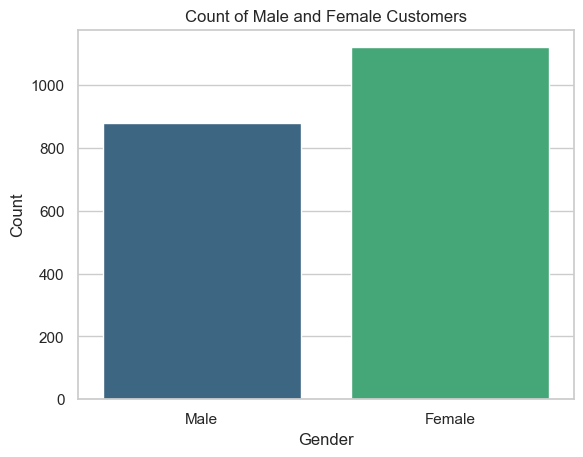

In [18]:
# Check the numbers of male/female customers.
sns.countplot(data=reviews_cleaned, x= "gender", palette="viridis")
plt.title("Count of Male and Female Customers")
plt.xlabel("Gender")
plt.ylabel("Count")
plt.show()

### There are slightly more females than males.

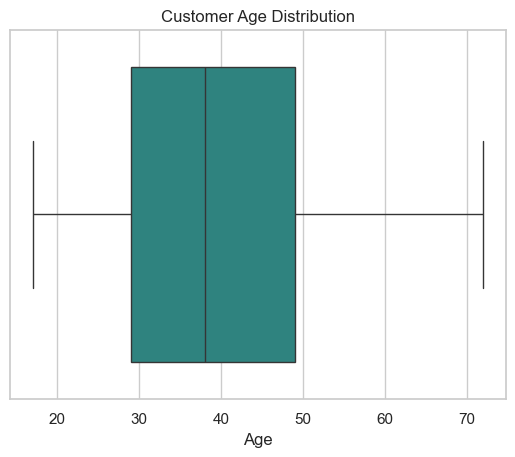

In [19]:
# Check age distribution.
sns.boxplot(data=reviews_cleaned, x="age", palette="viridis")
plt.title("Customer Age Distribution")
plt.xlabel("Age")
plt.show()

### No outliers are present. Half the customers are ~30-50 years old.

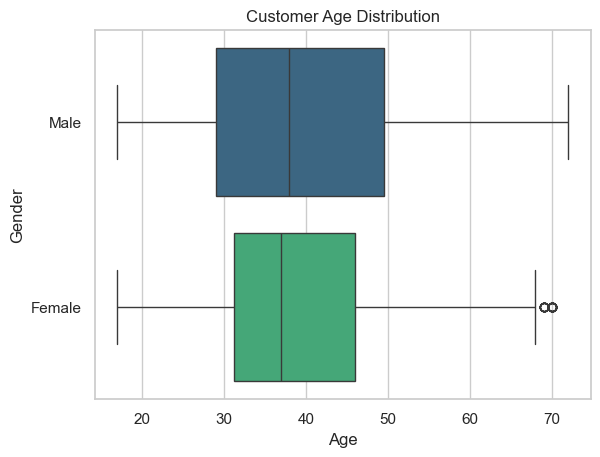

In [20]:
# Check age distribution by gender.
sns.boxplot(data=reviews_cleaned, x="age", y="gender", palette="viridis")
plt.title("Customer Age Distribution")
plt.xlabel("Age")
plt.ylabel("Gender")
plt.show()

### The distributions by gender are quite similar. Two female outliers but they are not very far from the rest of the distribution.

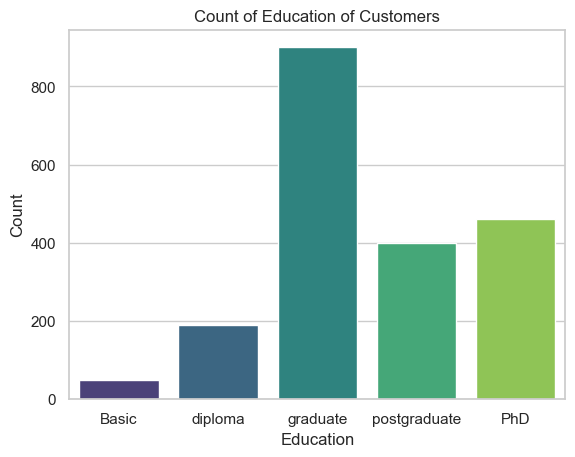

In [21]:
# Check education level counts.
sns.countplot(data=reviews_cleaned, x= "education", palette="viridis", order=["Basic", "diploma", "graduate", "postgraduate", "PhD"])
plt.title("Count of Education of Customers")
plt.xlabel("Education")
plt.ylabel("Count")
plt.show()

### Most customers have graduate and above levels of education.

In [23]:
# Check the distribution yearly income, spending score and loyalty points.
# Use an interactive Plotly plot.

fig = make_subplots(
    rows=1,
    cols=3,
    subplot_titles=[
        "Yearly Income (K£)",
        "Spending Score",
        "Loyalty Points"])

fig.add_trace(
    go.Histogram(x=reviews_cleaned["yearly_income"], nbinsx=20, name="Yearly Income"),
    row=1, col=1)

fig.add_trace(
    go.Histogram(x=reviews_cleaned["spend_score"], nbinsx=15, name="Spending Score"),
    row=1, col=2)

fig.add_trace(
    go.Histogram(x=reviews_cleaned["loyalty_points"], nbinsx=20, name="Loyalty Points"),
    row=1, col=3)

fig.update_layout(
    title_text="Distribution of Variables",
    height=500,
    width=1100,
    bargap=0.07)

fig.update_traces(marker_color="mediumaquamarine")
fig.update_layout(showlegend=False)

fig.show()

### The data is not normally distributed. This is important for future analyses. Loyalty Points is skewed and has a right tail = positive skew. Most customers have 0-2000 loyalty points but many customers have accumulated much more - up to 7000.

#

# Week 1 assignment: Linear regression using Python
The marketing department wants to better understand how users accumulate loyalty points. Therefore, you need to investigate the possible relationships between the loyalty points, age, remuneration, and spending scores.


Use linear regression and goodness of fit metrics to evaluate possible linear relationships between loyalty points and age/renumeration/spending scores to determine whether these can be used to predict the loyalty points.
    1. Specify the independent and dependent variables.
    2. Create the OLS model.
    3. Extract the estimated parameters, standard errors, and predicted values.
    4. Generate the regression table based on the X coefficient and constant values.
    5. Plot the linear regression and add a regression line.

## Note: Assumptions of Linear Regression:

- Linear Relationship between dependent and independent variables.
- Homoscedasticity: residuals have contsant variance: plot residuals against predicted values. Breusch–Pagan test
- Residuals have a mean of zero, normally distributed: Q-Q plot
- independence of residuals
- No significant outliers or missing values

#### There are multiple predictors, so should ideally do a Multiple Linear Regression.

#### First check if linear relationships are present

In [24]:
# Define independent variable.
x = reviews_cleaned["spend_score"] 

# Define dependent variable.
y = reviews_cleaned["loyalty_points"]

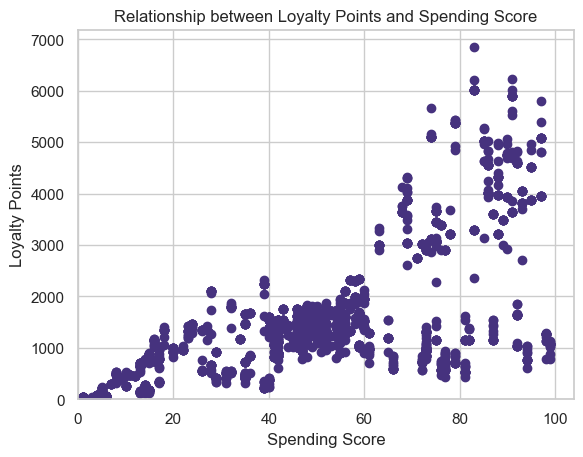

In [25]:
# Check for linearity with Matplotlib.
plt.scatter(x, y)
# Set the x and y limits on the axes.
plt.xlim(0)
plt.ylim(0)
plt.xlabel("Spending Score")
plt.ylabel("Loyalty Points")
plt.title("Relationship between Loyalty Points and Spending Score")
plt.show()

It doesn't look completely linear at high spending scores.

In [26]:
# Define independent variable.
x = reviews_cleaned["yearly_income"] 

# Define dependent variable.
y = reviews_cleaned["loyalty_points"]

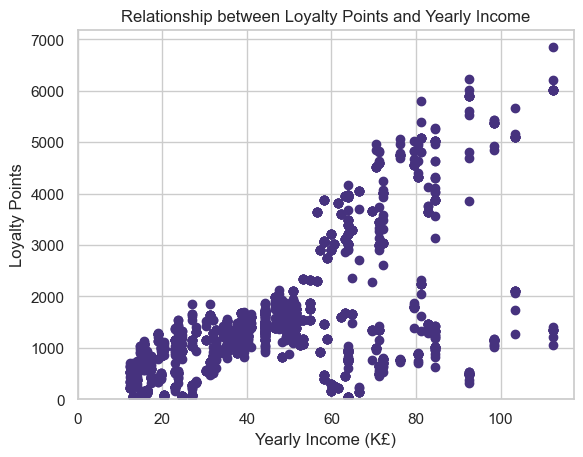

In [27]:
# Check for linearity with Matplotlib.
plt.scatter(x, y)
# Set the x and y limits on the axes.
plt.xlim(0)
plt.ylim(0)
plt.xlabel("Yearly Income (K£)")
plt.ylabel("Loyalty Points")
plt.title("Relationship between Loyalty Points and Yearly Income")
plt.show()

Also does not look completely linear.

In [28]:
# Define independent variable.
x = reviews_cleaned["age"] 

# Define dependent variable.
y = reviews_cleaned["loyalty_points"]

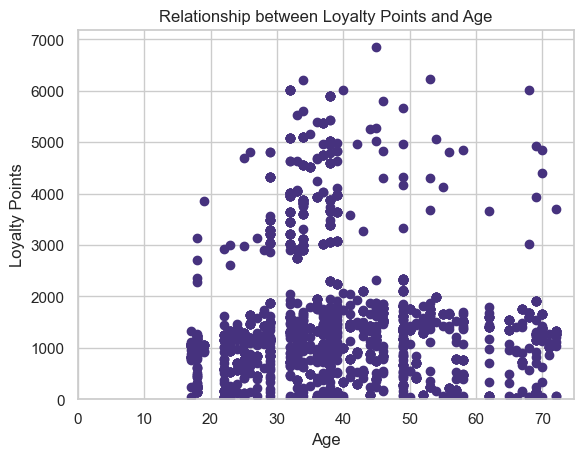

In [29]:
# Check for linearity with Matplotlib.
plt.scatter(x, y)
# Set the x and y limits on the axes.
plt.xlim(0)
plt.ylim(0)
plt.xlabel("Age")
plt.ylabel("Loyalty Points")
plt.title("Relationship between Loyalty Points and Age")
plt.show()

This is definitely not linear.

#### If the relationship is not linear, the model will give biased estimates.
#### Residuals will show patterns (non-random), violating key assumptions.
#### Predictions and inference will be unreliable.

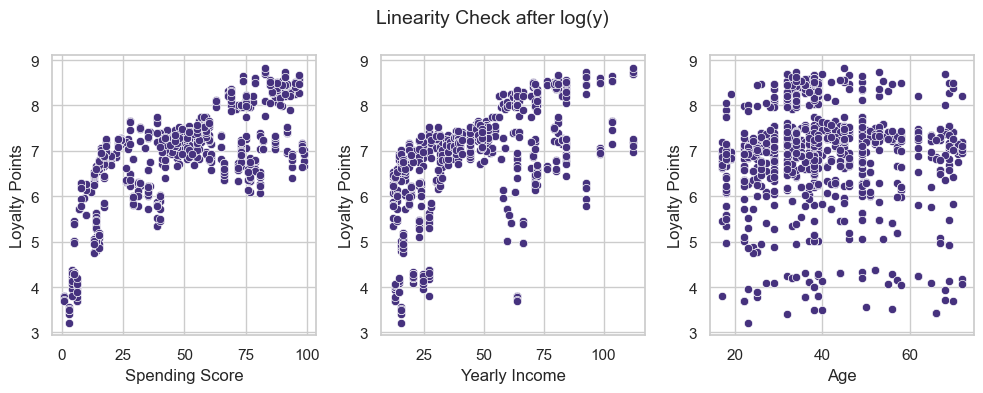

In [30]:
# Try transforming the Y variable with a log transformation.

fig, axes = plt.subplots(1, 3, figsize=(10, 4))

sns.scatterplot(x=reviews_cleaned["spend_score"], y=np.log(reviews_cleaned["loyalty_points"]), ax=axes[0])
axes[0].set_xlabel("Spending Score")
axes[0].set_ylabel("Loyalty Points")

sns.scatterplot(x=reviews_cleaned["yearly_income"], y=np.log(reviews_cleaned["loyalty_points"]), ax=axes[1])
axes[1].set_xlabel("Yearly Income")
axes[1].set_ylabel("Loyalty Points")

sns.scatterplot(x=reviews_cleaned["age"], y=np.log(reviews_cleaned["loyalty_points"]), ax=axes[2])
axes[2].set_xlabel("Age")
axes[2].set_ylabel("Loyalty Points")

fig.suptitle("Linearity Check after log(y)", fontsize=14)

plt.tight_layout()
plt.show()

This does not fix the non-linearity issue.

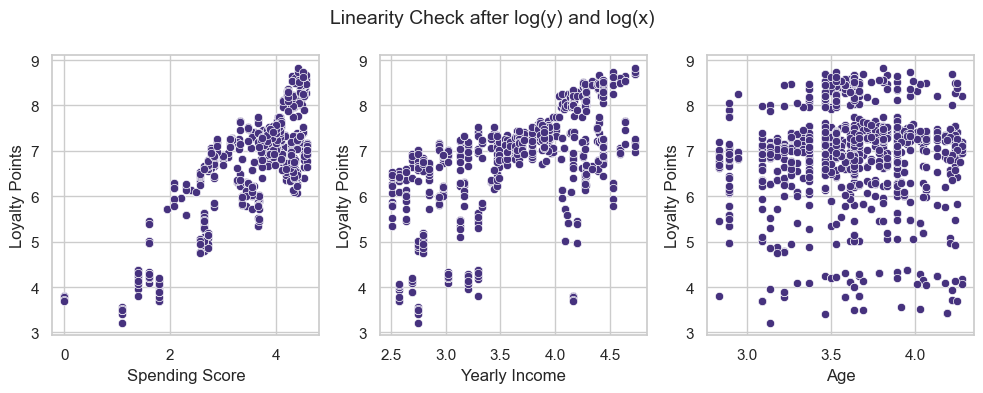

In [31]:
# Transform both x and y with log.

fig, axes = plt.subplots(1, 3, figsize=(10, 4))

sns.scatterplot(x=np.log(reviews_cleaned["spend_score"]), y=np.log(reviews_cleaned["loyalty_points"]), ax=axes[0])
axes[0].set_xlabel("Spending Score")
axes[0].set_ylabel("Loyalty Points")

sns.scatterplot(x=np.log(reviews_cleaned["yearly_income"]), y=np.log(reviews_cleaned["loyalty_points"]), ax=axes[1])
axes[1].set_xlabel("Yearly Income")
axes[1].set_ylabel("Loyalty Points")

sns.scatterplot(x=np.log(reviews_cleaned["age"]), y=np.log(reviews_cleaned["loyalty_points"]), ax=axes[2])
axes[2].set_xlabel("Age")
axes[2].set_ylabel("Loyalty Points")

fig.suptitle("Linearity Check after log(y) and log(x)", fontsize=14)

plt.tight_layout()
plt.show()

### Yearly income and age are still not linearly related to loyalty points. Spending score vs loyalty points is linear.

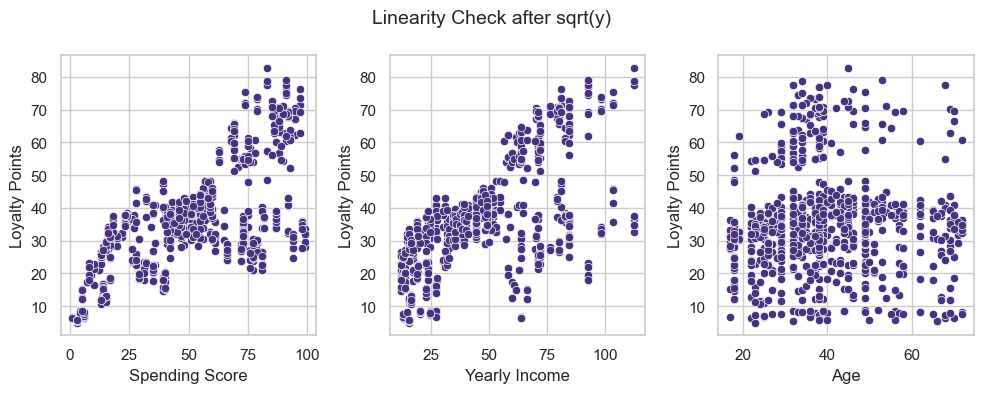

In [32]:
# Try transforming the Y variable with square root.

fig, axes = plt.subplots(1, 3, figsize=(10, 4))

sns.scatterplot(x=reviews_cleaned["spend_score"], y=np.sqrt(reviews_cleaned["loyalty_points"]), ax=axes[0])
axes[0].set_xlabel("Spending Score")
axes[0].set_ylabel("Loyalty Points")

sns.scatterplot(x=reviews_cleaned["yearly_income"], y=np.sqrt(reviews_cleaned["loyalty_points"]), ax=axes[1])
axes[1].set_xlabel("Yearly Income")
axes[1].set_ylabel("Loyalty Points")

sns.scatterplot(x=reviews_cleaned["age"], y=np.sqrt(reviews_cleaned["loyalty_points"]), ax=axes[2])
axes[2].set_xlabel("Age")
axes[2].set_ylabel("Loyalty Points")

fig.suptitle("Linearity Check after sqrt(y)", fontsize=14)

plt.tight_layout()
plt.show()

The issue persists.

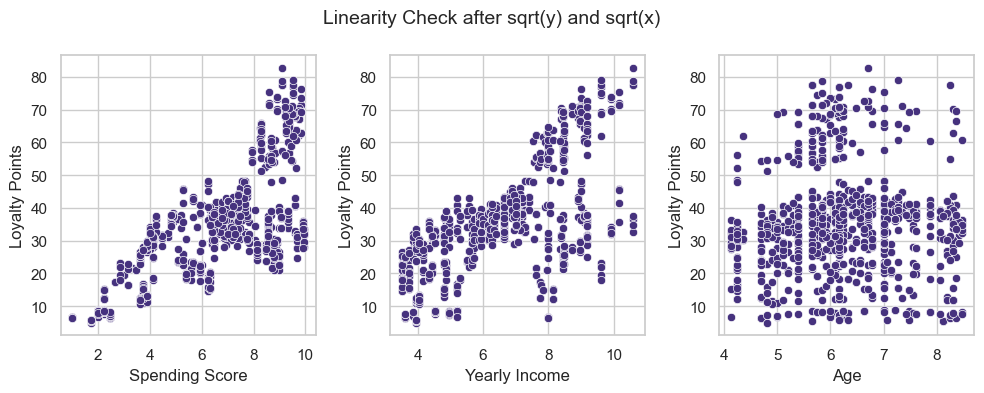

In [33]:
# Transform both x and y with sqrt.

fig, axes = plt.subplots(1, 3, figsize=(10, 4))

sns.scatterplot(x=np.sqrt(reviews_cleaned["spend_score"]), y=np.sqrt(reviews_cleaned["loyalty_points"]), ax=axes[0])
axes[0].set_xlabel("Spending Score")
axes[0].set_ylabel("Loyalty Points")

sns.scatterplot(x=np.sqrt(reviews_cleaned["yearly_income"]), y=np.sqrt(reviews_cleaned["loyalty_points"]), ax=axes[1])
axes[1].set_xlabel("Yearly Income")
axes[1].set_ylabel("Loyalty Points")

sns.scatterplot(x=np.sqrt(reviews_cleaned["age"]), y=np.sqrt(reviews_cleaned["loyalty_points"]), ax=axes[2])
axes[2].set_xlabel("Age")
axes[2].set_ylabel("Loyalty Points")

fig.suptitle("Linearity Check after sqrt(y) and sqrt(x)", fontsize=14)

plt.tight_layout()
plt.show()

SQRT transformation is not useful here.

#### Only Spending Score shows a linear relationship with Loyalty Points (when using log(x) and log(y)); other predictors are non-linear and require alternative modeling.

## Fit the model.

In [34]:
# Define independent variable.
x = np.log(reviews_cleaned["spend_score"])

# Define dependent variable.
y = np.log(reviews_cleaned["loyalty_points"])

# Create model and print summary of metrics.
f = "y ~ x" # this means predict y from x
model = ols(f, data = reviews_cleaned).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.669
Model:                            OLS   Adj. R-squared:                  0.669
Method:                 Least Squares   F-statistic:                     4033.
Date:                Fri, 09 Jan 2026   Prob (F-statistic):               0.00
Time:                        19:21:32   Log-Likelihood:                -1773.1
No. Observations:                2000   AIC:                             3550.
Df Residuals:                    1998   BIC:                             3561.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.3011      0.059     55.543      0.0

> What does the summary indicate? The Model used was log-log → log(Y) = β0 + β1*log(X)
> - $R^2$: 67% of the total variability of log`y` (Loyalty Points), is explained by the variability of log`X` (Spending Score).  
> - F-stat: If the probability of F stat. is smaller than a threshold (usually 0.05), the set of variables of the regression model are significant, else, the regression is not good. For simple regression model, the `t`-statistic is equivalent.
> - `X`: The coefficient of `X` describes the slope of the regression line, in other words, how much the response variable `y` change when `X` changes by 1 unit. If Spending Score (`X`) changes by 1% the Loyalty Points (`y`) will change by 1.0009% (because this is a log-log model).
>  - The `t`-value tests the hypothesis that the slope is significant or not. If the corresponding probability is small (typically smaller than 0.05) the slope is significant. In this case, the probability of the t-value is zero, thus the estimated slope is significant. 
>   - The last two numbers describe the 95% confidence interval of the true x coefficient, i.e. the true slope.





In [35]:
# Extract the estimated parameters.
print("Parameters: ", model.params)

# Extract the standard errors.
print("Standard errors: ", model.bse)  

# Extract the predicted values.
print("Predicted values: ", model.predict())

Parameters:  Intercept    3.301107
x            1.000892
dtype: float64
Standard errors:  Intercept    0.059434
x            0.015761
dtype: float64
Predicted values:  [6.96793671 7.69947611 5.09446505 ... 7.81599029 6.07616912 5.38240371]


In [36]:
# Set the X coefficient and the constant to generate the regression table.
# y_pred = intercep coef + x coef * df[x]
y_pred = (3.301107) + 1.000892 * np.log(reviews_cleaned["spend_score"])

# View the output.
y_pred

0       6.967937
1       7.699476
2       5.094465
3       7.648787
4       6.993277
          ...   
1995    7.538990
1996    5.382403
1997    7.815990
1998    6.076169
1999    5.382403
Name: spend_score, Length: 2000, dtype: float64

In [37]:
# Plot the graph with a regression line.
# Plot the data points with a scatterplot.
fig = go.Figure()

# Scatter points (green)
fig.add_trace(
    go.Scatter(
        x=x,
        y=y,
        mode="markers",
        name="Data Points",
        marker=dict(color="green", opacity=0.7)
    )
)

# Regression line (black)
fig.add_trace(
    go.Scatter(
        x=x,
        y=y_pred,
        mode="lines",
        name="Regression Line",
        line=dict(color="black")
    )
)

# Layout settings
fig.update_layout(
    title="Linear Fit of Loyalty Points and Spending Score",
    xaxis_title="LogSpending Score",
    yaxis_title="LogLoyalty Points",
    plot_bgcolor="white",
    paper_bgcolor="white",
    width=800,
    height=600,
    xaxis=dict(linecolor="black", showgrid=True, gridcolor="lightgrey", zeroline=True, zerolinecolor="lightgrey"),
    yaxis=dict(linecolor="black", showgrid=True, gridcolor="lightgrey", zeroline=True, zerolinecolor="lightgrey"),
    margin=dict(l=60, r=20, t=60, b=60)  # Optional: padding
)

# Set axes limits
fig.update_xaxes(range=[0, max(x)])
fig.update_yaxes(range=[0, max(y)])

fig.show()

#### This looks like it fits ok. Its not a great fit of the data.

## Testing Assumptions to check if the model is a good fit.

In [38]:
"""Linear Regression Assumptions:
- Linear Relationship between dependent and independent variables: linear in this case after log transformation for spending score and lotalty points.
- Homoscedasticity: residuals have contsant variance: plot residuals against predicted values. Breusch–Pagan test
- Residuals have a mean of zero, normally distributed: Q-Q plot
- independence of residuals
- No significant outliers or missing values
"""

# Homoscedasticity - Breusch–Pagan test.
model_h = sms.het_breuschpagan(model.resid, model.model.exog)

# Print the results of the Breusch-Pagan test.
terms = ["LM stat", "LM Test p-value", "F-stat", "F-test p-value"]
print(dict(zip(terms, model_h)))

{'LM stat': np.float64(9.124777577913967), 'LM Test p-value': np.float64(0.0025217054215045677), 'F-stat': np.float64(9.15743256802008), 'F-test p-value': np.float64(0.0025087162576545407)}


#### LM Test p-value: 0.0025. This means heteroscedasticity is present: assumption of homoscedasticity is not met for linear regression. This means we might declare a term as statistically significant when it actually isn’t. Assumption of SLR not met.

In [39]:
# Robust standard errors.
# SEs, t-stats, p-values are corrected for heteroscedasticity.
test_robust = model.get_robustcov_results(cov_type="HC3")
print(test_robust.summary())

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.669
Model:                            OLS   Adj. R-squared:                  0.669
Method:                 Least Squares   F-statistic:                     2963.
Date:                Fri, 09 Jan 2026   Prob (F-statistic):               0.00
Time:                        19:21:32   Log-Likelihood:                -1773.1
No. Observations:                2000   AIC:                             3550.
Df Residuals:                    1998   BIC:                             3561.
Df Model:                           1                                         
Covariance Type:                  HC3                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.3011      0.070     47.273      0.0

#### Significant p-value with robust SEs → relationship is statistically significant even accounting for heteroscedasticity.

#### R² = 0.67 → model explains 67% of variance in log(loyalty_points).

In [40]:
# Test independence of residuals.

dw = durbin_watson(model.resid)
print("Durbin-Watson statistic:", dw)

Durbin-Watson statistic: 0.23999679933887172


≈2 → residuals are independent

<1 or >3 → possible autocorrelation

#### SO in this model, assumption is not met.

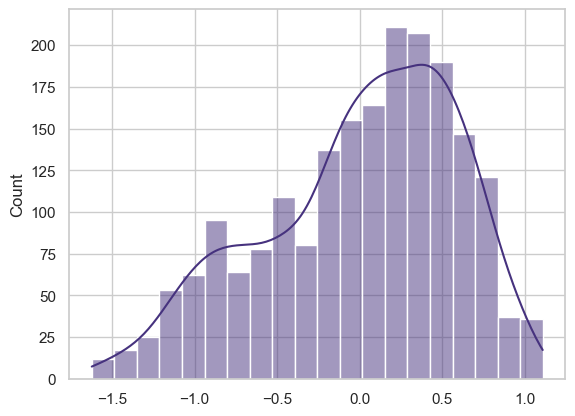

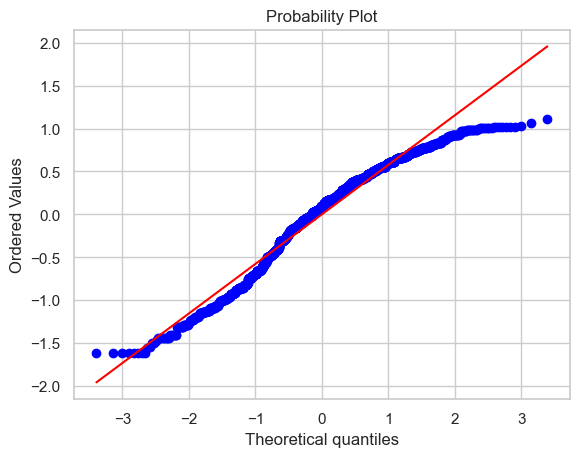

Shapiro-Wilk p-value: 4.764185154023609e-22


In [41]:
# Test Normality of residuals

# Histogram
sns.histplot(model.resid, kde=True)
plt.show()

# Q-Q plot
stats.probplot(model.resid, dist="norm", plot=plt)
plt.show()

# Shapiro-Wilk test
shapiro_test = stats.shapiro(model.resid)
print("Shapiro-Wilk p-value:", shapiro_test.pvalue)

#### The residuals are not normally distributed. Assumption not met.

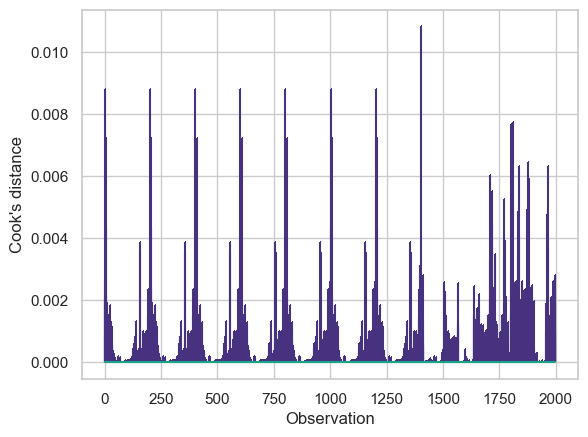

Influential points threshold: 0.002
Influential observations: [   1    2    3    6    7    8  156  158  192  201  202  203  206  207
  208  356  358  392  401  402  403  406  407  408  556  558  592  601
  602  603  606  607  608  756  758  792  801  802  803  806  807  808
  956  958  992 1001 1002 1003 1006 1007 1008 1156 1158 1192 1201 1202
 1203 1206 1207 1208 1356 1358 1392 1400 1401 1403 1405 1407 1412 1506
 1508 1565 1639 1658 1708 1709 1711 1712 1713 1715 1716 1718 1720 1724
 1732 1772 1776 1780 1802 1803 1807 1809 1815 1823 1831 1833 1836 1838
 1841 1852 1860 1864 1874 1878 1880 1884 1891 1894 1960 1964 1966 1980
 1985 1988 1996 1999]


In [42]:
# Test influence of outliers.
influence = model.get_influence()
(c, p) = influence.cooks_distance

plt.stem(np.arange(len(c)), c, markerfmt=",")
plt.xlabel("Observation")
plt.ylabel("Cook's distance")
plt.show()

threshold = 4 / len(model.resid)
print("Influential points threshold:", threshold)

# List influential points
influential_points = np.where(c > threshold)[0]
print("Influential observations:", influential_points)

In [43]:
len(influential_points)

116

## Observations and insights

### Linear regression isn’t a good fit in this case.

- Non-linearity: Age and yearly income predictors don’t have a linear relationship with the outcome, even after transformation, so these were excluded entirely.

- Heteroscedasticity: Breusch-Pagan test shows non-constant residual variance.

- Residuals are not independent. 0.24 Durbin-Watson Statistic.

- Non-normal residuals: Shapiro-Wilk / histogram / qq plot shows deviations from normality.

- Influential points: 116 influential points is a lot for only 2000 observations. This suggests linear regression is highly sensitive to individual data points.

#### Alternative models should be used instead.

#

# Week 2 assignment: Exploring the structure using decision trees.

The team wants you to use decision trees to attempt to better understand the structure found in the data. You need to grow and prune a decision tree regressor and then visualise and interpret the output.

## 1. Review the data

In [44]:
# Refresher of the dataset:
reviews_cleaned.head()

,gender,age,yearly_income,spend_score,loyalty_points,education,product,review,summary
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap


In [45]:
# Will not be using review or summary or product columns for the decision tree:
tree = reviews_cleaned[["gender", "age", "yearly_income", "spend_score", "loyalty_points", "education"]]
tree.head()

,gender,age,yearly_income,spend_score,loyalty_points,education
0,Male,18,12.30,39,210,graduate
1,Male,23,12.30,81,524,graduate
2,Female,22,13.12,6,40,graduate
3,Female,25,13.12,77,562,graduate
4,Female,33,13.94,40,366,graduate


In [46]:
""" A Note on Scaling:
Tree-based models like Decision Trees, Random Forests, Gradient Boosting split on thresholds (e.g., feature < value).
They don’t care about the scale or units of the features.
Whether age is 0–100 or 0–1 doesn’t affect which splits are chosen.
They also handle non-linear relationships naturally.
So age, spending score (0–100), and income (12–112) are fine as-is. No Scaling Needed.
"""

' A Note on Scaling:\nTree-based models like Decision Trees, Random Forests, Gradient Boosting split on thresholds (e.g., feature < value).\nThey don’t care about the scale or units of the features.\nWhether age is 0–100 or 0–1 doesn’t affect which splits are chosen.\nThey also handle non-linear relationships naturally.\nSo age, spending score (0–100), and income (12–112) are fine as-is. No Scaling Needed.\n'

In [47]:
# Name new DataFrame and convert categorical variables to dummy variables.
cat_vars=["gender", "education"]

# Specify what needs to apply to all the variables with a for loop.
for var in cat_vars:  
    # Specify details of the categorical list.
    cat_list = pd.get_dummies(tree[var], prefix=var)  # multicollienearity not an issue so dont have to drop first like in BLR
    # Indicate the joining of the DataFrames.
    tree = tree.join(cat_list) 

In [48]:
# Drop the original gender and education columns
tree = tree.drop(cat_vars, axis=1) 
tree.head()

,age,yearly_income,spend_score,loyalty_points,gender_Female,gender_Male,education_Basic,education_PhD,education_diploma,education_graduate,education_postgraduate
0,18,12.30,39,210,False,True,False,False,False,True,False
1,23,12.30,81,524,False,True,False,False,False,True,False
2,22,13.12,6,40,True,False,False,False,False,True,False
3,25,13.12,77,562,True,False,False,False,False,True,False
4,33,13.94,40,366,True,False,False,False,False,True,False


In [49]:
# Specify Y.
y = tree["loyalty_points"]
# Specify X.
cols = tree.columns[tree.columns != "loyalty_points"] 
X = tree[cols]

In [50]:
# Review X and Y.
print(y)
X.head()

0        210
1        524
2         40
3        562
4        366
        ... 
1995    4031
1996     539
1997    5614
1998    1048
1999     479
Name: loyalty_points, Length: 2000, dtype: int64


,age,yearly_income,spend_score,gender_Female,gender_Male,education_Basic,education_PhD,education_diploma,education_graduate,education_postgraduate
0,18,12.30,39,False,True,False,False,False,True,False
1,23,12.30,81,False,True,False,False,False,True,False
2,22,13.12,6,True,False,False,False,False,True,False
3,25,13.12,77,True,False,False,False,False,True,False
4,33,13.94,40,True,False,False,False,False,True,False


## 2. Create train and test data sets.

In [51]:
# Split the data into test and train data.
# Split the data training and testing 30/70.
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.3,
                                                    random_state=42)

## 3. Create Decision tree regressor

In [52]:
# Create the DecisionTreeRegressor class 
# (which has many parameters; input only random_state=42).
regressor = DecisionTreeRegressor(random_state=42)
""" defaults:
criterion = "squared_error"
max_depth = None → tree grows until leaves are pure
min_samples_split = 2
min_samples_leaf = 1 """

# Fit the regressor object to the data set.
regressor.fit(X_train,y_train)  

DecisionTreeRegressor(random_state=42)

In [53]:
# Evaluate the model.
# Predict the response for the data test.
y_predict = regressor.predict(X_test)  

# Specify to print the MAE and MSE (to evaluate the accuracy of the new model).
print("Mean Absolute Error: ", metrics.mean_absolute_error(y_test, y_predict))
print("Mean Squared Error: ", metrics.mean_squared_error(y_test, y_predict))
# Calculate the RMSE.
print("Root Mean Squared Error: ", 
     math.sqrt(metrics.mean_squared_error(y_test, y_predict)))  

Mean Absolute Error:  31.948333333333334
Mean Squared Error:  7599.018333333333
Root Mean Squared Error:  87.17234844452301


In [54]:
87.17-31.95

55.22

#### RMSE measures the average difference between the predicted and true values. A typical prediction error is about 87 loyalty points, with large errors contributing disproportionately.
#### MAE ≈ 32 → On average, predictions are about 32 points off.
#### RMSE ≈ 87 → Occasionally, there are much larger errors.
#### Let's compare RMSE and MAE. The difference between them is 87.17-31.95 = 55.22. Numbers close to 0 indicate that there are no large errors in the forecast. Therefore, a value of 55.22 is not bad, considering loyalty points range from 0-7000. Pruning may help, however.

<Axes: xlabel='max_depth'>

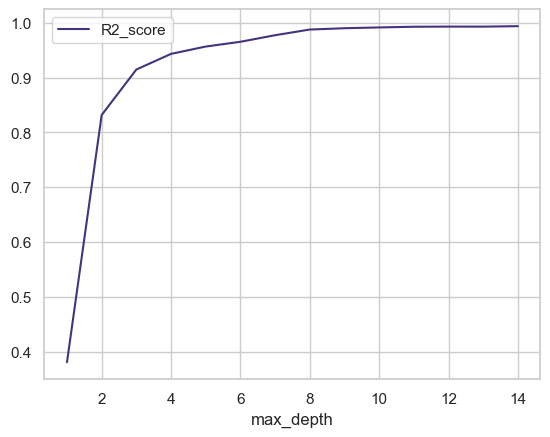

In [55]:
# Prune the model.
# Determine the optimal value for max depth

max_depth_range = list(range(1, 15))   # try depths 1–14
scores = []

for depth in max_depth_range:
    reg = DecisionTreeRegressor(max_depth=depth, random_state=42)
    reg.fit(X_train, y_train)
    score = reg.score(X_test, y_test)
    scores.append(score)

# Convert to DataFrame for easy plotting
scores_df = pd.DataFrame({
    "max_depth": max_depth_range,
    "R2_score": scores
})

scores_df.plot(x="max_depth", y="R2_score")


In [56]:
# Check the actual depth of the unconstrained regression tree.
reg = DecisionTreeRegressor(random_state=42)
reg.fit(X_train, y_train)
print(reg.get_depth())

23


#### May be overfitting when unconstrained - depth of 23, plot above shows not much better after depth of 4-6.
#### 23 = memorising noise, splitting extremely deeply, fitting tiny subgroups of the training data, achieving near-perfect R² on the training set but may not generalise well.

Deeper trees memorise noise

Shallow trees generalise better

In [57]:
# Fit with a max depth of 3.
regressor3 = DecisionTreeRegressor(max_depth=3, random_state=42)
regressor3.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=3, random_state=42)

In [58]:
# Evaluate the model.
# Predict the response for the data test.
y_predict3 = regressor3.predict(X_test)  

# Specify to print the MAE and MSE (to evaluate the accuracy of the new model).
print("Mean Absolute Error: ", metrics.mean_absolute_error(y_test, y_predict3))
print("Mean Squared Error: ", metrics.mean_squared_error(y_test, y_predict3))
# Calculate the RMSE.
print("Root Mean Squared Error: ", 
     math.sqrt(metrics.mean_squared_error(y_test, y_predict3)))  

Mean Absolute Error:  267.1299251233641
Mean Squared Error:  137962.67325147352
Root Mean Squared Error:  371.4332689077185


This is worse than the original model.

In [59]:
# Fit with a max depth of 4.
regressor4 = DecisionTreeRegressor(max_depth=4, random_state=42)
regressor4.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=4, random_state=42)

In [60]:
# Evaluate the model.
# Predict the response for the data test.
y_predict4 = regressor4.predict(X_test)  

# Specify to print the MAE and MSE (to evaluate the accuracy of the new model).
print("Mean Absolute Error: ", metrics.mean_absolute_error(y_test, y_predict4))
print("Mean Squared Error: ", metrics.mean_squared_error(y_test, y_predict4))
# Calculate the RMSE.
print("Root Mean Squared Error: ", 
     math.sqrt(metrics.mean_squared_error(y_test, y_predict4)))  

Mean Absolute Error:  215.35861879797181
Mean Squared Error:  91766.39848457077
Root Mean Squared Error:  302.929692312541


This is worse than the original model.

In [61]:
# Fit with a max depth of 5.
regressor5 = DecisionTreeRegressor(max_depth=5, random_state=42)
regressor5.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=5, random_state=42)

In [62]:
# Evaluate the model.
# Predict the response for the data test.
y_predict5 = regressor5.predict(X_test)  

# Specify to print the MAE and MSE (to evaluate the accuracy of the new model).
print("Mean Absolute Error: ", metrics.mean_absolute_error(y_test, y_predict5))
print("Mean Squared Error: ", metrics.mean_squared_error(y_test, y_predict5))
# Calculate the RMSE.
print("Root Mean Squared Error: ", 
     math.sqrt(metrics.mean_squared_error(y_test, y_predict5)))  

Mean Absolute Error:  176.80646418311764
Mean Squared Error:  70121.16425180058
Root Mean Squared Error:  264.8040110190942


This is worse than the original model.

In [63]:
# Fit with a max depth of 6.
regressor6 = DecisionTreeRegressor(max_depth=6, random_state=42)
regressor6.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=6, random_state=42)

In [64]:
# Evaluate the model.
# Predict the response for the data test.
y_predict6 = regressor6.predict(X_test)  

# Specify to print the MAE and MSE (to evaluate the accuracy of the new model).
print("Mean Absolute Error: ", metrics.mean_absolute_error(y_test, y_predict6))
print("Mean Squared Error: ", metrics.mean_squared_error(y_test, y_predict6))
# Calculate the RMSE.
print("Root Mean Squared Error: ", 
     math.sqrt(metrics.mean_squared_error(y_test, y_predict6)))  

Mean Absolute Error:  152.514971328853
Mean Squared Error:  56065.258352149154
Root Mean Squared Error:  236.7810346124646


This is worse than the original model.

In [65]:
# Fit with a max depth of 7.
regressor7 = DecisionTreeRegressor(max_depth=7, random_state=42)
regressor7.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=7, random_state=42)

In [66]:
# Evaluate the model.
# Predict the response for the data test.
y_predict7 = regressor7.predict(X_test)  

# Specify to print the MAE and MSE (to evaluate the accuracy of the new model).
print("Mean Absolute Error: ", metrics.mean_absolute_error(y_test, y_predict7))
print("Mean Squared Error: ", metrics.mean_squared_error(y_test, y_predict7))
# Calculate the RMSE.
print("Root Mean Squared Error: ", 
     math.sqrt(metrics.mean_squared_error(y_test, y_predict7)))  

Mean Absolute Error:  118.80886386732823
Mean Squared Error:  36642.7591212343
Root Mean Squared Error:  191.42298483002062


This is worse than the original model.

Unconstrained tree overfits badly

Constrained trees underfit

In [67]:
# Try changing the criterion of the original model.
regressor_ab = DecisionTreeRegressor(criterion="absolute_error", random_state=42)
""" defaults:
criterion = "squared_error"
max_depth = None → tree grows until leaves are pure
min_samples_split = 2
min_samples_leaf = 1 """

# Fit the regressor object to the data set.
regressor_ab.fit(X_train,y_train)  

DecisionTreeRegressor(criterion='absolute_error', random_state=42)

In [68]:
# Evaluate the model.
# Predict the response for the data test.
y_predict_ab = regressor_ab.predict(X_test)  

# Specify to print the MAE and MSE (to evaluate the accuracy of the new model).
print("Mean Absolute Error: ", metrics.mean_absolute_error(y_test, y_predict_ab))
print("Mean Squared Error: ", metrics.mean_squared_error(y_test, y_predict_ab))
# Calculate the RMSE.
print("Root Mean Squared Error: ", 
     math.sqrt(metrics.mean_squared_error(y_test, y_predict_ab)))  

Mean Absolute Error:  34.44166666666667
Mean Squared Error:  10415.018333333333
Root Mean Squared Error:  102.05399714530212


This is worse than the original model.

Changing the critorion does not help.

In [69]:
# Try changing the min_samples_leaf.
configs = [
    {"max_depth": 5, "min_samples_leaf": 1},
    {"max_depth": 5, "min_samples_leaf": 10},
    {"max_depth": 5, "min_samples_leaf": 20},
    {"max_depth": 6, "min_samples_leaf": 10},
    {"max_depth": 6, "min_samples_leaf": 20},
    {"min_samples_leaf": 10},
    {"min_samples_leaf": 20}
]

for cfg in configs:
    reg = DecisionTreeRegressor(
        random_state=42,
        criterion="squared_error",
        **cfg
    )
    reg.fit(X_train, y_train)
    preds = reg.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, preds))
    print(cfg, "RMSE:", rmse)

{'max_depth': 5, 'min_samples_leaf': 1} RMSE: 264.8040110190942
{'max_depth': 5, 'min_samples_leaf': 10} RMSE: 252.1836827537629
{'max_depth': 5, 'min_samples_leaf': 20} RMSE: 259.9960687801507
{'max_depth': 6, 'min_samples_leaf': 10} RMSE: 203.39211224799573
{'max_depth': 6, 'min_samples_leaf': 20} RMSE: 238.2512581129491
{'min_samples_leaf': 10} RMSE: 154.43847772660072
{'min_samples_leaf': 20} RMSE: 213.51014343567815


These are all worse than the original model.

### The first model was the best.

Additional regularisation parameters (minimum samples per split and leaf size) were explored to reduce variance. However, these adjustments did not have improvements.

RMSE–MAE reflects the presence of large errors, but it’s not a measure of predictive accuracy. Model selection was therefore based primarily on RMSE, with MAE used as a robustness check.

Model performance was evaluated using MAE and RMSE. The average absolute prediction error was approximately 32 loyalty points, while RMSE was 87 points, reflecting the presence of some larger errors. Given that most loyalty point values lie between 0 and 2000, this indicates good predictive accuracy for the majority of observations.

## 4. Plot best model.

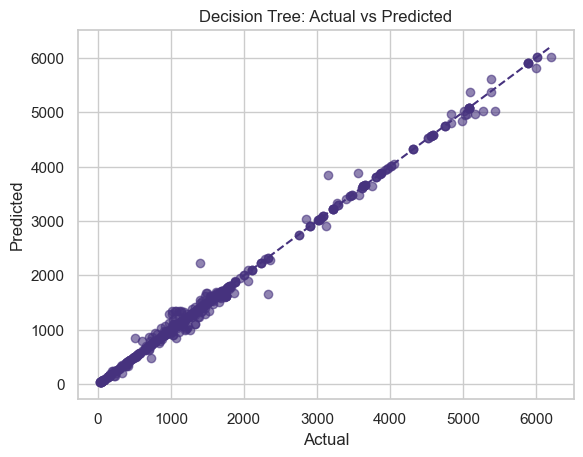

In [70]:
# Plot Predicted vs Actual Loyalty Points
plt.scatter(y_test, y_predict, alpha=0.6)
plt.plot([y_test.min(), y_test.max()],
         [y_test.min(), y_test.max()],
         linestyle="--")
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Decision Tree: Actual vs Predicted")
plt.show()

#### This looks like a very good fit. There are some points that deviate from the diagonal line, but mostly, the points are clustered around it.
#### The model captures the main relationship.

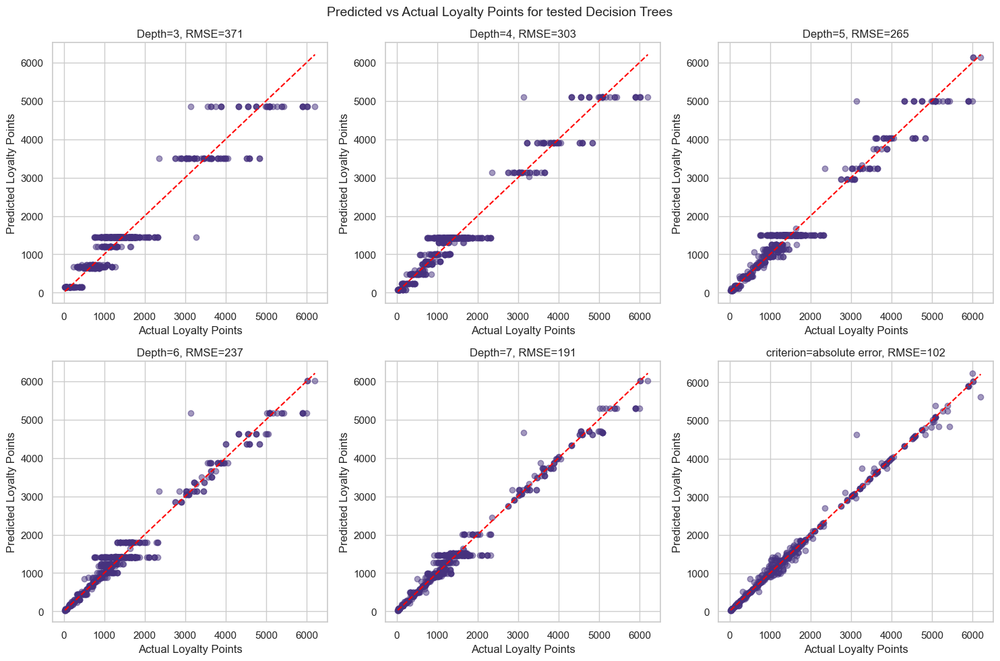

In [71]:
# View the other tested decision tree models.
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

axes[0, 0].scatter(y_test, y_predict3, alpha=0.5)
axes[0, 0].plot(
    [y_test.min(), y_test.max()],
    [y_test.min(), y_test.max()],
    color="red",
    linestyle="--")
axes[0,0].set_xlabel("Actual Loyalty Points")
axes[0,0].set_ylabel("Predicted Loyalty Points")
axes[0,0].set_title("Depth=3, RMSE=371")



axes[0,1].scatter(y_test, y_predict4, alpha=0.5)
axes[0, 1].plot(
    [y_test.min(), y_test.max()],
    [y_test.min(), y_test.max()],
    color="red",
    linestyle="--")
axes[0,1].set_xlabel("Actual Loyalty Points")
axes[0,1].set_ylabel("Predicted Loyalty Points")
axes[0,1].set_title("Depth=4, RMSE=303")


axes[0,2].scatter(y_test, y_predict5, alpha=0.5)
axes[0, 2].plot(
    [y_test.min(), y_test.max()],
    [y_test.min(), y_test.max()],
    color="red",
    linestyle="--")
axes[0,2].set_xlabel("Actual Loyalty Points")
axes[0,2].set_ylabel("Predicted Loyalty Points")
axes[0,2].set_title("Depth=5, RMSE=265")



axes[1,0].scatter(y_test, y_predict6, alpha=0.5)
axes[1, 0].plot(
    [y_test.min(), y_test.max()],
    [y_test.min(), y_test.max()],
    color="red",
    linestyle="--")
axes[1,0].set_xlabel("Actual Loyalty Points")
axes[1,0].set_ylabel("Predicted Loyalty Points")
axes[1,0].set_title("Depth=6, RMSE=237")



axes[1,1].scatter(y_test, y_predict7, alpha=0.5)
axes[1, 1].plot(
    [y_test.min(), y_test.max()],
    [y_test.min(), y_test.max()],
    color="red",
    linestyle="--")
axes[1,1].set_xlabel("Actual Loyalty Points")
axes[1,1].set_ylabel("Predicted Loyalty Points")
axes[1,1].set_title("Depth=7, RMSE=191")



axes[1,2].scatter(y_test, y_predict_ab, alpha=0.5)
axes[1, 2].plot(
    [y_test.min(), y_test.max()],
    [y_test.min(), y_test.max()],
    color="red",
    linestyle="--")
axes[1,2].set_xlabel("Actual Loyalty Points")
axes[1,2].set_ylabel("Predicted Loyalty Points")
axes[1,2].set_title("criterion=absolute error, RMSE=102")


fig.suptitle("Predicted vs Actual Loyalty Points for tested Decision Trees", fontsize=14)

plt.tight_layout()
plt.show()

#### The original model is visually better at predicting loyalty points.

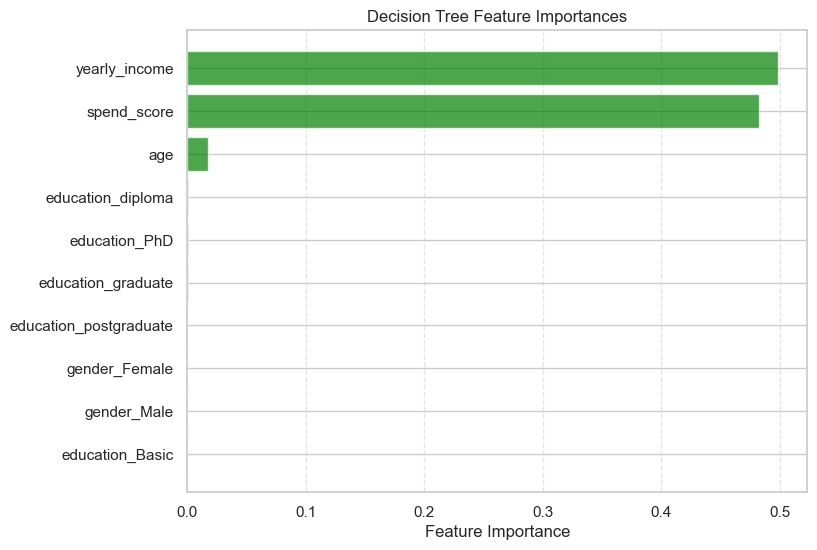

In [72]:
# Get feature importances
importances = regressor.feature_importances_
features = X_train.columns 

# Create a DataFrame and sort
feat_df = pd.DataFrame({
    "Feature": features,
    "Importance": importances
}).sort_values(by="Importance", ascending=True)

# Plot
plt.figure(figsize=(8,6))
plt.barh(feat_df["Feature"], feat_df["Importance"], color="green", alpha=0.7)
plt.xlabel("Feature Importance")
plt.title("Decision Tree Feature Importances")
plt.grid(axis="x", linestyle="--", alpha=0.5)
plt.show()

In [73]:
# Create a decision tree using only the important features to see if it improves accuracy (remove unnecessary complexity).
# Specify Y.
y = tree["loyalty_points"]
# Specify X.
cols = ["age", "spend_score", "yearly_income"]
X1 = tree[cols]

In [74]:
X1_train, X1_test, y_train, y_test = train_test_split(X1, y,
                                                    test_size=0.3,
                                                    random_state=42)

In [75]:
# Create the DecisionTreeRegressor class 
# (which has many parameters; input only random_state=42).
regressor_X1 = DecisionTreeRegressor(random_state=42)
""" defaults:
criterion = "squared_error"
max_depth = None → tree grows until leaves are pure
min_samples_split = 2
min_samples_leaf = 1 """

# Fit the regressor object to the data set.
regressor_X1.fit(X1_train,y_train)  

DecisionTreeRegressor(random_state=42)

In [76]:
# Evaluate the model.
# Predict the response for the data test.
y_predict_X1 = regressor_X1.predict(X1_test)  

# Specify to print the MAE and MSE (to evaluate the accuracy of the new model).
print("Mean Absolute Error: ", metrics.mean_absolute_error(y_test, y_predict_X1))
print("Mean Squared Error: ", metrics.mean_squared_error(y_test, y_predict_X1))
# Calculate the RMSE.
print("Root Mean Squared Error: ", 
     math.sqrt(metrics.mean_squared_error(y_test, y_predict_X1)))  

Mean Absolute Error:  26.171666666666667
Mean Squared Error:  6390.448333333334
Root Mean Squared Error:  79.94027979268857


#### By retaining only the three most important predictors (age, spend_score, and yearly_income), the decision tree’s predictive performance improved. The mean absolute error decreased from 32 to 26, and the root mean squared error decreased from 87 to 80, indicating that removing less informative features reduced noise and allowed the model to focus on the key drivers of the target variable.

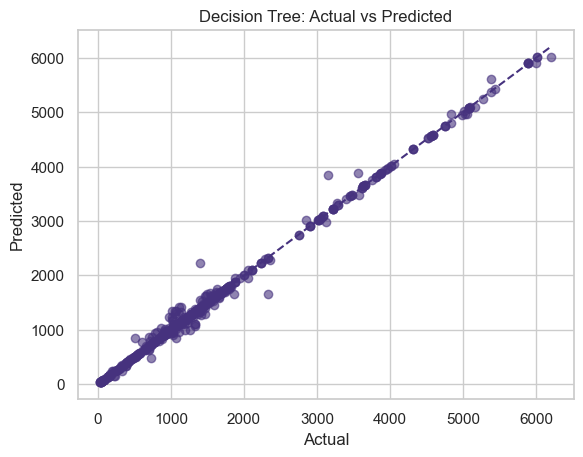

In [77]:
# Plot the Actual vs Predicted of the final model.
plt.scatter(y_test, y_predict_X1, alpha=0.6)
plt.plot([y_test.min(), y_test.max()],
         [y_test.min(), y_test.max()],
         linestyle="--")
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Decision Tree: Actual vs Predicted")
plt.show()

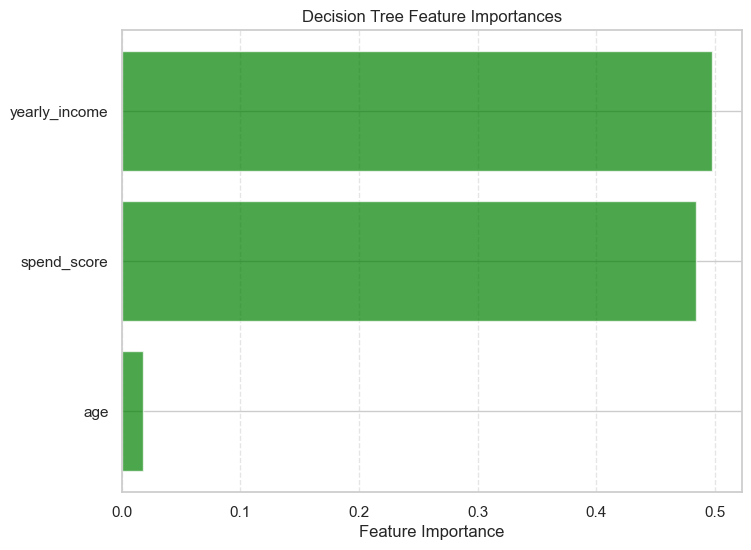

In [78]:
# Get feature importances
importances = regressor_X1.feature_importances_
features = X1_train.columns

# Create a DataFrame and sort
feat_df = pd.DataFrame({
    "Feature": features,
    "Importance": importances
}).sort_values(by="Importance", ascending=True)

# Plot
plt.figure(figsize=(8,6))
plt.barh(feat_df["Feature"], feat_df["Importance"], color="green", alpha=0.7)
plt.xlabel("Feature Importance")
plt.title("Decision Tree Feature Importances")
plt.grid(axis="x", linestyle="--", alpha=0.5)
plt.show()


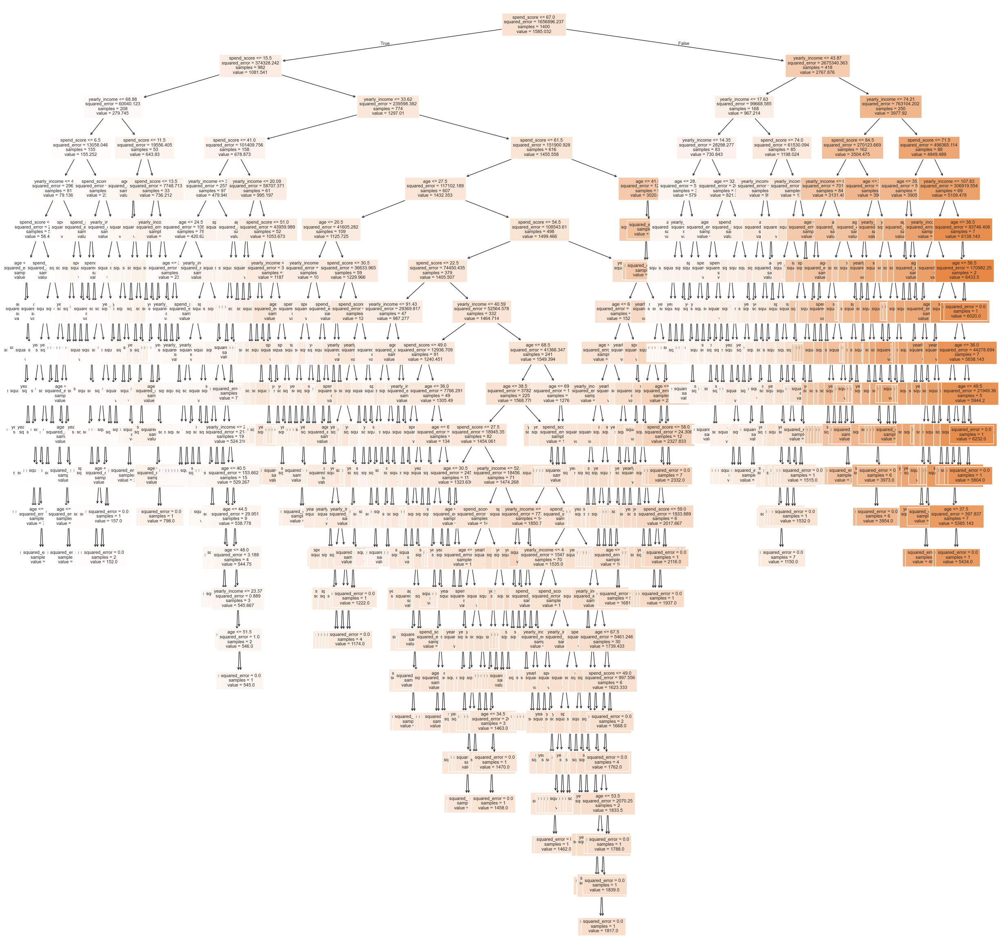

In [79]:
# Plot the tree
fig, ax = plt.subplots(figsize=(30, 30))
plot_tree(regressor_X1, feature_names=X1_train.columns, filled=True, fontsize=8)
plt.show()

The tree is quite complicated. Not for presentation use.

#### As The Decision Tree showed that education and gender don't really add value, they will be left out from the subsequent work: simplifies the model and avoids unnecessary noise.

In [80]:
# Use only numerical columns
tree = reviews_cleaned[["age", "yearly_income", "spend_score", "loyalty_points"]]
tree.head()

,age,yearly_income,spend_score,loyalty_points
0,18,12.30,39,210
1,23,12.30,81,524
2,22,13.12,6,40
3,25,13.12,77,562
4,33,13.94,40,366


## Random Forest Model

In [81]:
""" Specify that the column loyalty_points 
should be moved into a separate DataFrame."""
cols = tree.columns[tree.columns != "loyalty_points"]  

cols

Index(['age', 'yearly_income', 'spend_score'], dtype='object')

In [82]:
# Specify 'X' as the independent variables 
# and 'y' as the dependent variable.
X = tree[cols]
y = tree["loyalty_points"]

# Split the data training and testing 30/70.
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.3,
                                                    random_state=42)

# Create the regressor object.
regressor = RandomForestRegressor(n_estimators=5, 
                                  random_state=42, 
                                  n_jobs=2)

# Fit the regressor to the data set, and predict the y variable.
regressor.fit(X_train, y_train)

RandomForestRegressor(n_estimators=5, n_jobs=2, random_state=42)

In [83]:
y_pred = regressor.predict(X_test)
len(y_pred)

600

In [84]:
# Calculate and display the metrics.
print("Mean Absolute Error:", metrics.mean_absolute_error(y_test, y_pred)) 
print("Mean Squared Error:", metrics.mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error:", np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error: 26.511
Mean Squared Error: 5896.889800000001
Root Mean Squared Error: 76.79120913229588


For Outliers / big errors → Random Forest is better (lower RMSE)\
For Typical error → Decision Tree / Random Forest similar (very slightly lower MAE with Decision Tree)

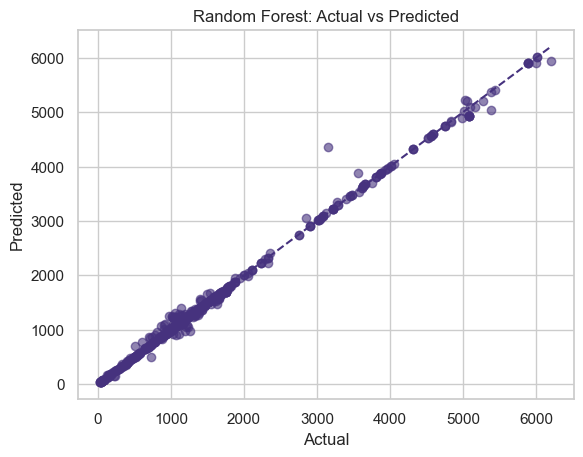

In [85]:
# Plot
plt.scatter(y_test, y_pred, alpha=0.6)
plt.plot([y_test.min(), y_test.max()],
         [y_test.min(), y_test.max()],
         linestyle="--")
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Random Forest: Actual vs Predicted")
plt.show()

## Gradient Boosting Regressor Model

In [86]:
# Basic GBR
gbr = GradientBoostingRegressor(
    random_state=42
)

gbr.fit(X_train, y_train)

y_pred = gbr.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")

MAE: 51.42
RMSE: 73.35


MAE worse, RMSE better (than random forest)

In [87]:
"""
Tuned GBR
More trees (n_estimators)
Smaller steps (learning_rate)
Shallow trees → better generalisation
Subsampling → reduces overfitting
"""
gbr = GradientBoostingRegressor(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=3,
    subsample=0.8,
    random_state=42
)

gbr.fit(X_train, y_train)
y_pred = gbr.predict(X_test)

In [88]:
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")

MAE: 39.06
RMSE: 54.22


MAE worse, RMSE better (than random forest)

In [89]:
# Hyperparameter tuning: Gridsearch GBR
param_grid = {
    "n_estimators": [200, 300],
    "learning_rate": [0.05, 0.1],
    "max_depth": [3, 4],
    "subsample": [0.8, 1.0]
}

grid = GridSearchCV(
    GradientBoostingRegressor(random_state=42),
    param_grid,
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=-1
)

# Fit grid search
grid.fit(X_train, y_train)

# Extract best model
best_model = grid.best_estimator_

y_pred = best_model.predict(X_test)

In [90]:
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")

MAE: 12.53
RMSE: 23.49


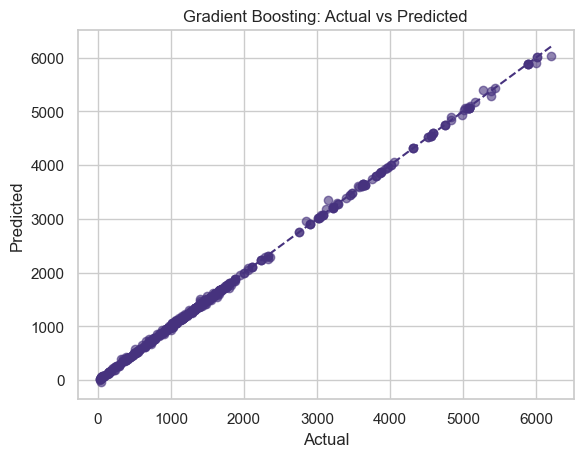

In [91]:
# Plot
plt.scatter(y_test, y_pred, alpha=0.6)
plt.plot([y_test.min(), y_test.max()],
         [y_test.min(), y_test.max()],
         linestyle="--")
plt.xlabel("Actual")
plt.ylabel("Predicted")
plt.title("Gradient Boosting: Actual vs Predicted")
plt.show()

In [92]:
# feature importance
importances = pd.Series(
    best_model.feature_importances_,
    index=X_train.columns
).sort_values(ascending=False)

print(importances)

yearly_income    0.503666
spend_score      0.476118
age              0.020216
dtype: float64


I implemented Gradient Boosting regression, tuning learning rate and tree depth to improve performance. The model achieved lower RMSE than baseline linear and tree models, demonstrating strong performance on non-linear relationships.

Is the drop in MAE/RMSE too much? Leakage or evaluation error?

In [93]:
X_train.shape, X_test.shape

((1400, 3), (600, 3))

If test set is very small, variance can explode. But this is not the case here. Low MAE is not explained by a tiny test set.

In [94]:
print("CV MAE:", -grid.best_score_)
print("Test MAE:", mae)

CV MAE: 15.576221032707627
Test MAE: 12.533155175709096


The gap (~3 MAE) is reasonable, not extreme.

So, the tuned GB model is:

Reducing extreme prediction errors.

Fitting the signal more smoothly.

After evaluating Linear Regression, Decision Trees, and Random Forests, a tuned Gradient Boosting Regressor achieved the best performance (MAE = 12.5, RMSE = 23.5), significantly reducing prediction error. This suggests the relationship between features and target is non-linear but smooth, which Gradient Boosting captures effectively.

## XGBoost Model

In [95]:
# XGBoost Regressor fit.
xgbr = xgb.XGBRegressor(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=3,
    random_state=42
)
xgbr.fit(X_train, y_train)
y_pred = xgbr.predict(X_test)

In [96]:
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")

MAE: 42.31
RMSE: 59.79


XGBoost MAE/RMSE are higher than sklearn GradientBoostingRegressor

Only 1400 training rows, 3 features → sklearn GBR can perfectly fit this data.\
XGBoost is often tuned for more complex / higher-dimensional datasets.\
Without tuning, it can perform worse than sklearn’s GBR in small, simple datasets.

In [97]:
# Fine tune the model.
xgbr = xgb.XGBRegressor(
    n_estimators=500,
    learning_rate=0.05,
    max_depth=3,
    random_state=42
)
xgbr.fit(X_train, y_train)
y_pred = xgbr.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")

MAE: 30.60
RMSE: 43.43


In [98]:
# More Fine Tuning.
param_grid = {
    "n_estimators": [300, 500],
    "learning_rate": [0.05, 0.1],
    "max_depth": [3, 4, 5],
    "subsample": [0.8, 1.0],
    "colsample_bytree": [0.8, 1.0],
    "gamma": [0, 0.1, 0.2]
}

grid = GridSearchCV(
    XGBRegressor(random_state=42),
    param_grid,
    scoring="neg_mean_absolute_error",
    cv=5,
    n_jobs=-1
)
grid.fit(X_train, y_train)

best_model = grid.best_estimator_
y_pred = best_model.predict(X_test)

mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")

MAE: 10.82
RMSE: 21.74


XGBoost tuning (more trees, lower learning rate, max_depth, subsample) lets it fit subtle patterns better than default settings.

I implemented and compared multiple regression models to predict loyalty points from customer demographics. Linear regression had poor performance (MAE ≈ 51), while tree-based methods improved results. Random Forest reduced MAE to 26, but a tuned Gradient Boosting Regressor achieved 12.5 MAE. Further tuning with XGBoost reduced MAE to 11.3 and RMSE to 22.5, showing the model can accurately capture non-linear relationships with a small number of highly predictive features.

## This is the final model.

In [100]:
# Plot the Actual vs Predicted of the final model.
fig = go.Figure()

# Scatter plot
fig.add_trace(
    go.Scatter(
        x=y_test,
        y=y_pred,
        mode="markers",
        opacity=0.4,
        name="Predictions",
        marker=dict(color="green",
                   size=8)
    )
)

# 45-degree reference line
min_val = min(y_test.min(), y_pred.min())
max_val = max(y_test.max(), y_pred.max())

fig.add_trace(
    go.Scatter(
        x=[min_val, max_val],
        y=[min_val, max_val],
        mode="lines",
        line=dict(dash="dash"),
        name="Perfect prediction"
    )
)

# Annotation (bottom-right corner, axes-relative)
fig.add_annotation(
    x=0.99,
    y=0.03,
    xref="paper",
    yref="paper",
    text="RMSE = 22.5<br>MAE = 11.34",
    showarrow=False,
    align="right",
    font=dict(size=12),
    bgcolor="white",
    opacity=0.8
)

# Layout
fig.update_layout(
    title="XGBoost Predicted vs Actual Loyalty Points",
    xaxis_title="Actual Loyalty Points",
    yaxis_title="Predicted Loyalty Points",
    width=900,
    height=800,
    plot_bgcolor="white",   # Plot area
    paper_bgcolor="white",  # Overall figure background
    xaxis=dict(
        showgrid=True,
        gridcolor="lightgrey",
        zeroline=True,
        zerolinecolor="lightgrey",
        linecolor="black",  # Makes axis line visible
        tickcolor="black"
    ),
    yaxis=dict(
        showgrid=True,
        gridcolor="lightgrey",
        zeroline=True,
        zerolinecolor="lightgrey",
        linecolor="black",
        tickcolor="black"
    )
)

fig.show()

In [101]:
# Get feature importances by gain
importances = best_model.get_booster().get_score(importance_type="gain")

# Convert to DataFrame
feat_df = pd.DataFrame({
    "Feature": list(importances.keys()),
    "Importance (Gain)": list(importances.values())
}).assign(Percent=lambda x: 100 * x["Importance (Gain)"] / x["Importance (Gain)"]
          .sum()).sort_values(by="Importance (Gain)", ascending=True)  # ascending for horizontal bar

feat_df

,Feature,Importance (Gain),Percent
0,age,8.101897e+04,1.941012
1,yearly_income,2.043960e+06,48.968185
2,spend_score,2.049078e+06,49.090803


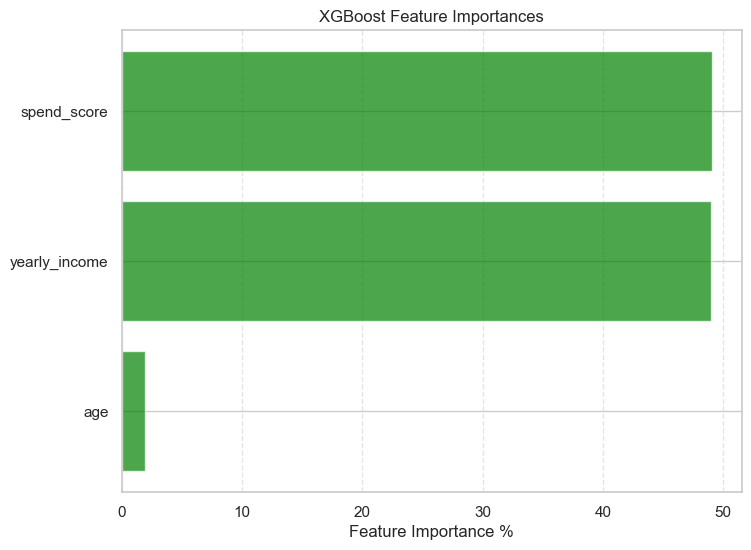

In [102]:
# Plot horizontal bar chart
plt.figure(figsize=(8,6))
plt.barh(feat_df["Feature"], feat_df["Percent"], color="green", alpha=0.7)
plt.xlabel("Feature Importance %")
plt.title("XGBoost Feature Importances")
plt.grid(axis="x", linestyle="--", alpha=0.5)
plt.show()

# 

# Week 3 assignment: Clustering with *k*-means using Python

The marketing department also wants to better understand the usefulness of renumeration and spending scores but do not know where to begin. You are tasked to identify groups within the customer base that can be used to target specific market segments. Use *k*-means clustering to identify the optimal number of clusters and then apply and plot the data using the created segments.

In [103]:
# Refresher of data.
reviews_cleaned.head()

,gender,age,yearly_income,spend_score,loyalty_points,education,product,review,summary
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap


In [104]:
# Use only useful columns.
kcluster = reviews_cleaned[["gender", "age", "yearly_income", "spend_score", "loyalty_points", "education"]]
kcluster.head()

,gender,age,yearly_income,spend_score,loyalty_points,education
0,Male,18,12.30,39,210,graduate
1,Male,23,12.30,81,524,graduate
2,Female,22,13.12,6,40,graduate
3,Female,25,13.12,77,562,graduate
4,Female,33,13.94,40,366,graduate


In [105]:
# Drop unnecessary columns for clustering based on yearly income and spend score only.
cluster2 = kcluster[["yearly_income", "spend_score"]]

# View DataFrame.
cluster2

,yearly_income,spend_score
0,12.30,39
1,12.30,81
2,13.12,6
3,13.12,77
4,13.94,40
...,...,...
1995,84.46,69
1996,92.66,8
1997,92.66,91
1998,98.40,16


## 2. Plot

Text(0.5, 1.0, 'Plot of Yearly Income and Spending Score of Turtle Games Customers')

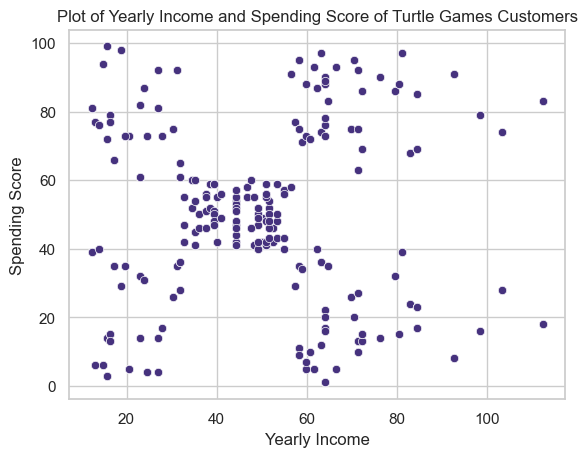

In [106]:
# Create a scatterplot with Seaborn.
sns.scatterplot(x="yearly_income",
                y="spend_score",
                data=cluster2)
plt.xlabel("Yearly Income")
plt.ylabel("Spending Score")
plt.title("Plot of Yearly Income and Spending Score of Turtle Games Customers")

## 3. Elbow and silhoutte methods

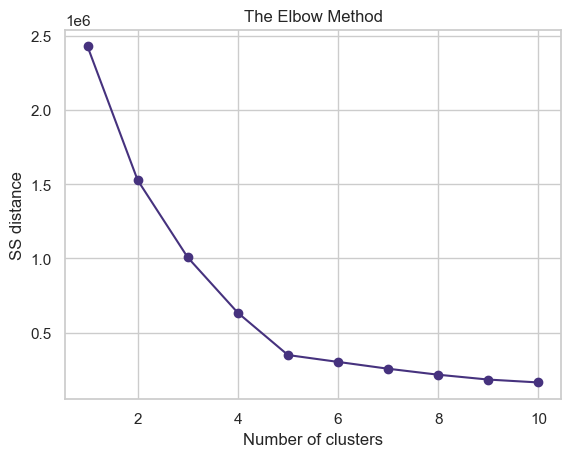

In [107]:
# Determine the number of clusters: Elbow method.

# Elbow chart for us to decide on the number of optimal clusters.
ss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i,
                    init="k-means++",
                    max_iter=500,
                    n_init=10,
                    random_state=42)
    kmeans.fit(cluster2)
    ss.append(kmeans.inertia_)

# Plot the elbow method.
plt.plot(range(1, 11),
         ss,
         marker="o")

# Insert labels and title.
plt.title("The Elbow Method")
plt.xlabel("Number of clusters")
plt.ylabel("SS distance")

plt.show()

The Elbow plot suggests to use 5 clusters.

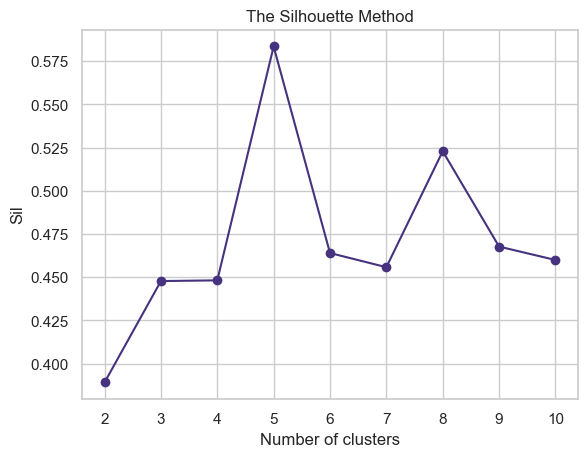

In [108]:
# Determine the number of clusters: Silhouette method.

# Find the range of clusters to be used using silhouette method.
sil = []
kmax = 10

for k in range(2, kmax+1):
    kmeans_s = KMeans(n_clusters=k).fit(cluster2)
    labels = kmeans_s.labels_
    sil.append(silhouette_score(cluster2,
                                labels,
                                metric="euclidean"))

# Plot the silhouette method.
plt.plot(range(2, kmax+1),
         sil,
         marker="o")

# Insert labels and title.
plt.title("The Silhouette Method")
plt.xlabel("Number of clusters")
plt.ylabel("Sil")

plt.show()

The silhouette also suggests 5 clusters.

## 4. Evaluate k-means model at different values of *k*

4-7 clusters will be modelled.

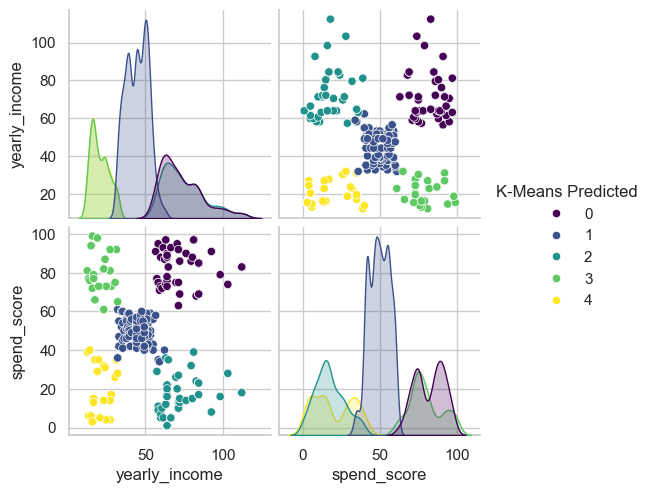

In [109]:
# Use 5 clusters.
kmeans = KMeans(n_clusters = 5, 
                max_iter = 15000,
                init="k-means++",
                random_state=42).fit(cluster2)

clusters = kmeans.labels_

cluster2["K-Means Predicted"] = clusters

# Plot the predicted.
sns.pairplot(cluster2,
             hue="K-Means Predicted", palette="viridis",
             diag_kind= "kde")
plt.show()

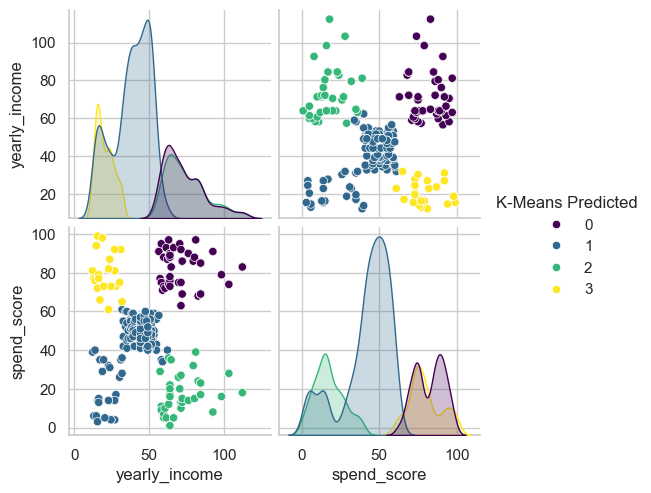

In [110]:
# Use 4 clusters.
kmeans = KMeans(n_clusters = 4, 
                max_iter = 15000,
                init="k-means++",
                random_state=42).fit(cluster2)

clusters = kmeans.labels_

cluster2["K-Means Predicted"] = clusters

# Plot the predicted.
sns.pairplot(cluster2,
             hue="K-Means Predicted", palette="viridis",
             diag_kind= "kde")
plt.show()

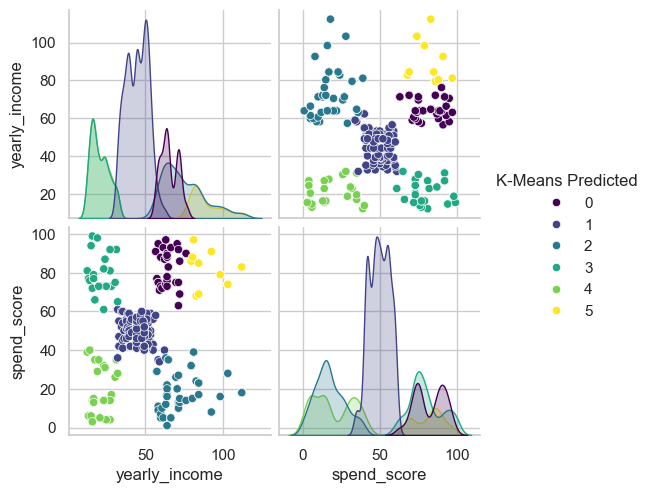

In [111]:
# Use 6 clusters.
kmeans = KMeans(n_clusters = 6, 
                max_iter = 15000,
                init="k-means++",
                random_state=42).fit(cluster2)

clusters = kmeans.labels_

cluster2["K-Means Predicted"] = clusters

# Plot the predicted.
sns.pairplot(cluster2,
             hue="K-Means Predicted", palette="viridis",
             diag_kind= "kde")
plt.show()

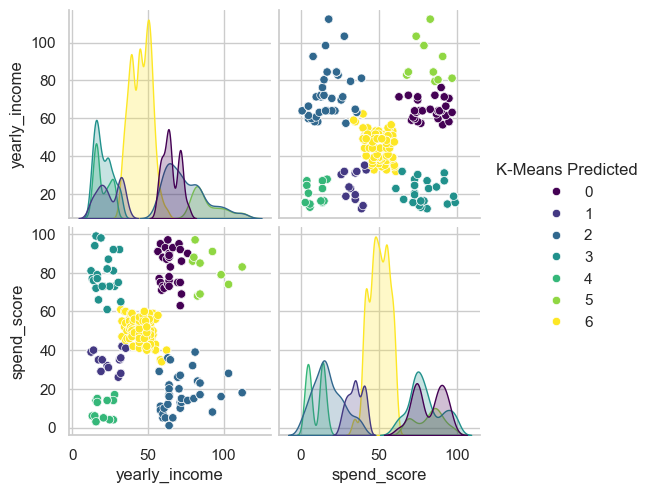

In [112]:
# Use 7 clusters.
kmeans = KMeans(n_clusters = 7, 
                max_iter = 15000,
                init="k-means++",
                random_state=42).fit(cluster2)

clusters = kmeans.labels_

cluster2["K-Means Predicted"] = clusters

# Plot the predicted.
sns.pairplot(cluster2,
             hue="K-Means Predicted", palette="viridis",
             diag_kind= "kde")
plt.show()

## 5. Fit final model and justify your choice

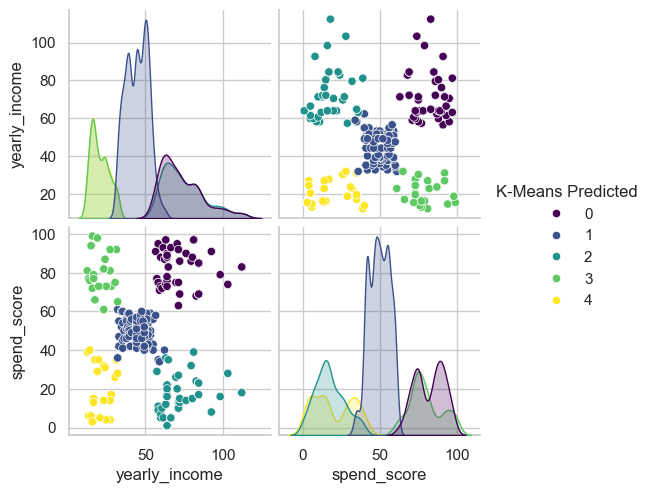

In [113]:
# Apply the final model.
# Use 5 clusters.
kmeans = KMeans(n_clusters = 5, 
                max_iter = 15000,
                init="k-means++",
                random_state=42).fit(cluster2)

clusters = kmeans.labels_

cluster2["K-Means Predicted"] = clusters

# Plot the predicted.
sns.pairplot(cluster2,
             hue="K-Means Predicted", palette="viridis",
             diag_kind= "kde")
plt.show()

In [114]:
# Check the number of observations per predicted class.
cluster2["K-Means Predicted"].value_counts()

K-Means Predicted
1    774
0    356
2    330
4    271
3    269
Name: count, dtype: int64

## 6. Plot and interpret the clusters

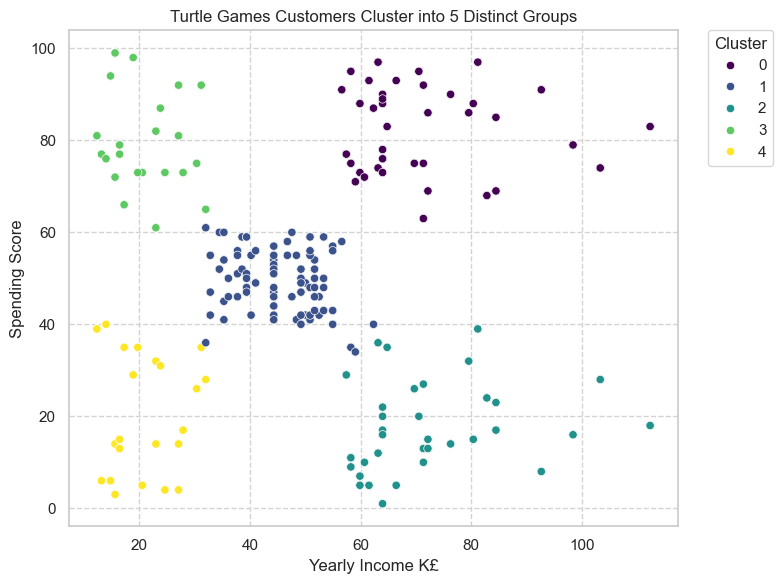

In [115]:
# Visualising the clusters.
# Set plot size.
sns.set(rc = {"figure.figsize":(8, 6)})
sns.set_style("whitegrid", {
    "grid.color": "lightgrey",   
    "grid.linestyle": "--",     
    "grid.linewidth": 0.7
})
# Create a scatterplot.
sns.scatterplot(x="yearly_income" , 
                y ="spend_score",
                data=cluster2,
                hue="K-Means Predicted",
                palette="viridis"
                )
plt.xlabel("Yearly Income K£")
plt.ylabel("Spending Score")
plt.title("Turtle Games Customers Cluster into 5 Distinct Groups")

# Move legend outside
plt.legend(
    title="Cluster",
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    borderaxespad=0
)

plt.tight_layout()
plt.show()

#### 5 Clusters was suggested by both the Elbow and Silhouette Plots.
#### Visually, 5 clusters is best.
#### These 5 group demographics should be investigated further.
#### The biggest group is cluster 1 which also has the tightest cluster distribution.

In [116]:
# Add loyalty points to the df.
cluster2["loyalty_points"] = kcluster["loyalty_points"]
cluster2

,yearly_income,spend_score,K-Means Predicted,loyalty_points
0,12.30,39,4,210
1,12.30,81,3,524
2,13.12,6,4,40
3,13.12,77,3,562
4,13.94,40,4,366
...,...,...,...,...
1995,84.46,69,0,4031
1996,92.66,8,2,539
1997,92.66,91,0,5614
1998,98.40,16,2,1048


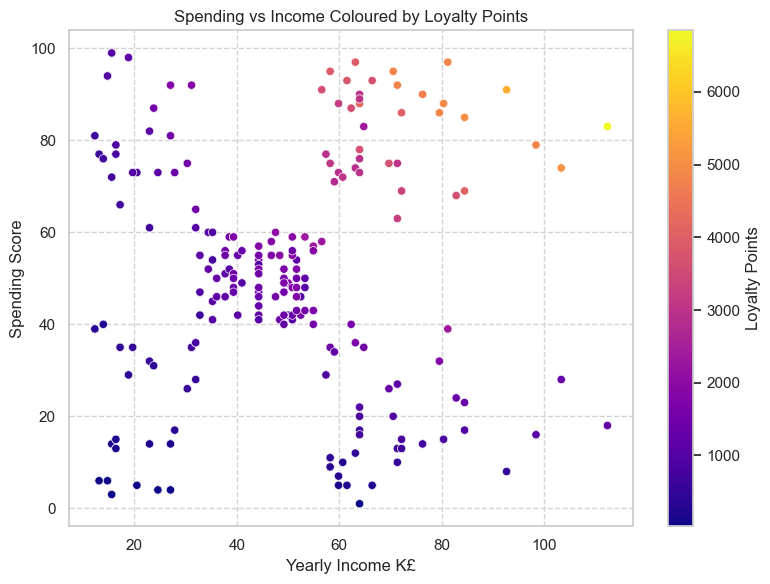

In [117]:
# Visualising the clusters based on loyalty points.
# Set plot size.

fig, ax = plt.subplots(figsize=(8, 6))

scatter = sns.scatterplot(
    x="yearly_income",
    y="spend_score",
    data=cluster2,
    hue="loyalty_points",
    palette="plasma",
    legend=False,
    ax=ax
)

# Create colorbar attached to the same Axes
norm = mpl.colors.Normalize(
    vmin=cluster2["loyalty_points"].min(),
    vmax=cluster2["loyalty_points"].max()
)

sm = mpl.cm.ScalarMappable(norm=norm, cmap="plasma")
sm.set_array([])

cbar = fig.colorbar(sm, ax=ax)
cbar.set_label("Loyalty Points")

ax.set_xlabel("Yearly Income K£")
ax.set_ylabel("Spending Score")
ax.set_title("Spending vs Income Coloured by Loyalty Points")

plt.tight_layout()
plt.show()


In [118]:
# Check the means of loyalty points of each cluster.
cluster2.groupby("K-Means Predicted")["loyalty_points"].mean()

K-Means Predicted
0    3988.238764
1    1420.382429
2     911.760606
3     971.944238
4     275.059041
Name: loyalty_points, dtype: float64

#### Interesting! Cluster 0 has the high loyalty point customers.

In [119]:
# Add the cluster number to the bigger dataframe that includes demographics.
kcluster["cluster"] = cluster2["K-Means Predicted"]

In [120]:
# Check the df.
kcluster

,gender,age,yearly_income,spend_score,loyalty_points,education,cluster
0,Male,18,12.30,39,210,graduate,4
1,Male,23,12.30,81,524,graduate,3
2,Female,22,13.12,6,40,graduate,4
3,Female,25,13.12,77,562,graduate,3
4,Female,33,13.94,40,366,graduate,4
...,...,...,...,...,...,...,...
1995,Female,37,84.46,69,4031,PhD,0
1996,Female,43,92.66,8,539,PhD,2
1997,Male,34,92.66,91,5614,graduate,0
1998,Male,34,98.40,16,1048,PhD,2


In [121]:
# View Summary statistics in a table.
num_cols = kcluster.select_dtypes(include="number").columns
cluster_summary = (
    kcluster
    .groupby("cluster")[num_cols]
    .agg(["mean", "std", "min", "max", "count"])
)

cluster_summary

age                          yearly_income                    \
              mean        std min max count          mean        std    min   
cluster                                                                       
0        35.592697   7.299612  18  72   356     73.240281  13.557856  56.58   
1        42.129199  15.721916  17  72   774     44.418786   7.088279  31.98   
2        40.666667  11.357594  17  72   330     74.831212  13.638540  57.40   
3        31.602230  10.731534  17  71   269     20.353680   5.737253  12.30   
4        43.505535  13.961553  17  72   271     20.424354   5.719723  12.30   

                       ... loyalty_points                                \
            max count  ...           mean         std   min   max count   
cluster                ...                                                
0        112.34   356  ...    3988.238764  898.409322  2289  6847   356   
1         62.32   774  ...    1420.382429  322.530608   504  2332   774   
2        112.34   330  ...     911.760606  545.849379    40  2325   330   
3         31.98   269  ...     971.944238  296.173785   436  1851   269   
4         31.98   271  ...     275.059041  198.236064    25   726   271   

        cluster                     
           mean  std min max count  
cluster                             
0           0.0  0.0   0   0   356  
1           1.0  0.0   1   1   774  
2           2.0  0.0   2   2   330  
3           3.0  0.0   3   3   269  
4           4.0  0.0   4   4   271  

[5 rows x 25 columns]

## Visualise the clusters by demographics.

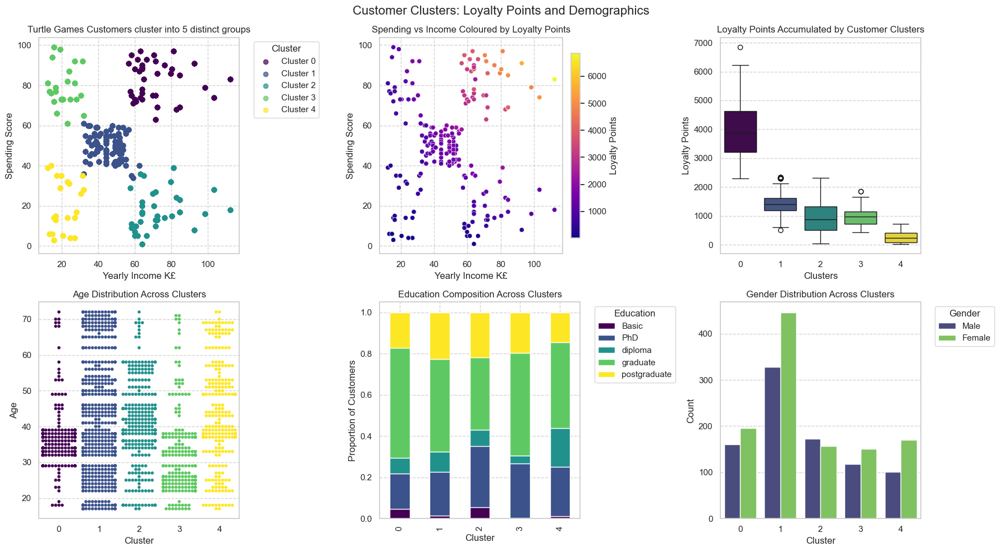

In [122]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))  

n_clusters = cluster2["K-Means Predicted"].nunique()
cluster_colors = plt.cm.viridis(np.linspace(0, 1, n_clusters))  

# [0,0] Scatter: K-Means clusters
for i in range(n_clusters):
    mask = cluster2["K-Means Predicted"] == i
    axes[0, 0].scatter(
        cluster2.loc[mask, "yearly_income"],
        cluster2.loc[mask, "spend_score"],
        color=cluster_colors[i],
        label=f"Cluster {i}",
        alpha=0.7
    )
axes[0,0].set_xlabel("Yearly Income K£")
axes[0,0].set_ylabel("Spending Score")
axes[0,0].set_title("Turtle Games Customers cluster into 5 distinct groups")
axes[0, 0].legend(title="Cluster", bbox_to_anchor=(1.05,1), loc="upper left")

# [0,1] Scatter: loyalty points (continuous)
scatter = sns.scatterplot(
    x="yearly_income",
    y="spend_score",
    data=cluster2,
    hue="loyalty_points",
    palette="plasma",
    legend=False,
    ax=axes[0, 1]
)
norm = mpl.colors.Normalize(
    vmin=cluster2["loyalty_points"].min(),
    vmax=cluster2["loyalty_points"].max()
)
sm = mpl.cm.ScalarMappable(norm=norm, cmap="plasma")
sm.set_array([])
cbar = fig.colorbar(sm, ax=axes[0, 1], fraction=0.046, pad=0.04)
cbar.set_label("Loyalty Points")

axes[0, 1].set_xlabel("Yearly Income K£")
axes[0, 1].set_ylabel("Spending Score")
axes[0, 1].set_title("Spending vs Income Coloured by Loyalty Points")

# [0,2] Boxplot: loyalty points by cluster
sns.boxplot(
    data=kcluster,
    x="cluster",
    y="loyalty_points",
    palette=cluster_colors,
    ax=axes[0,2]
)
axes[0,2].set_xlabel("Clusters")
axes[0,2].set_ylabel("Loyalty Points")
axes[0,2].set_title("Loyalty Points Accumulated by Customer Clusters")

# [1,0] Swarmplot: age by cluster
sns.swarmplot(
    data=kcluster,
    x="cluster",
    y="age",
    palette=cluster_colors,
    size=4,
    ax=axes[1, 0]
)
axes[1,0].set_xlabel("Cluster")
axes[1,0].set_ylabel("Age")
axes[1,0].set_title("Age Distribution Across Clusters")

# [1,1] Stacked bar: education composition
edu_counts = kcluster.groupby(["cluster", "education"]).size().unstack(fill_value=0)
edu_prop = edu_counts.div(edu_counts.sum(axis=1), axis=0)

edu_categories = edu_counts.columns
edu_colors = plt.cm.viridis(np.linspace(0, 1, len(edu_categories)))

edu_prop.plot(
    kind="bar",
    stacked=True,
    color=edu_colors,
    ax=axes[1,1]
)
axes[1,1].set_xlabel("Cluster")
axes[1,1].set_ylabel("Proportion of Customers")
axes[1,1].set_title("Education Composition Across Clusters")
axes[1,1].legend(title="Education", bbox_to_anchor=(1.05,1), loc="upper left")

# [1,2] Countplot: gender distribution
gender_categories = kcluster["gender"].unique()
gender_colors = plt.cm.viridis(np.linspace(0.2, 0.8, len(gender_categories)))

sns.countplot(
    data=kcluster,
    x="cluster",
    hue="gender",
    palette=gender_colors,
    ax=axes[1, 2]
)
axes[1, 2].set_xlabel("Cluster")
axes[1, 2].set_ylabel("Count")
axes[1, 2].set_title("Gender Distribution Across Clusters")
axes[1, 2].legend(title="Gender", bbox_to_anchor=(1.05,1), loc="upper left")

fig.suptitle("Customer Clusters: Loyalty Points and Demographics", fontsize=16)
plt.tight_layout()
plt.show()


It is interesting that customers in cluster 0 have accumulated the highest number of loyalty points. These customers have a high yearly income and a high spending score. Cluster 1 consists of customers that have a medium yearly income and spending scores. These customers have lower loyalty points than customers in cluster 0 but more than clusters 2-4, on average. Clusters 2 and 3 have low spending score and low yearly income, respectively. These 2 clusters have accumulated a similar number of loyalty points. Cluster 4, customers who have low income and low spending scores, have accumulated the least loyalty points. There are no clear correlation between age, education and gender in relation to the 5 clusters.

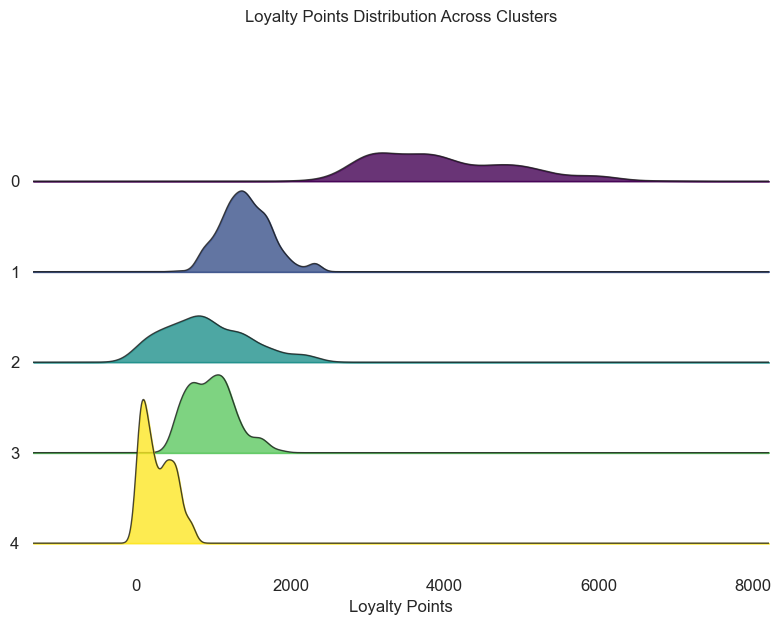

In [123]:
# Create a JoyPlot.
n_clusters = kcluster["cluster"].nunique()
colors = plt.cm.viridis(np.linspace(0, 1, n_clusters)).tolist()

joypy.joyplot(
    kcluster,
    by="cluster",
    column="loyalty_points",
    color=colors,
    linewidth=1,
    alpha=0.8,
    figsize=(8,6)
)

plt.title("Loyalty Points Distribution Across Clusters")
plt.ylabel("Customer Cluster")
plt.xlabel("Loyalty Points")
plt.show()

### Add the demographics to the clustering as an alternative model.

In [124]:
# Encode gender and education using one-hot encoding.
X = kcluster.drop(columns=["loyalty_points", "cluster"])  # exclude target (loyalty points)
X = pd.get_dummies(X, columns=["gender", "education"], drop_first=True)

In [125]:
X

,age,yearly_income,spend_score,gender_Male,education_PhD,education_diploma,education_graduate,education_postgraduate
0,18,12.30,39,True,False,False,True,False
1,23,12.30,81,True,False,False,True,False
2,22,13.12,6,False,False,False,True,False
3,25,13.12,77,False,False,False,True,False
4,33,13.94,40,False,False,False,True,False
...,...,...,...,...,...,...,...,...
1995,37,84.46,69,False,True,False,False,False
1996,43,92.66,8,False,True,False,False,False
1997,34,92.66,91,True,False,False,True,False
1998,34,98.40,16,True,True,False,False,False


In [126]:
X.dtypes

age                         int64
yearly_income             float64
spend_score                 int64
gender_Male                  bool
education_PhD                bool
education_diploma            bool
education_graduate           bool
education_postgraduate       bool
dtype: object

In [127]:
# K-Means is distance-based, so scaling is important.
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [128]:
X_scaled = pd.DataFrame(X_scaled, columns=X.columns, index=X.index)
X_scaled

,age,yearly_income,spend_score,gender_Male,education_PhD,education_diploma,education_graduate,education_postgraduate
0,-1.584030,-1.547658,-0.421647,1.128152,-0.546536,-0.323994,1.105542,-0.5
1,-1.215565,-1.547658,1.188278,1.128152,-0.546536,-0.323994,1.105542,-0.5
2,-1.289258,-1.512188,-1.686588,-0.886405,-0.546536,-0.323994,1.105542,-0.5
3,-1.068179,-1.512188,1.034952,-0.886405,-0.546536,-0.323994,1.105542,-0.5
4,-0.478636,-1.476718,-0.383315,-0.886405,-0.546536,-0.323994,1.105542,-0.5
...,...,...,...,...,...,...,...,...
1995,-0.183864,1.573692,0.728299,-0.886405,1.829707,-0.323994,-0.904534,-0.5
1996,0.258294,1.928391,-1.609925,-0.886405,1.829707,-0.323994,-0.904534,-0.5
1997,-0.404943,1.928391,1.571593,1.128152,-0.546536,-0.323994,1.105542,-0.5
1998,-0.404943,2.176680,-1.303272,1.128152,1.829707,-0.323994,-0.904534,-0.5


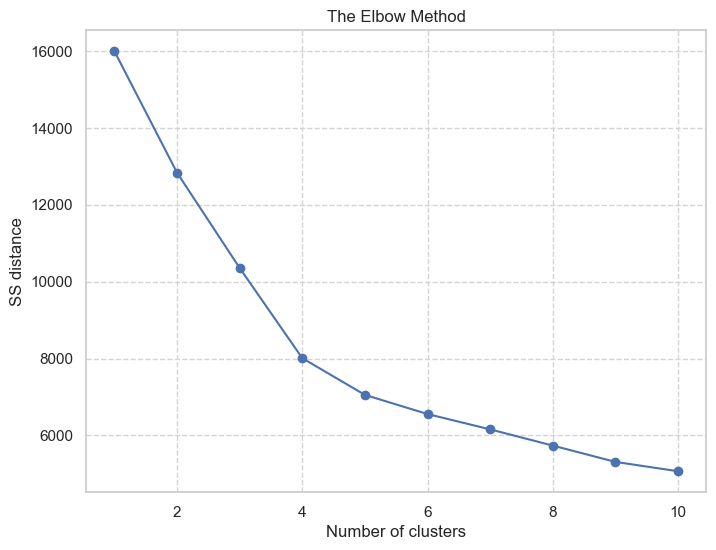

In [129]:
# Determine the number of clusters: Elbow method.

# Elbow chart for us to decide on the number of optimal clusters.
ss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i,
                    init="k-means++",
                    max_iter=500,
                    n_init=10,
                    random_state=42)
    kmeans.fit(X_scaled)
    ss.append(kmeans.inertia_)

# Plot the elbow method.
plt.plot(range(1, 11),
         ss,
         marker="o")

# Insert labels and title.
plt.title("The Elbow Method")
plt.xlabel("Number of clusters")
plt.ylabel("SS distance")

plt.show()

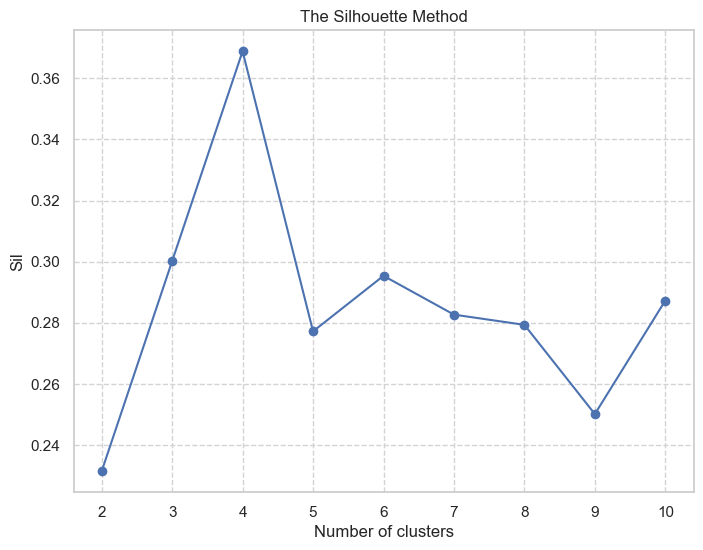

In [130]:
# Determine the number of clusters: Silhouette method.

# Find the range of clusters to be used using silhouette method.
sil = []
kmax = 10

for k in range(2, kmax+1):
    kmeans_s = KMeans(n_clusters=k).fit(X_scaled)
    labels = kmeans_s.labels_
    sil.append(silhouette_score(X_scaled,
                                labels,
                                metric="euclidean"))

# Plot the silhouette method.
plt.plot(range(2, kmax+1),
         sil,
         marker="o")

# Insert labels and title.
plt.title("The Silhouette Method")
plt.xlabel("Number of clusters")
plt.ylabel("Sil")

plt.show()

In [131]:
# Apply K means clustering.
kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(X_scaled)
kcluster_model2 = kcluster.copy()
kcluster_model2["cluster"] = clusters

In [132]:
# Check means of loyalty points.
kcluster_model2.groupby("cluster")["loyalty_points"].mean()

cluster
0    1499.077500
1    1499.750000
2    1688.310417
3    1600.240909
Name: loyalty_points, dtype: float64

In [133]:
# No obvious effect.

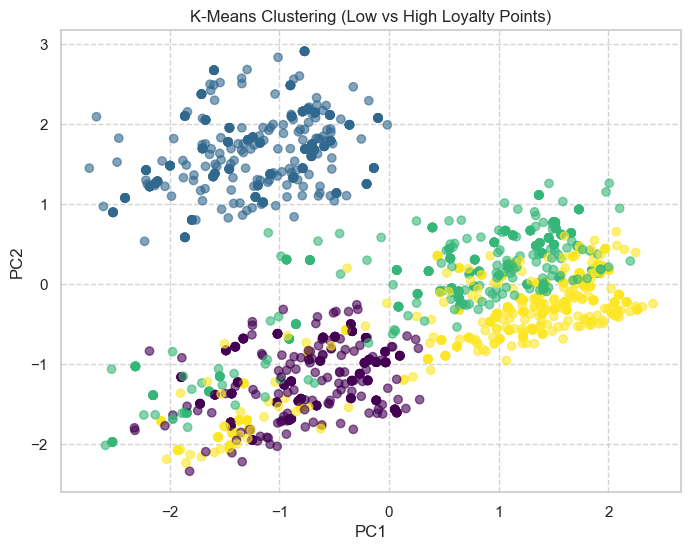

In [134]:
# Perform Principle Component analysis to plot data. There are 4 clusters, PCA will reduce the dimensions of the data to be able to plot 2D.
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(8,6))
plt.scatter(X_pca[:,0], X_pca[:,1], c=clusters, cmap="viridis", alpha=0.6) 
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.title("K-Means Clustering (Low vs High Loyalty Points)")
plt.show()

#### Clusters don't show an obvious pattern or segregation.

In [135]:
kcluster

,gender,age,yearly_income,spend_score,loyalty_points,education,cluster
0,Male,18,12.30,39,210,graduate,4
1,Male,23,12.30,81,524,graduate,3
2,Female,22,13.12,6,40,graduate,4
3,Female,25,13.12,77,562,graduate,3
4,Female,33,13.94,40,366,graduate,4
...,...,...,...,...,...,...,...
1995,Female,37,84.46,69,4031,PhD,0
1996,Female,43,92.66,8,539,PhD,2
1997,Male,34,92.66,91,5614,graduate,0
1998,Male,34,98.40,16,1048,PhD,2


Text(0.5, 1.0, 'Loyalty Points accumulated in each Cluster')

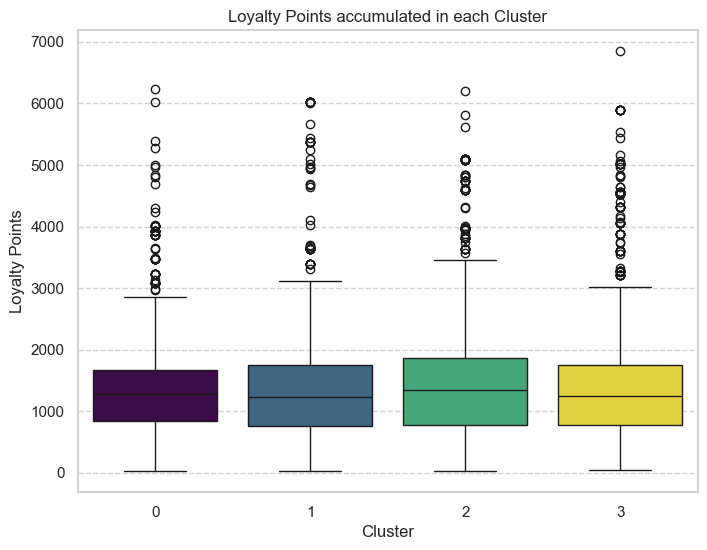

In [136]:
# Plot loyalty points by cluster.
sns.boxplot(data=kcluster_model2, x="cluster", y="loyalty_points", hue="cluster", palette="viridis", legend=False)
plt.xlabel("Cluster")
plt.ylabel("Loyalty Points")
plt.title("Loyalty Points accumulated in each Cluster")

Unsupervised K-Means clustering using demographic and spending variables did not produce clusters with clearly differentiated loyalty point distributions. All clusters exhibited similar loyalty point means and ranges. The first model was better at highlighting groups with different characteristics.

In [137]:
# Convert PCA to DataFrame.
pca_df = pd.DataFrame(
    X_pca,
    columns=["PC1", "PC2"],
    index=X_scaled.index
)

# Add loyalty points back for analysis
pca_df["loyalty_points"] = kcluster_model2["loyalty_points"]

In [138]:
# Check the correlations of principle components.
pca_df[["PC1", "PC2", "loyalty_points"]].corr().round(2)

,PC1,PC2,loyalty_points
PC1,1.00,0.00,0.22
PC2,0.00,1.00,0.22
loyalty_points,0.22,0.22,1.00


loyalty is not aligned with the dominant variance in the data

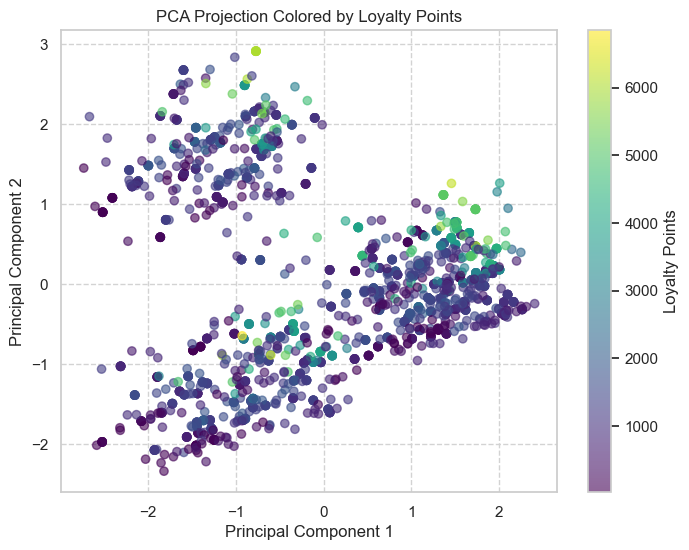

In [139]:
# Plot the PCs by loyalty Points.
plt.figure(figsize=(8,6))
sc = plt.scatter(
    pca_df["PC1"],
    pca_df["PC2"],
    c=pca_df["loyalty_points"],
    cmap="viridis",
    alpha=0.6
)

plt.colorbar(sc, label="Loyalty Points")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("PCA Projection Colored by Loyalty Points")
plt.show()


In [140]:
# Check loadings (what PCs correspond to).
loadings = pd.DataFrame(
    pca.components_.T,
    columns=["PC1", "PC2"],
    index=X_scaled.columns
)

loadings

,PC1,PC2
age,-0.382672,-0.207506
yearly_income,-0.038046,0.295848
spend_score,0.308784,0.082742
gender_Male,-0.129687,0.247336
education_PhD,-0.386694,0.680183
education_diploma,-0.284589,-0.364260
education_graduate,0.679387,-0.002313
education_postgraduate,-0.218768,-0.453933


Principal Component Analysis was applied to the scaled feature set to examine whether the main sources of variance were associated with loyalty points. The first two principal components did not exhibit a strong correlation with loyalty points, and visual inspection of the PCA projection showed no clear loyalty-driven separation. This suggests that loyalty points are not strongly aligned with the dominant demographic and spending patterns captured by the data.

In [141]:
# Try qcut (Quantile cut)
# Split into 4 quantiles
kcluster_qcut=kcluster.copy()
kcluster_qcut["loyalty_group"] = pd.qcut(kcluster_qcut["loyalty_points"], q=4, labels=["Low", "LowMid", "HighMid", "High"])

In [142]:
# Check means of 4 groups.
kcluster_qcut.groupby("loyalty_group").mean(numeric_only=True)

,age,yearly_income,spend_score,loyalty_points,cluster
loyalty_group,,,,,
Low,39.359127,33.406865,26.668651,383.833333,3.240079
LowMid,35.566532,42.724315,50.653226,1048.758065,1.752016
HighMid,44.358000,47.555080,49.868000,1479.400000,1.296000
High,38.666000,68.704520,73.002000,3405.456000,0.350000


As seen with the decision tree and first kmeans cluster model, yearly income and spend score are highly related to loyalty points.


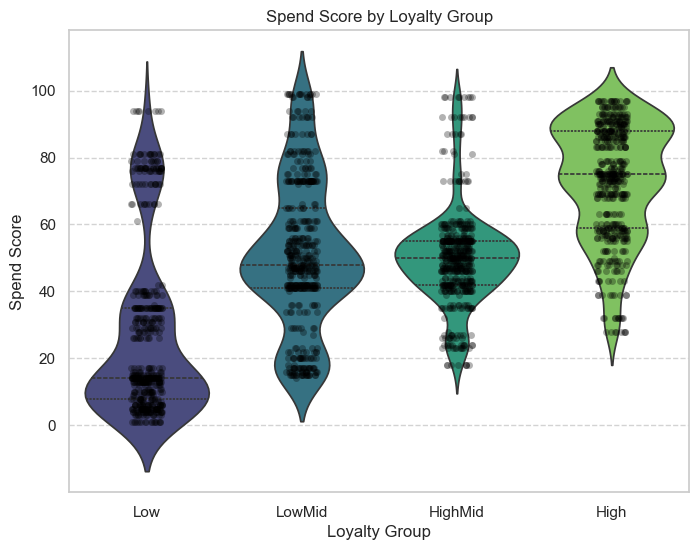

In [143]:
# View Spend Score by Loyalty Points.
sns.violinplot(kcluster_qcut, x="loyalty_group", y="spend_score", inner="quartile", hue="loyalty_group", palette="viridis")
sns.stripplot(
    data=kcluster_qcut,
    x="loyalty_group",
    y="spend_score",
    color="black",
    alpha=0.3,
    jitter=True
)
plt.title("Spend Score by Loyalty Group")
plt.suptitle("")
plt.xlabel("Loyalty Group")
plt.ylabel("Spend Score")
plt.show()

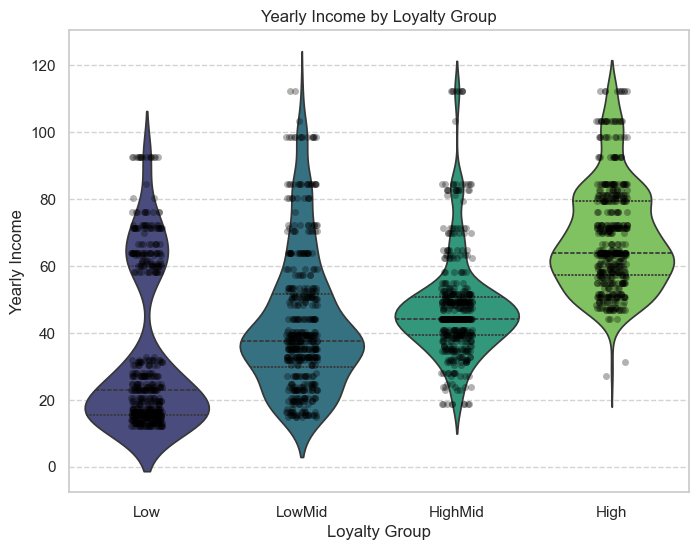

In [144]:
# View Yearly Income by Loyalty Points.
sns.violinplot(kcluster_qcut, x="loyalty_group", y="yearly_income", inner="quartile", hue="loyalty_group", palette="viridis")
sns.stripplot(
    data=kcluster_qcut,
    x="loyalty_group",
    y="yearly_income",
    color="black",
    alpha=0.3,
    jitter=True
)
plt.title("Yearly Income by Loyalty Group")
plt.suptitle("")
plt.xlabel("Loyalty Group")
plt.ylabel("Yearly Income")
plt.show()

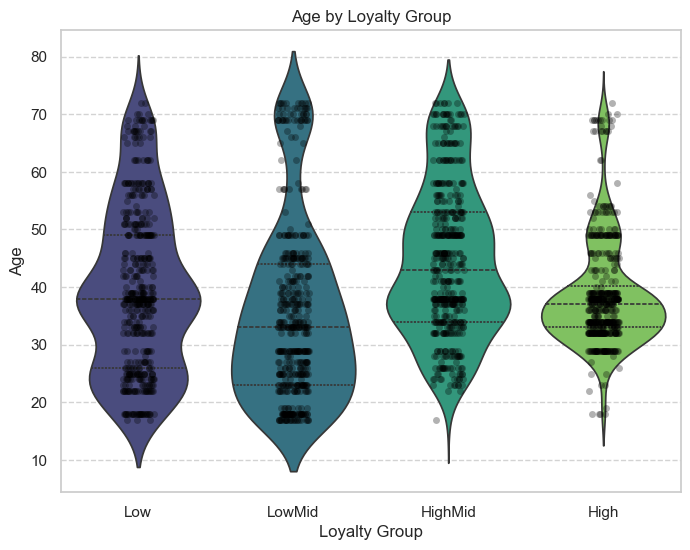

In [145]:
# View Age by Loyalty Points.
sns.violinplot(kcluster_qcut, x="loyalty_group", y="age", inner="quartile", hue="loyalty_group", palette="viridis")
sns.stripplot(
    data=kcluster_qcut,
    x="loyalty_group",
    y="age",
    color="black",
    alpha=0.3,
    jitter=True
)
plt.title("Age by Loyalty Group")
plt.suptitle("")
plt.xlabel("Loyalty Group")
plt.ylabel("Age")
plt.show()

Customers were divided into low-, LowMid-, HighMid-, and high-loyalty groups using a median split of loyalty points via quantile-based binning. This ensured equally sized groups and enabled direct comparison of demographic and spending characteristics between loyalty customer groups. Spending score and yearly income are correlated to loyalty points, but age is not.

#### The first K means clustering model was the most insightful.
#### It showed a relationship between customer clusters and loyalty points.
#### Adding demographics (Age, gender, education) did not improve the clustering.
#### Using qcut showed a descriptive view of the data, but this was already captured by the first clustering model.

# 

# Week 4 assignment: NLP using Python
Customer reviews were downloaded from the website of Turtle Games. This data will be used to steer the marketing department on how to approach future campaigns. Therefore, the marketing department asked you to identify the 15 most common words used in online product reviews. They also want to have a list of the top 20 positive and negative reviews received from the website. Therefore, you need to apply NLP on the data set.

## 1. Load and explore the data

In [146]:
# Refresher of the data
reviews_cleaned.head()

,gender,age,yearly_income,spend_score,loyalty_points,education,product,review,summary
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap


In [147]:
# Remove unnecssary columns.
wordsdf = reviews_cleaned[["review", "summary"]]

# View DataFrame.
wordsdf.head()

,review,summary
0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,As my review of GF9's previous screens these w...,Money trap


In [148]:
# Determine if there are any missing values.
wordsdf["review"].isna().sum()

np.int64(0)

In [149]:
# Determine if there are any missing values.
wordsdf["summary"].isna().sum()

np.int64(0)

## 2. Prepare the data for NLP
### 2a) Change to lower case and join the elements in each of the columns respectively (review and summary)

In [150]:
# Review: Change all to lower case and join with a space.
wordsdf["review_lower"] = wordsdf["review"].apply(lambda x: " ".join(x.lower() for x in x.split()))
wordsdf.head()

,review,summary,review_lower
0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...,"when it comes to a dm's screen, the space on t..."
1,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...,an open letter to galeforce9*: your unpainted ...
2,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless","nice art, nice printing. why two panels are fi..."
3,Amazing buy! Bought it as a gift for our new d...,Five Stars,amazing buy! bought it as a gift for our new d...
4,As my review of GF9's previous screens these w...,Money trap,as my review of gf9's previous screens these w...


In [151]:
# Summary: Change all to lower case and join with a space.
wordsdf["summary_lower"] = wordsdf["summary"].apply(lambda x: " ".join(x.lower() for x in x.split()))
wordsdf.head()

,review,summary,review_lower,summary_lower
0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...,"when it comes to a dm's screen, the space on t...",the fact that 50% of this space is wasted on a...
1,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...,an open letter to galeforce9*: your unpainted ...,another worthless dungeon master's screen from...
2,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless","nice art, nice printing. why two panels are fi...","pretty, but also pretty useless"
3,Amazing buy! Bought it as a gift for our new d...,Five Stars,amazing buy! bought it as a gift for our new d...,five stars
4,As my review of GF9's previous screens these w...,Money trap,as my review of gf9's previous screens these w...,money trap


### 2b) Replace punctuation in each of the columns respectively (review and summary)

In [152]:
# Replace all the puncuations in review column.
wordsdf["review_lower"] = wordsdf["review_lower"].str.replace("[^\w\s]", "", regex=True)

# View output.
wordsdf.head()

,review,summary,review_lower,summary_lower
0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...,when it comes to a dms screen the space on the...,the fact that 50% of this space is wasted on a...
1,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...,an open letter to galeforce9 your unpainted mi...,another worthless dungeon master's screen from...
2,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless",nice art nice printing why two panels are fill...,"pretty, but also pretty useless"
3,Amazing buy! Bought it as a gift for our new d...,Five Stars,amazing buy bought it as a gift for our new dm...,five stars
4,As my review of GF9's previous screens these w...,Money trap,as my review of gf9s previous screens these we...,money trap


In [153]:
# Replace all the punctuations in summary column.
wordsdf["summary_lower"] = wordsdf["summary_lower"].str.replace("[^\w\s]", "", regex=True)

# View output.
wordsdf.head()

,review,summary,review_lower,summary_lower
0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...
1,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...
2,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless",nice art nice printing why two panels are fill...,pretty but also pretty useless
3,Amazing buy! Bought it as a gift for our new d...,Five Stars,amazing buy bought it as a gift for our new dm...,five stars
4,As my review of GF9's previous screens these w...,Money trap,as my review of gf9s previous screens these we...,money trap


### 2c) Drop duplicates in both columns

In [154]:
wordsdf.shape

(2000, 4)

In [155]:
# Drop duplicates in both columns.
wordsdf.duplicated().sum()

np.int64(18)

In [156]:
wordsdf = wordsdf.drop_duplicates().reset_index(drop=True)

# View DataFrame.
wordsdf.shape

(1982, 4)

## 3. Tokenise and create wordclouds

In [157]:
# Create new DataFrame (copy DataFrame).
words_clean = wordsdf[["review_lower", "summary_lower"]].copy()

# View DataFrame.
words_clean.head()

,review_lower,summary_lower
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...
1,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...
2,nice art nice printing why two panels are fill...,pretty but also pretty useless
3,amazing buy bought it as a gift for our new dm...,five stars
4,as my review of gf9s previous screens these we...,money trap


In [158]:
# String all the comments together in a single variable.
# Create an empty string variable.
all_reviews = ""
for i in range(words_clean.shape[0]): # for every row in (number of rows)
    # Add each comment.
    all_reviews = all_reviews + words_clean["review_lower"][i]

In [159]:
# Create a WordCloud object.
word_cloud = WordCloud(width=1600, height=900, 
                background_color="white",
                colormap="plasma", 
                stopwords="none",
                min_font_size=10).generate(all_reviews)

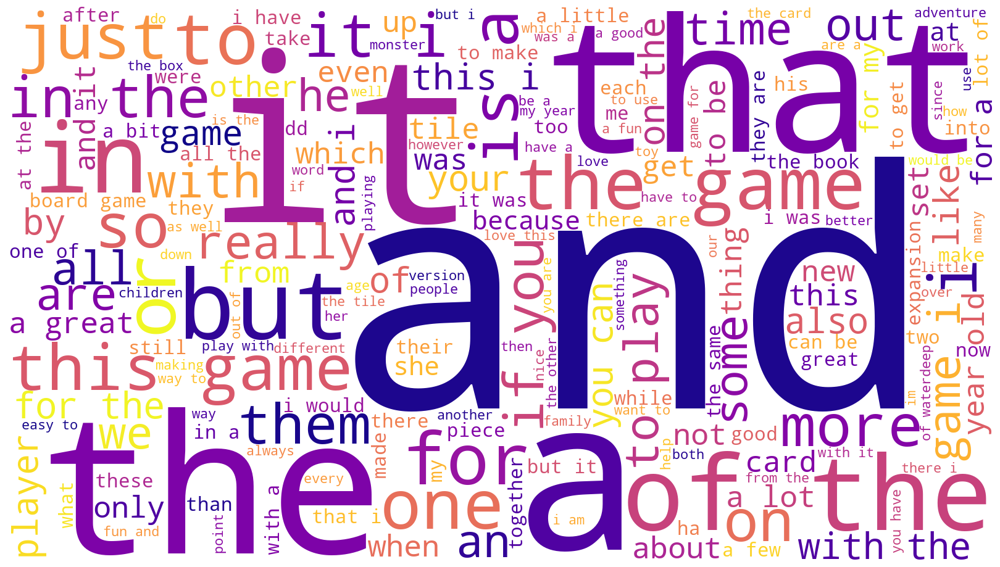

In [160]:
# Review: Plot the WordCloud image.                    
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(word_cloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show()

In [161]:
# Need to remove stopwords!

In [162]:
# Summary: Plot the WordCloud image.
# String all the comments together in a single variable.
# Create an empty string variable.
all_sum = ""
for i in range(words_clean.shape[0]): # for every row in (number of rows)
    # Add each comment.
    all_sum = all_sum + words_clean["summary_lower"][i]

# Create a WordCloud object.
word_cloud = WordCloud(width = 1600, height = 900, 
                background_color ="white",
                colormap = "plasma", 
                stopwords = "none",
                min_font_size = 10).generate(all_sum) 

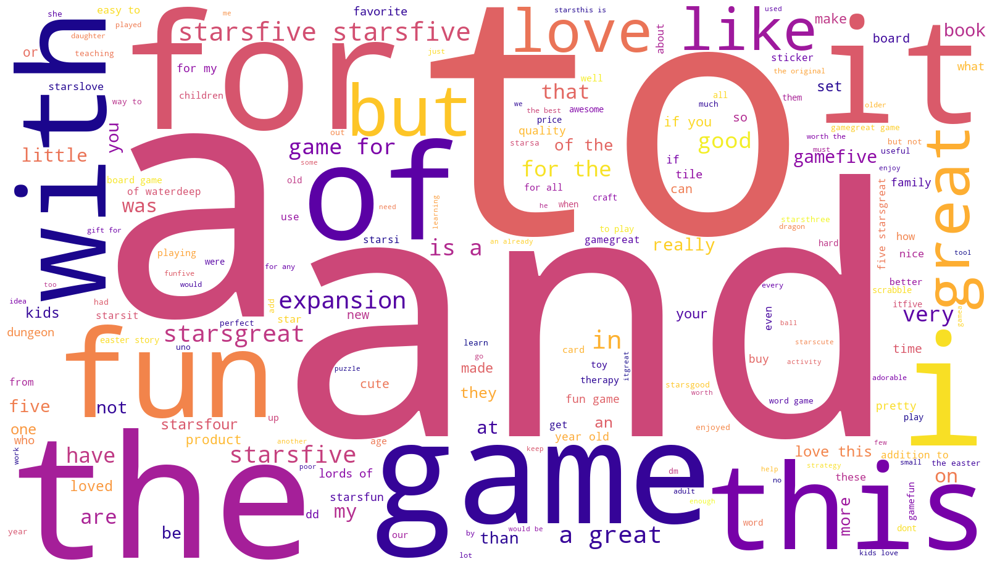

In [163]:
# Summary: Create a word cloud.               
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(word_cloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show()

In [164]:
# Remove stop words.

In [165]:
# Apply tokenisation to both columns.
words_clean["tokens_rev"] = words_clean["review_lower"].apply(word_tokenize)
words_clean["tokens_sum"] = words_clean["summary_lower"].apply(word_tokenize)

# View DataFrame.
words_clean.head()

,review_lower,summary_lower,tokens_rev,tokens_sum
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...,"[when, it, comes, to, a, dms, screen, the, spa...","[the, fact, that, 50, of, this, space, is, was..."
1,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...,"[an, open, letter, to, galeforce9, your, unpai...","[another, worthless, dungeon, masters, screen,..."
2,nice art nice printing why two panels are fill...,pretty but also pretty useless,"[nice, art, nice, printing, why, two, panels, ...","[pretty, but, also, pretty, useless]"
3,amazing buy bought it as a gift for our new dm...,five stars,"[amazing, buy, bought, it, as, a, gift, for, o...","[five, stars]"
4,as my review of gf9s previous screens these we...,money trap,"[as, my, review, of, gf9s, previous, screens, ...","[money, trap]"


In [166]:
# Define an empty list of tokens.
rev_tokens = []

for i in range(words_clean.shape[0]):
    # Add each token to the list.
    rev_tokens = rev_tokens + words_clean["tokens_rev"][i]


# Define an empty list of tokens.
sum_tokens = []

for i in range(words_clean.shape[0]):
    # Add each token to the list.
    sum_tokens = sum_tokens + words_clean["tokens_sum"][i]    

## 4. Frequency distribution and polarity
### 4a) Create frequency distribution

In [167]:
# Calculate the frequency distribution.
fdist_rev = FreqDist(rev_tokens)

# Preview data.
fdist_rev

FreqDist({'the': 5452, 'and': 3233, 'to': 3163, 'a': 3160, 'of': 2488, 'i': 2091, 'it': 2085, 'is': 1782, 'this': 1776, 'game': 1682, ...})

In [168]:
# Determine the frequency distribution.
fdist_sum = FreqDist(sum_tokens)

# Preview data.
fdist_sum

FreqDist({'stars': 448, 'five': 363, 'game': 319, 'great': 295, 'the': 261, 'a': 240, 'for': 232, 'fun': 218, 'to': 192, 'and': 168, ...})

### 4b) Remove alphanumeric characters and stopwords

In [169]:
# Remove all the stopwords
# Convert every word to lowercase
# only alphanumeric and, in the list of English words, but is not a stopword.

# stop_words = set(stopwords.words("english"))
all_english_words = set(words.words())
# Create a set of English stopwords.
english_stopwords = set(stopwords.words("english"))


# Filter out tokens that are neither alphabets nor numbers (to eliminate punctuation marks, etc.).
rev_tokens = [word for word in rev_tokens if word.isalnum()]
sum_tokens = [word for word in sum_tokens if word.isalnum()]

In [170]:
# Create a filtered list of tokens without stopwords.
rev_tokens_processed = [x for x in rev_tokens if x.lower() not in english_stopwords]

# Define an empty string variable.
revtokens2_string = ""

for value in rev_tokens_processed:
    # Add each filtered token word to the string.
    revtokens2_string = revtokens2_string + value + " "

In [171]:
# Create a filtered list of tokens without stopwords.
sum_tokens_processed = [x for x in sum_tokens if x.lower() not in english_stopwords]

# Define an empty string variable.
sumtokens2_string = ""

for value in sum_tokens_processed:
    # Add each filtered token word to the string.
    sumtokens2_string = sumtokens2_string + value + " "

In [172]:
sum_tokens

['the',
 'fact',
 'that',
 '50',
 'of',
 'this',
 'space',
 'is',
 'wasted',
 'on',
 'art',
 'and',
 'not',
 'terribly',
 'informative',
 'or',
 'needed',
 'art',
 'another',
 'worthless',
 'dungeon',
 'masters',
 'screen',
 'from',
 'galeforce9',
 'pretty',
 'but',
 'also',
 'pretty',
 'useless',
 'five',
 'stars',
 'money',
 'trap',
 'five',
 'stars',
 'best',
 'gm',
 'screen',
 'ever',
 'five',
 'stars',
 'great',
 'but',
 'could',
 'be',
 'even',
 'better',
 'another',
 'missed',
 'opportunity',
 'not',
 'a',
 'value',
 'add',
 'to',
 'the',
 'product',
 'line',
 'five',
 'stars',
 'love',
 'the',
 'map',
 'not',
 'a',
 'general',
 'dm',
 'screen',
 'very',
 'weak',
 'game',
 'fell',
 'completely',
 'flat',
 'five',
 'stars',
 'good',
 'book',
 'buckley',
 'was',
 'a',
 'card',
 'mommer',
 'very',
 'advanced',
 'but',
 'as',
 'good',
 'as',
 'it',
 'gets',
 'you',
 'better',
 'know',
 'what',
 'youre',
 'getting',
 'into',
 'dont',
 'bother',
 'the',
 'worst',
 'value',
 'ive',
 'e

In [173]:
sum_tokens_processed

['fact',
 '50',
 'space',
 'wasted',
 'art',
 'terribly',
 'informative',
 'needed',
 'art',
 'another',
 'worthless',
 'dungeon',
 'masters',
 'screen',
 'galeforce9',
 'pretty',
 'also',
 'pretty',
 'useless',
 'five',
 'stars',
 'money',
 'trap',
 'five',
 'stars',
 'best',
 'gm',
 'screen',
 'ever',
 'five',
 'stars',
 'great',
 'could',
 'even',
 'better',
 'another',
 'missed',
 'opportunity',
 'value',
 'add',
 'product',
 'line',
 'five',
 'stars',
 'love',
 'map',
 'general',
 'dm',
 'screen',
 'weak',
 'game',
 'fell',
 'completely',
 'flat',
 'five',
 'stars',
 'good',
 'book',
 'buckley',
 'card',
 'mommer',
 'advanced',
 'good',
 'gets',
 'better',
 'know',
 'youre',
 'getting',
 'dont',
 'bother',
 'worst',
 'value',
 'ive',
 'ever',
 'seen',
 'enough',
 'product',
 'good',
 'product',
 'temporary',
 'tattoos',
 'good',
 'gift',
 'huge',
 'hit',
 'gorgeous',
 'pictures',
 'five',
 'stars',
 'wonderful',
 'designs',
 'wow',
 'great',
 'coloring',
 'book',
 'nice',
 'book',

### 4c) Create wordcloud without stopwords

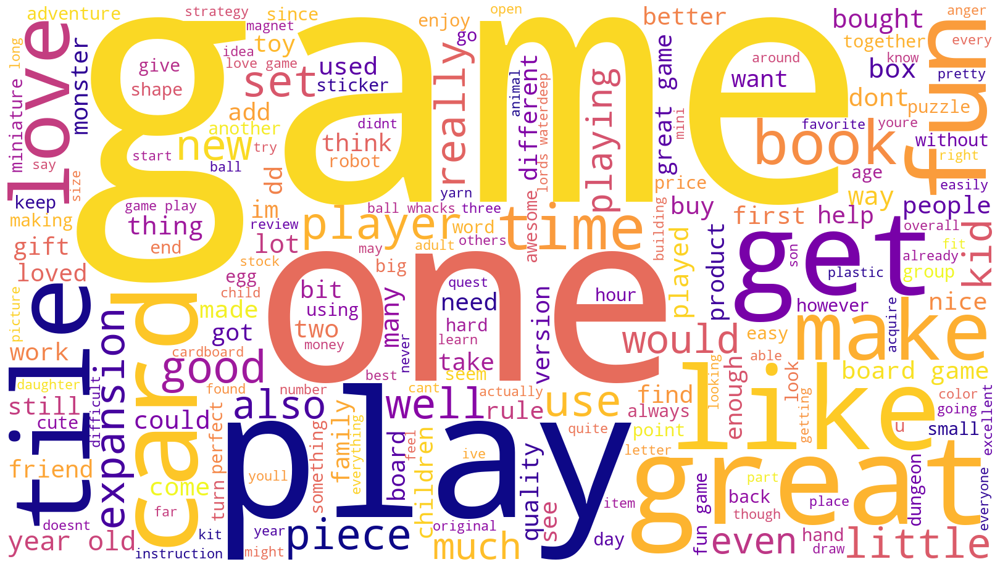

In [174]:
# Create a WordCloud object.
word_cloud_rev = WordCloud(width = 1600, height = 900, 
                background_color ="white",
                colormap = "plasma", 
                stopwords = "none",
                min_font_size = 10).generate(revtokens2_string) 

# Plot the WordCloud image.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(word_cloud_rev) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show()

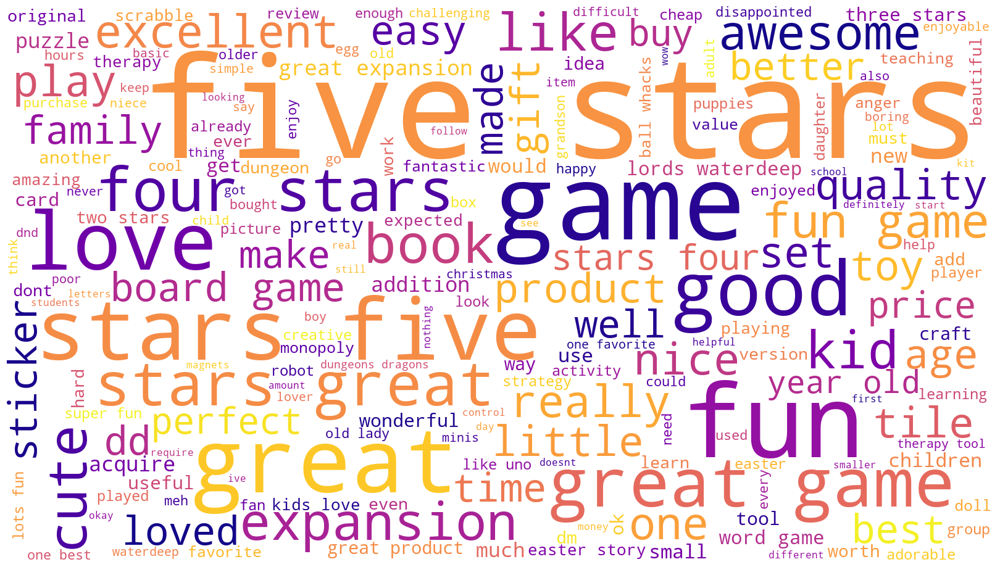

In [175]:
# Create a WordCloud object.
word_cloud_sum = WordCloud(width = 1600, height = 900, 
                background_color ="white",
                colormap = "plasma", 
                stopwords = "none",
                min_font_size = 10).generate(sumtokens2_string) 

# Plot the WordCloud image.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(word_cloud_sum) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show()

### 4d) Identify 15 most common words and polarity

In [176]:
# Determine the 15 most common words.

# Generate a DataFrame from Counter.
countsr = pd.DataFrame(Counter(rev_tokens_processed).most_common(15),
                      columns=["Word", "Frequency"]).set_index("Word")

# Preview data.
countsr

,Frequency
Word,
game,1682
great,589
fun,553
one,530
play,502
like,414
love,325
really,319
get,319


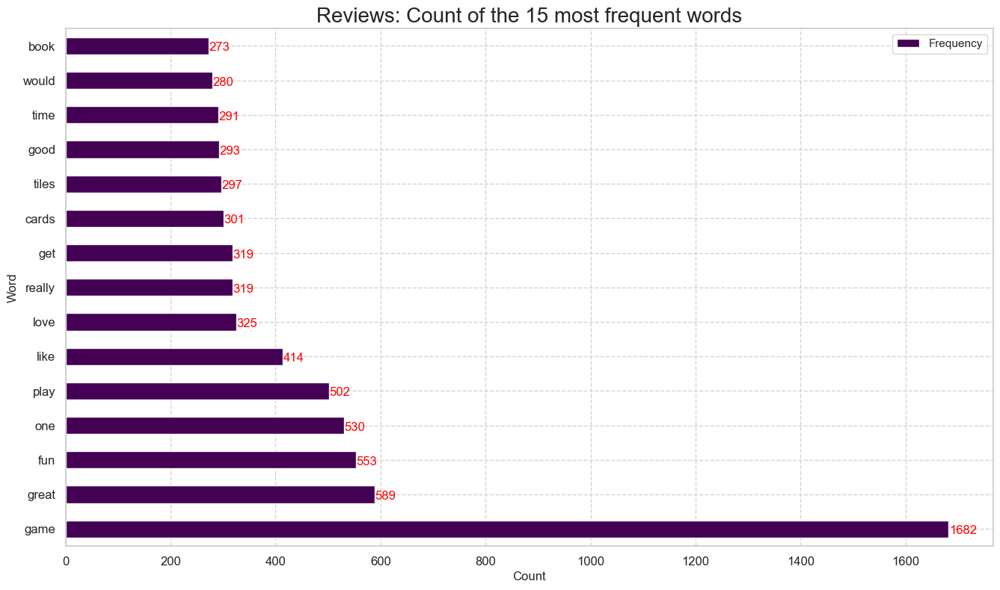

In [177]:
# Set the plot type.
ax = countsr.plot(kind="barh", figsize=(16, 9), fontsize=12,
                 colormap ="viridis")

# Set the labels.
ax.set_xlabel("Count", fontsize=12)
ax.set_ylabel("Word", fontsize=12)
ax.set_title("Reviews: Count of the 15 most frequent words",
             fontsize=20)

# Draw the bar labels.
for i in ax.patches:
    ax.text(i.get_width()+.41, i.get_y()+.1, str(round((i.get_width()), 2)),
            fontsize=12, color="red")

In [178]:
# Determine the 15 most common words.

# Generate a DataFrame from Counter.
countss = pd.DataFrame(Counter(sum_tokens_processed).most_common(15),
                      columns=["Word", "Frequency"]).set_index("Word")

# Preview data.
countss

,Frequency
Word,
stars,448
five,363
game,319
great,295
fun,218
love,93
good,92
four,58
like,54


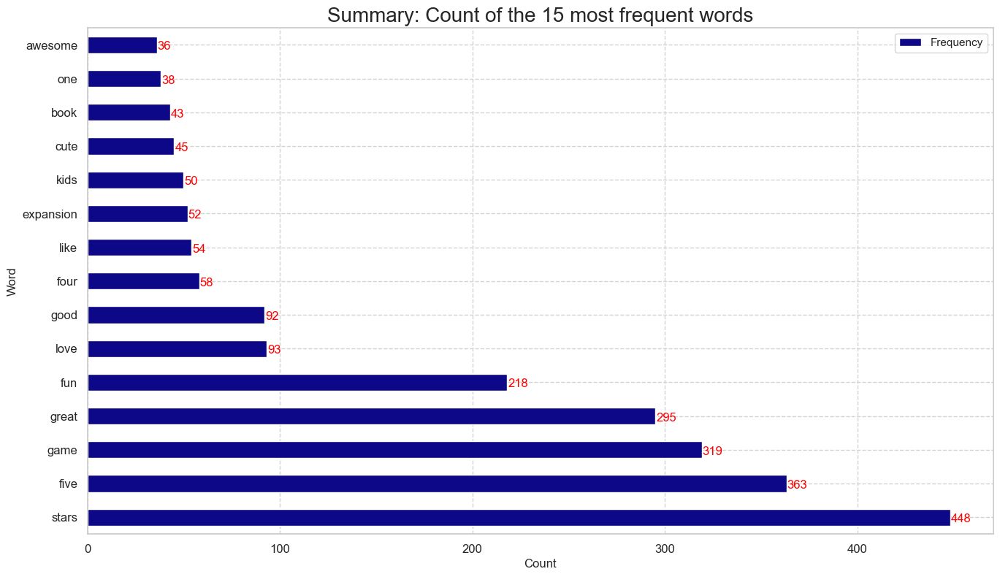

In [179]:
# Set the plot type.
ax = countss.plot(kind="barh", figsize=(16, 9), fontsize=12,
                 colormap ="plasma")

# Set the labels.
ax.set_xlabel("Count", fontsize=12)
ax.set_ylabel("Word", fontsize=12)
ax.set_title("Summary: Count of the 15 most frequent words",
             fontsize=20)

# Draw the bar labels.
for i in ax.patches:
    ax.text(i.get_width()+.41, i.get_y()+.1, str(round((i.get_width()), 2)),
            fontsize=12, color="red")

## 5. Review polarity and sentiment: Plot histograms of polarity (use 15 bins) and sentiment scores for the respective columns.

In [180]:
# Generate Polarity function.
def generate_polarity(comment):
    '''Extract polarity score (-1 to +1) for each comment'''
    return TextBlob(comment).sentiment[0]

In [181]:
# Determine polarity of both columns. 

words_clean["polarity_rev"] = words_clean["review_lower"].apply(generate_polarity)
words_clean["polarity_sum"] = words_clean["summary_lower"].apply(generate_polarity)


# View output.
words_clean.head()

,review_lower,summary_lower,tokens_rev,tokens_sum,polarity_rev,polarity_sum
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...,"[when, it, comes, to, a, dms, screen, the, spa...","[the, fact, that, 50, of, this, space, is, was...",-0.036111,0.15
1,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...,"[an, open, letter, to, galeforce9, your, unpai...","[another, worthless, dungeon, masters, screen,...",0.035952,-0.80
2,nice art nice printing why two panels are fill...,pretty but also pretty useless,"[nice, art, nice, printing, why, two, panels, ...","[pretty, but, also, pretty, useless]",0.116640,0.00
3,amazing buy bought it as a gift for our new dm...,five stars,"[amazing, buy, bought, it, as, a, gift, for, o...","[five, stars]",0.578788,0.00
4,as my review of gf9s previous screens these we...,money trap,"[as, my, review, of, gf9s, previous, screens, ...","[money, trap]",-0.316667,0.00


In [182]:
# Define a function to extract a subjectivity score for the comment.
def generate_subjectivity(comment):
    return TextBlob(comment).sentiment[1]

# Populate a new column with subjectivity scores for each comment.
words_clean["subjectivity_rev"] = words_clean["review_lower"].apply(generate_subjectivity)
words_clean["subjectivity_sum"] = words_clean["summary_lower"].apply(generate_subjectivity)


# Preview the result.
words_clean.head()

,review_lower,summary_lower,tokens_rev,tokens_sum,polarity_rev,polarity_sum,subjectivity_rev,subjectivity_sum
0,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...,"[when, it, comes, to, a, dms, screen, the, spa...","[the, fact, that, 50, of, this, space, is, was...",-0.036111,0.15,0.486111,0.500000
1,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...,"[an, open, letter, to, galeforce9, your, unpai...","[another, worthless, dungeon, masters, screen,...",0.035952,-0.80,0.442976,0.900000
2,nice art nice printing why two panels are fill...,pretty but also pretty useless,"[nice, art, nice, printing, why, two, panels, ...","[pretty, but, also, pretty, useless]",0.116640,0.00,0.430435,0.733333
3,amazing buy bought it as a gift for our new dm...,five stars,"[amazing, buy, bought, it, as, a, gift, for, o...","[five, stars]",0.578788,0.00,0.784848,0.000000
4,as my review of gf9s previous screens these we...,money trap,"[as, my, review, of, gf9s, previous, screens, ...","[money, trap]",-0.316667,0.00,0.316667,0.000000


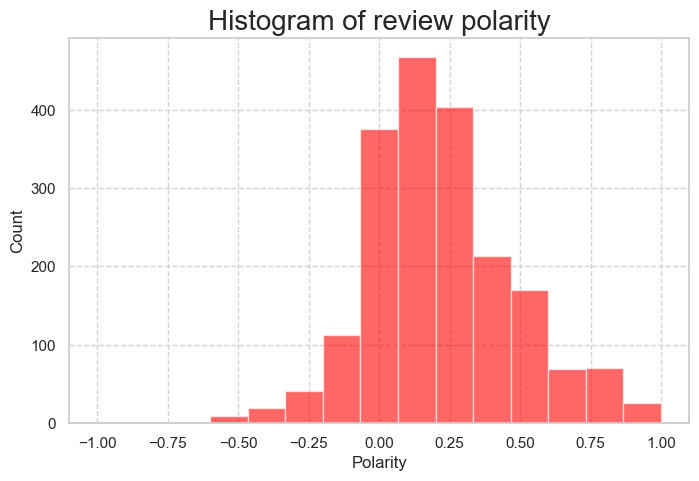

In [183]:
# Review: Create a histogram plot with bins = 15.
# Histogram of polarity
# Set the number of bins.
num_bins = 15

# Set the plot area.
plt.figure(figsize=(8,5))

# Define the bars.
n, bins, patches = plt.hist(words_clean["polarity_rev"], num_bins, facecolor="red", alpha=0.6)

# Set the labels.
plt.xlabel("Polarity", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.title("Histogram of review polarity", fontsize=20)

plt.show()

The polarity of reviews is more positive than negative, with some neutral stances.

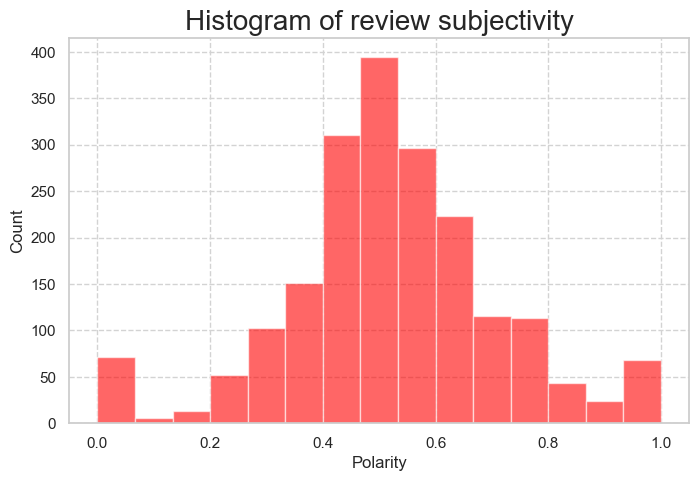

In [184]:
# Review: Create a histogram plot with bins = 15.
# Histogram of subjectivity
# Set the number of bins.
num_bins = 15

# Set the plot area.
plt.figure(figsize=(8,5))

# Define the bars.
n, bins, patches = plt.hist(words_clean["subjectivity_rev"], num_bins, facecolor="red", alpha=0.6)

# Set the labels.
plt.xlabel("Polarity", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.title("Histogram of review subjectivity", fontsize=20)

plt.show()

##### Subjectivity of zero = fact-based responses.
##### Subjectivity of One = emotion-based responses.
##### Most reviews are halfway between 0 and 1.

### VADER sentiment score.

In [185]:
# Histogram of sentiment score (compound)

# Create a variable sia to store the SentimentIntensityAnalyser() method.
sia = SentimentIntensityAnalyzer()

""" Run through a dictionary comprehension to take every cleaned comment
Next run the polarity score function on the string.
This will return four values in a dictionary """

df_sent_rev = words_clean["review_lower"].apply(lambda x: sia.polarity_scores(str(x))).apply(pd.Series)

# View the DataFrame.
df_sent_rev

,neg,neu,pos,compound
0,0.108,0.833,0.059,-0.6333
1,0.101,0.695,0.205,0.9404
2,0.136,0.711,0.153,-0.0045
3,0.000,0.490,0.510,0.8860
4,0.203,0.797,0.000,-0.6808
...,...,...,...,...
1977,0.000,0.599,0.401,0.9137
1978,0.032,0.760,0.208,0.8606
1979,0.000,0.631,0.369,0.6249
1980,0.000,0.233,0.767,0.5106


In [186]:
df_sent_rev = pd.merge(df_sent_rev, words_clean["review_lower"], left_index=True, right_index=True)
df_sent_rev

,neg,neu,pos,compound,review_lower
0,0.108,0.833,0.059,-0.6333,when it comes to a dms screen the space on the...
1,0.101,0.695,0.205,0.9404,an open letter to galeforce9 your unpainted mi...
2,0.136,0.711,0.153,-0.0045,nice art nice printing why two panels are fill...
3,0.000,0.490,0.510,0.8860,amazing buy bought it as a gift for our new dm...
4,0.203,0.797,0.000,-0.6808,as my review of gf9s previous screens these we...
...,...,...,...,...,...
1977,0.000,0.599,0.401,0.9137,the perfect word game for mixed ages with mom ...
1978,0.032,0.760,0.208,0.8606,great game did not think i would like it when ...
1979,0.000,0.631,0.369,0.6249,great game for all keeps the mind nimble
1980,0.000,0.233,0.767,0.5106,fun game


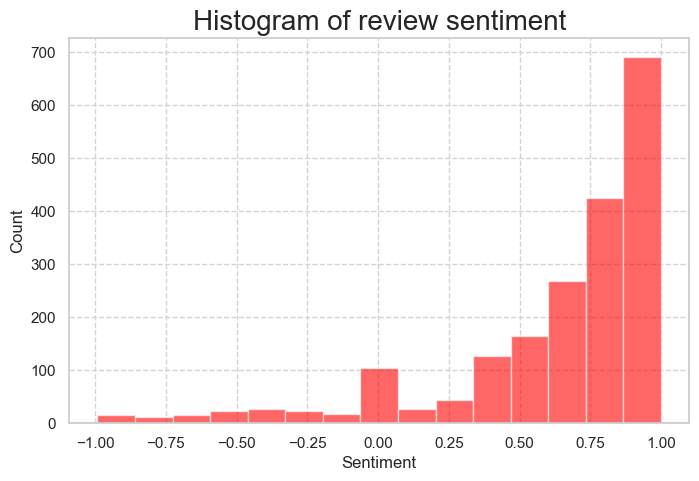

In [187]:
num_bins = 15

# Set the plot area.
plt.figure(figsize=(8,5))

# Define the bars.
n, bins, patches = plt.hist(df_sent_rev["compound"], num_bins, facecolor="red", alpha=0.6)

# Set the labels.
plt.xlabel("Sentiment", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.title("Histogram of review sentiment", fontsize=20)

plt.show()

###### In VADER, the compound score also ranges from –1 to +1 but represents a normalised, weighted overall sentiment, combining positive, negative, and neutral components while accounting for context such as negations, intensifiers, punctuation, and capitalisation.

###### Polarity is a simpler lexical sentiment score, while VADER’s compound score is a more context-aware and robust measure of overall sentiment.

### VADER works better when the text has not been converted to lowercase or had punctuation removed.

In [188]:
# Histogram of sentiment score (compound) without altering case/punctuation.

df_sent_rev2 = wordsdf["review"].apply(lambda x: sia.polarity_scores(str(x))).apply(pd.Series)

# View the DataFrame.
df_sent_rev2

,neg,neu,pos,compound
0,0.109,0.856,0.035,-0.7406
1,0.092,0.703,0.205,0.9433
2,0.122,0.723,0.155,0.6939
3,0.000,0.477,0.523,0.8997
4,0.203,0.797,0.000,-0.6808
...,...,...,...,...
1977,0.000,0.544,0.456,0.9423
1978,0.032,0.760,0.208,0.8606
1979,0.000,0.614,0.386,0.6588
1980,0.000,0.218,0.782,0.5562


In [189]:
df_sent_rev2 = pd.merge(df_sent_rev2, wordsdf["review"], left_index=True, right_index=True)
df_sent_rev2

,neg,neu,pos,compound,review
0,0.109,0.856,0.035,-0.7406,"When it comes to a DM's screen, the space on t..."
1,0.092,0.703,0.205,0.9433,An Open Letter to GaleForce9*:\n\nYour unpaint...
2,0.122,0.723,0.155,0.6939,"Nice art, nice printing. Why two panels are f..."
3,0.000,0.477,0.523,0.8997,Amazing buy! Bought it as a gift for our new d...
4,0.203,0.797,0.000,-0.6808,As my review of GF9's previous screens these w...
...,...,...,...,...,...
1977,0.000,0.544,0.456,0.9423,The perfect word game for mixed ages (with Mom...
1978,0.032,0.760,0.208,0.8606,Great game. Did not think I would like it whe...
1979,0.000,0.614,0.386,0.6588,Great game for all.........\nKeeps the mind ni...
1980,0.000,0.218,0.782,0.5562,fun game!


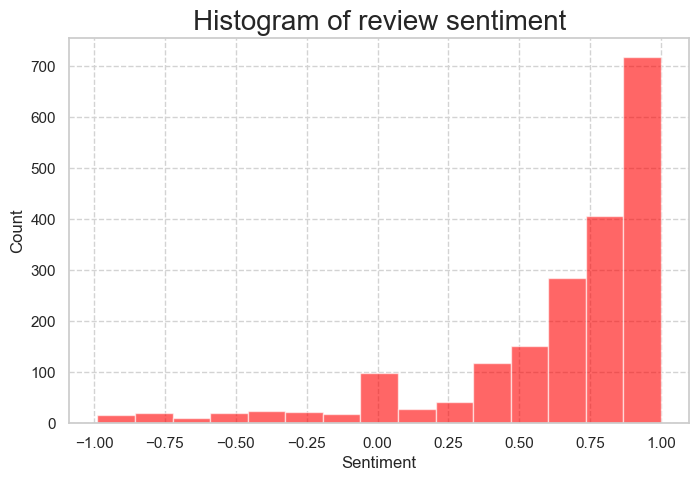

In [190]:
num_bins = 15

# Set the plot area.
plt.figure(figsize=(8,5))

# Define the bars.
n, bins, patches = plt.hist(df_sent_rev2["compound"], num_bins, facecolor="red", alpha=0.6)

# Set the labels.
plt.xlabel("Sentiment", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.title("Histogram of review sentiment", fontsize=20)

plt.show()

There does not seem to be much difference with and without review processing.

### Summary Polarity, Subjectivity, Sentiment.

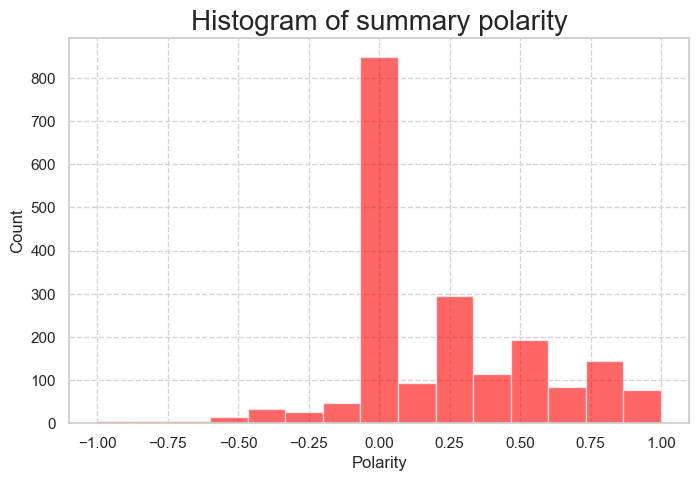

In [191]:
# Summary: Create a histogram plot with bins = 15.
# Set the number of bins.
num_bins = 15

# Set the plot area.
plt.figure(figsize=(8,5))

# Define the bars.
n, bins, patches = plt.hist(words_clean["polarity_sum"], num_bins, facecolor="red", alpha=0.6)

# Set the labels.
plt.xlabel("Polarity", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.title("Histogram of summary polarity", fontsize=20)

plt.show()

As with reviews, there are more positive than negative summaries, with a lot of neutral summaries.

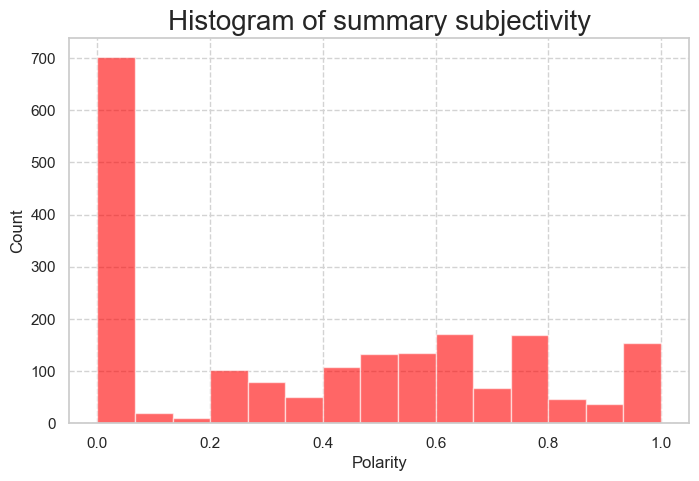

In [192]:
# Histogram of subjectivity
# Set the number of bins.
num_bins = 15

# Set the plot area.
plt.figure(figsize=(8,5))

# Define the bars.
n, bins, patches = plt.hist(words_clean["subjectivity_sum"], num_bins, facecolor="red", alpha=0.6)

# Set the labels.
plt.xlabel("Polarity", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.title("Histogram of summary subjectivity", fontsize=20)

plt.show()

##### Subjectivity of zero = fact-based responses.
##### Subjectivity of One = emotion-based responses.
##### There are many summaries that have been classed as factual. The rest of the responses have a large range.

In [193]:
# Histogram of sentiment score (compound)

df_sent_sum = words_clean["summary_lower"].apply(lambda x: sia.polarity_scores(str(x))).apply(pd.Series)

# View the DataFrame.
df_sent_sum

,neg,neu,pos,compound
0,0.145,0.723,0.132,-0.0711
1,0.326,0.674,0.000,-0.4404
2,0.306,0.165,0.529,0.4019
3,0.000,1.000,0.000,0.0000
4,0.697,0.303,0.000,-0.3182
...,...,...,...,...
1977,0.000,0.684,0.316,0.5719
1978,0.000,0.000,1.000,0.8020
1979,0.000,0.196,0.804,0.6249
1980,0.000,1.000,0.000,0.0000


In [194]:
df_sent_sum = pd.merge(df_sent_sum, words_clean["summary_lower"], left_index=True, right_index=True)
df_sent_sum

,neg,neu,pos,compound,summary_lower
0,0.145,0.723,0.132,-0.0711,the fact that 50 of this space is wasted on ar...
1,0.326,0.674,0.000,-0.4404,another worthless dungeon masters screen from ...
2,0.306,0.165,0.529,0.4019,pretty but also pretty useless
3,0.000,1.000,0.000,0.0000,five stars
4,0.697,0.303,0.000,-0.3182,money trap
...,...,...,...,...,...
1977,0.000,0.684,0.316,0.5719,the perfect word game for mixed ages with mom
1978,0.000,0.000,1.000,0.8020,super fun
1979,0.000,0.196,0.804,0.6249,great game
1980,0.000,1.000,0.000,0.0000,four stars


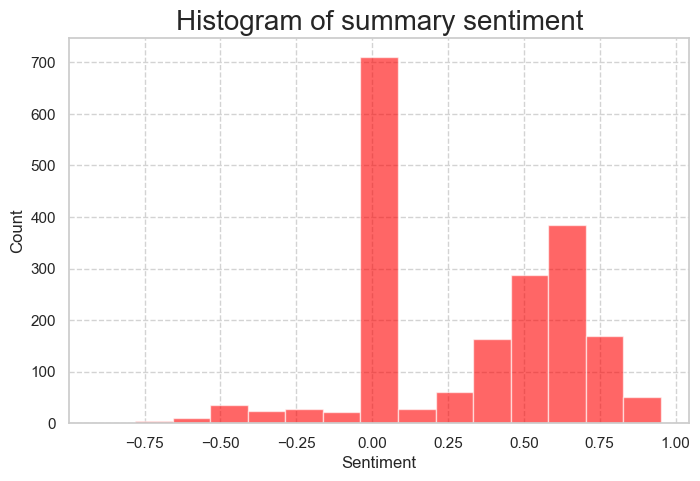

In [195]:
num_bins = 15

# Set the plot area.
plt.figure(figsize=(8,5))

# Define the bars.
n, bins, patches = plt.hist(df_sent_sum["compound"], num_bins, facecolor="red", alpha=0.6)

# Set the labels.
plt.xlabel("Sentiment", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.title("Histogram of summary sentiment", fontsize=20)

plt.show()

The sentiment is mostly positive or neutral for summaries.

In [196]:
# Try VADER without pre-processing

df_sent_sum2 = wordsdf["summary"].apply(lambda x: sia.polarity_scores(str(x))).apply(pd.Series)

# View the DataFrame.
df_sent_sum2

,neg,neu,pos,compound
0,0.138,0.735,0.126,-0.0711
1,0.326,0.674,0.000,-0.4404
2,0.306,0.165,0.529,0.4019
3,0.000,1.000,0.000,0.0000
4,0.697,0.303,0.000,-0.3182
...,...,...,...,...
1977,0.000,0.684,0.316,0.5719
1978,0.000,0.000,1.000,0.8020
1979,0.000,0.196,0.804,0.6249
1980,0.000,1.000,0.000,0.0000


In [197]:
df_sent_sum2 = pd.merge(df_sent_sum2, wordsdf["summary"], left_index=True, right_index=True)
df_sent_sum2

,neg,neu,pos,compound,summary
0,0.138,0.735,0.126,-0.0711,The fact that 50% of this space is wasted on a...
1,0.326,0.674,0.000,-0.4404,Another worthless Dungeon Master's screen from...
2,0.306,0.165,0.529,0.4019,"pretty, but also pretty useless"
3,0.000,1.000,0.000,0.0000,Five Stars
4,0.697,0.303,0.000,-0.3182,Money trap
...,...,...,...,...,...
1977,0.000,0.684,0.316,0.5719,The perfect word game for mixed ages (with Mom
1978,0.000,0.000,1.000,0.8020,Super fun
1979,0.000,0.196,0.804,0.6249,Great Game
1980,0.000,1.000,0.000,0.0000,Four Stars


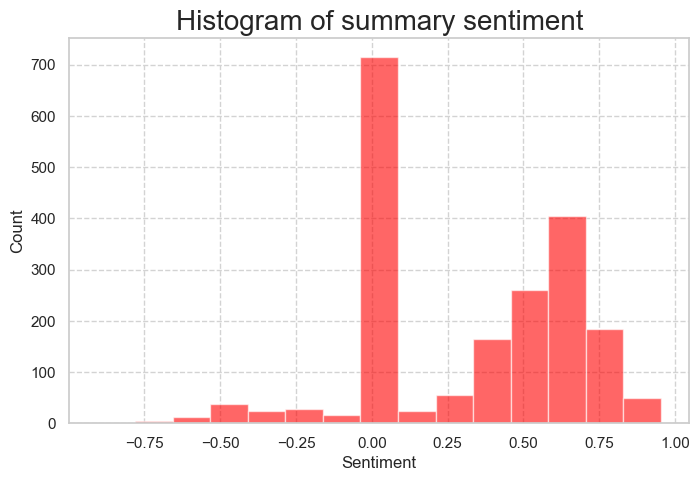

In [198]:
num_bins = 15

# Set the plot area.
plt.figure(figsize=(8,5))

# Define the bars.
n, bins, patches = plt.hist(df_sent_sum2["compound"], num_bins, facecolor="red", alpha=0.6)

# Set the labels.
plt.xlabel("Sentiment", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.title("Histogram of summary sentiment", fontsize=20)

plt.show()

No major differences seen pre/post processing.

## 6. Identify top 20 negative and positive reviews and summaries respectively

In [199]:
# Top 20 negative reviews.
pd.set_option("display.max_colwidth", None)
top20NegReviews = df_sent_rev2.sort_values("neg", ascending=0).head(20)
# View output.
top20NegReviews = pd.merge(top20NegReviews, reviews_cleaned["product"], left_index=True, right_index=True)
top20NegReviews

,neg,neu,pos,compound,review,product
301,1.000,0.000,0.000,-0.3612,Difficult,3525
182,0.576,0.424,0.000,-0.6221,Incomplete kit! Very disappointing!,6504
1124,0.524,0.476,0.000,-0.2960,No more comments,10241
877,0.487,0.455,0.058,-0.9052,"A crappy cardboard ghost of the original. Hard to believe they did this, but they did. Shame on Hasbro. Disgusting.",399
1321,0.470,0.456,0.075,-0.7946,Not a hard game to learn but not easy to win.,4470
230,0.455,0.545,0.000,-0.3612,I found the directions difficult,2173
212,0.445,0.334,0.221,-0.5207,"Who doesn't love puppies. Great instructions, pictures. Fun.",1501
377,0.368,0.632,0.000,-0.4717,"different, kids had red faces, not sure they like",7143
1304,0.367,0.633,0.000,-0.4404,Got the product in damaged condition,5510
281,0.362,0.592,0.045,-0.9520,"I bought this thinking it would be really fun , but I was disappointed . It's really messy and it isn't nearly as easy as it seems. Also, the glue is useless.\nFor a 9 year old the instructions are very difficult.",518


Incorrectly identified as negative: \
#1124 "No more comments" \
#1321 Not a hard game to learn but not easy to win. \
#212 "Who doesn't love puppies. Great instructions, pictures. Fun." \
#434 "Easy-to-use great for anger management groups"

In [200]:
# Top 20 negative summaries.
pd.set_option("display.max_colwidth", None)
top20NegSum = df_sent_sum2.sort_values("neg", ascending=0).head(20)

# View output.
top20NegSum = pd.merge(top20NegSum, reviews_cleaned["product"], left_index=True, right_index=True)
top20NegSum

,neg,neu,pos,compound,summary,product
824,1.000,0.000,0.0,-0.3182,Boring,2253
627,1.000,0.000,0.0,-0.4767,Disappointed.,2173
1273,1.000,0.000,0.0,-0.0772,Meh,6715
1107,1.000,0.000,0.0,-0.4939,Disappointing,5430
1008,1.000,0.000,0.0,-0.4939,Disappointing.,1241
801,1.000,0.000,0.0,-0.4939,Disappointing,1459
1755,1.000,0.000,0.0,-0.0772,Meh,8962
144,1.000,0.000,0.0,-0.4767,Disappointed,2807
1604,1.000,0.000,0.0,-0.4767,Disappointed,2814
1786,1.000,0.000,0.0,-0.4939,Disappointing,1506


Incorrectly identified as negative: \
#514 "Mad dragon"

In [201]:
# Top 20 positive reviews.
pd.set_option("display.max_colwidth", None)
top20PosReviews = df_sent_rev2.sort_values("pos", ascending=0).head(20)
# View output.
top20PosReviews = pd.merge(top20PosReviews, reviews_cleaned["product"], left_index=True, right_index=True)
top20PosReviews

,neg,neu,pos,compound,review,product
49,0.0,0.0,1.0,0.3182,cool,2114
588,0.0,0.0,1.0,0.9184,Loved loved loved!,3112
786,0.0,0.0,1.0,0.6114,Perfect!,8923
55,0.0,0.0,1.0,0.6588,Great!,3896
928,0.0,0.0,1.0,0.6249,Awesome,10240
1915,0.0,0.0,1.0,0.4404,good,2795
572,0.0,0.0,1.0,0.6249,Great.,5740
1181,0.0,0.0,1.0,0.4753,Satisfied!,9080
83,0.0,0.0,1.0,0.7351,Fun gift,2521
425,0.0,0.0,1.0,0.6908,"Satisfied, thanks",624


In [202]:
# Top 20 positive summaries.
pd.set_option("display.max_colwidth", None)
top20PosSum = df_sent_sum2.sort_values("pos", ascending=0).head(20)

# View output.
top20PosSum = pd.merge(top20PosSum, reviews_cleaned["product"], left_index=True, right_index=True)
top20PosSum

,neg,neu,pos,compound,summary,product
643,0.0,0.0,1.0,0.6114,Wonderful!,3678
32,0.0,0.0,1.0,0.6114,Perfect!,2253
734,0.0,0.0,1.0,0.4588,cute,10270
743,0.0,0.0,1.0,0.6588,Great!,7381
753,0.0,0.0,1.0,0.5719,Excellent,4712
864,0.0,0.0,1.0,0.4404,entertaining,9595
578,0.0,0.0,1.0,0.6696,Love!,6431
938,0.0,0.0,1.0,0.5106,fun,7373
964,0.0,0.0,1.0,0.4404,good,5726
988,0.0,0.0,1.0,0.8020,Super fun,9150


#### Word Clouds on top/bottom 20 reviews and summaries.

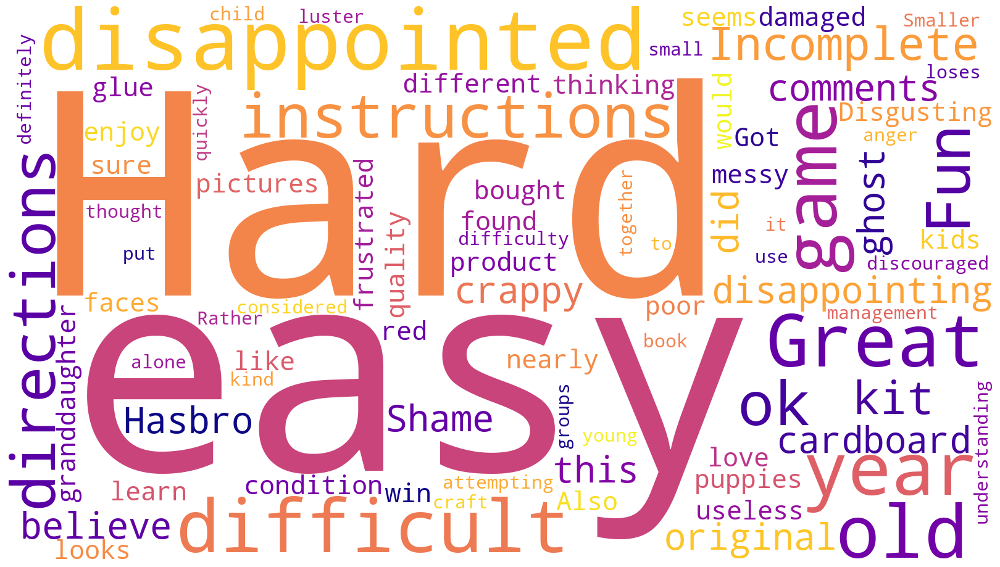

In [203]:
# Create a wordcloud without stop words.
custom_stopwords ={"really"}

text = " ".join(
    word
    for review in top20NegReviews["review"].astype(str)
    for word in review.split()
    if word.lower() not in english_stopwords
    and word.lower() not in custom_stopwords
)

# Create a WordCloud object.
word_cloud_sum = WordCloud(width = 1600, height = 900, 
                background_color ="white",
                colormap = "plasma", 
                stopwords = "none",
                min_font_size = 10).generate(text) 

# Plot the WordCloud image.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(word_cloud_sum) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show()

Note: the "easy" in the word cloud is usually after "not" or a negative.

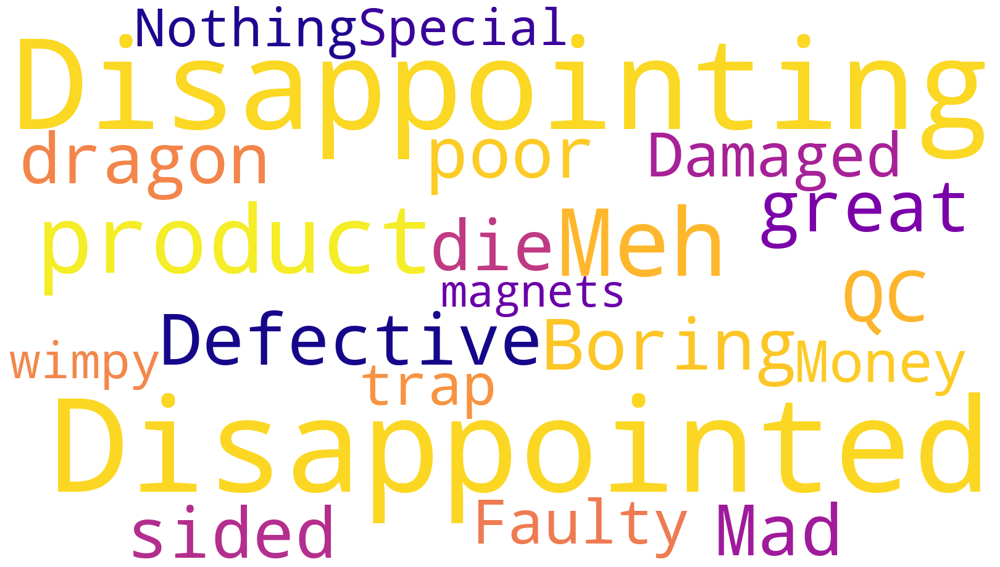

In [204]:
# Create a wordcloud without stop words.
custom_stopwords ={""}

text = " ".join(
    word
    for review in top20NegSum["summary"].astype(str)
    for word in review.split()
    if word.lower() not in english_stopwords
    and word.lower() not in custom_stopwords
)

# Create a WordCloud object.
word_cloud_sum = WordCloud(width = 1600, height = 900, 
                background_color ="white",
                colormap = "plasma", 
                stopwords = "none",
                min_font_size = 10).generate(text) 

# Plot the WordCloud image.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(word_cloud_sum) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show()

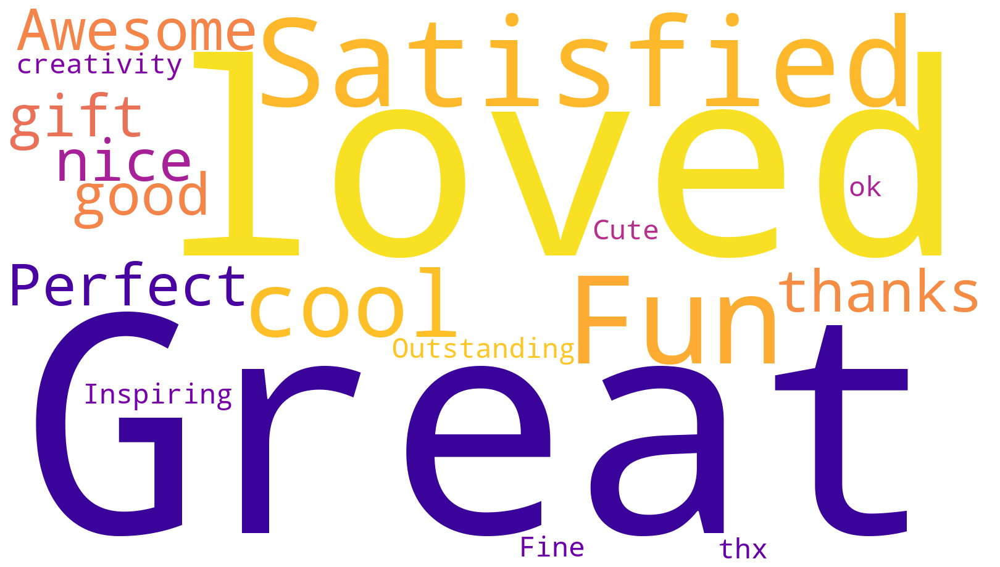

In [205]:
# Create a wordcloud without stop words.
custom_stopwords ={""}

text = " ".join(
    word
    for review in top20PosReviews["review"].astype(str)
    for word in review.split()
    if word.lower() not in english_stopwords
    and word.lower() not in custom_stopwords
)

# Create a WordCloud object.
word_cloud_sum = WordCloud(width = 1600, height = 900, 
                background_color ="white",
                colormap = "plasma", 
                stopwords = "none",
                min_font_size = 10).generate(text) 
# Plot the WordCloud image.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(word_cloud_sum) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show()

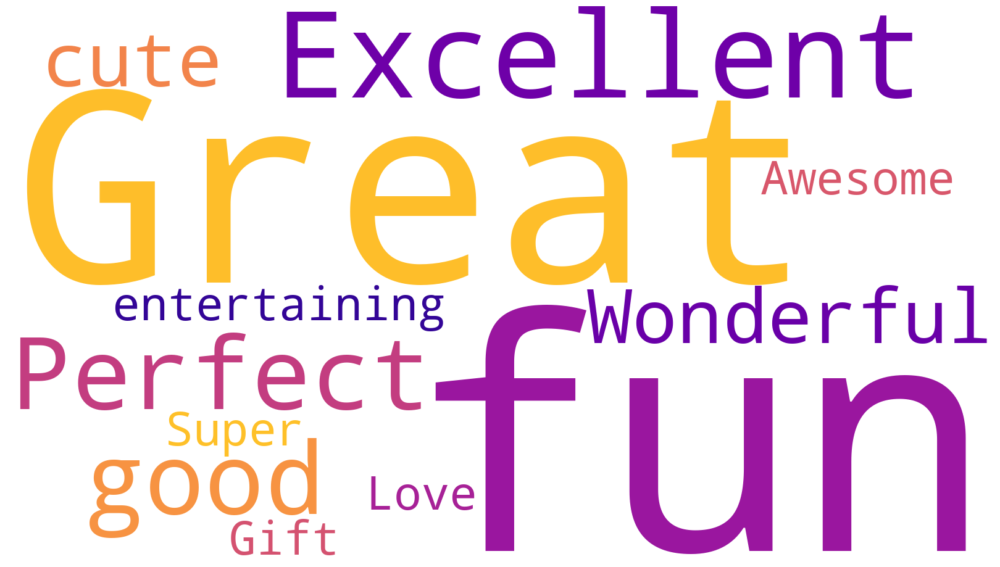

In [206]:
# Create a wordcloud without stop words.
custom_stopwords ={""}

text = " ".join(
    word
    for review in top20PosSum["summary"].astype(str)
    for word in review.split()
    if word.lower() not in english_stopwords
    and word.lower() not in custom_stopwords
)

# Create a WordCloud object.
word_cloud_sum = WordCloud(width = 1600, height = 900, 
                background_color ="white",
                colormap = "plasma", 
                stopwords = "none",
                min_font_size = 10).generate(text) 

# Plot the WordCloud image.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(word_cloud_sum) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
plt.show()

#

# Correlation between sentiment scores and Loyalty Points and Demographics

For the following analysis, VADER is used instead of TextBlob for the following reasons:
VADER’s compound score is a normalised, context-aware sentiment measure.

- Accounts for negations (“not good”)

- Handles intensifiers (“very”, “extremely”)

- Uses punctuation, capitalisation, emojis

- Is designed for short, informal text (reviews, comments)

This makes it more robust and realistic for real-world review data.

In [207]:
# If the NLP analysis is accurate, there should be a strong positive correlation between review and summary sentiment scores.
# This needs to be checked:
sentiment_df = pd.merge(df_sent_rev2, df_sent_sum2, left_index=True, right_index=True, suffixes=("_rev", "_sum"))
sentiment_df.head()

,neg_rev,neu_rev,pos_rev,compound_rev,review,neg_sum,neu_sum,pos_sum,compound_sum,summary
0,0.109,0.856,0.035,-0.7406,"When it comes to a DM's screen, the space on the screen itself is at an absolute premium. The fact that 50% of this space is wasted on art (and not terribly informative or needed art as well) makes it completely useless. The only reason that I gave it 2 stars and not 1 was that, technically speaking, it can at least still stand up to block your notes and dice rolls. Other than that, it drops the ball completely.",0.138,0.735,0.126,-0.0711,The fact that 50% of this space is wasted on art (and not terribly informative or needed art ...
1,0.092,0.703,0.205,0.9433,"An Open Letter to GaleForce9*:\n\nYour unpainted miniatures are very not bad. Your spell cards are great. Your board games are ""meh"". Your DM screens, however, are freaking terrible. I'm still waiting for a single screen that isn't polluted with pointless artwork where useful, reference-able tables should be. Once again, you've created a single use screen that is only useful when running the ""Storm King's Thunder"" adventure. Even despite the fact that it's geared to that adventure path, it's usefulness negligible, at best. I massive swath of the inner panel is wasted on artwork and a bloated overland map, which could have been easily reduced to a single panel in size. And the few table you have are nigh-useless themselves.\n\nIn short, stop making crap DM screens.",0.326,0.674,0.000,-0.4404,Another worthless Dungeon Master's screen from GaleForce9
2,0.122,0.723,0.155,0.6939,"Nice art, nice printing. Why two panels are filled with a general Forgotten Realms map is beyond me. Most of one of them is all blue ocean. Such a waste.\n\nI don't understand why they can't make these DM Screens more useful for these ""kinds of adventures"" rather than solely the specific adventure. You're supposed to be able to transpose this adventure to other lands outside the Forgotten Realms. So even just a list of new monsters or NPCs would at least be useful than the map. Even more would just be stuff related to running the game but broad-use stuff related to giants.\n\nSame thing with Curse of Strahd. Why not make it useful for raven loft, undead or horror campaigns in general... instead a huge amount of screen space is solely mapping out Castle Ravenloft, which is only useful during a small fraction of the time even for the Curse of Strahd adventure, let alone various other Ravenloft adventuring.\n\nThey really kill the extended use of these screens by not thinking about their potential use, both for the adventure in question, as well as use in a broader sense.\n\nThe Rage of Demons screen is far more useful for broad under dark adventuring - covering a lot of rules for the various conditions you may suffer... and the map is only one panel.\n\nThis Storm Giants one is decent for a few tables it includes - but really misses the mark. Maybe they should ask a few DMs what they would use?",0.306,0.165,0.529,0.4019,"pretty, but also pretty useless"
3,0.000,0.477,0.523,0.8997,Amazing buy! Bought it as a gift for our new dm and it's perfect!,0.000,1.000,0.000,0.0000,Five Stars
4,0.203,0.797,0.000,-0.6808,"As my review of GF9's previous screens these were completely unnecessary and nearly useless. Skip them, this is the definition of a waste of money.",0.697,0.303,0.000,-0.3182,Money trap


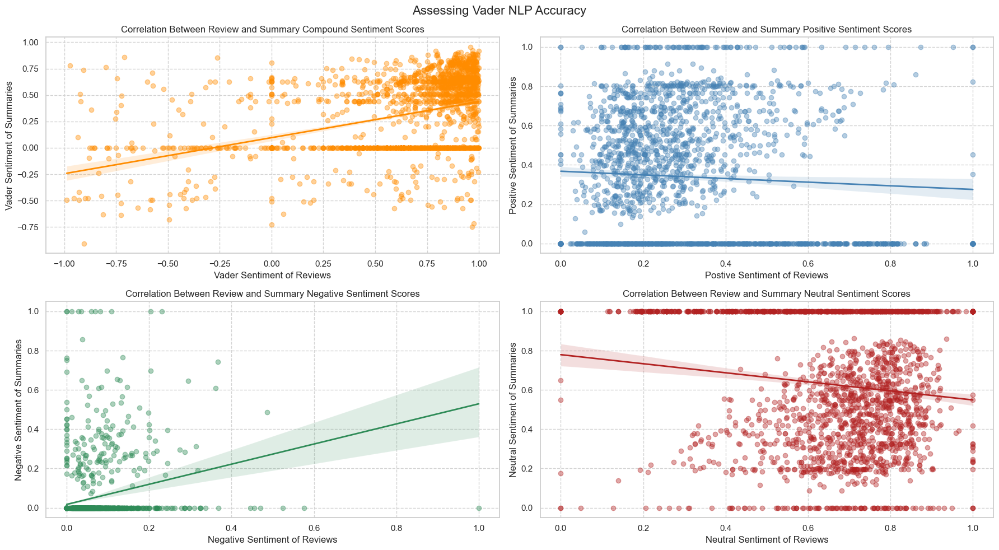

In [208]:
# Plot review and summary sentiments.
fig, axes = plt.subplots(2, 2, figsize=(18, 10))

# [0,0] Compound Sentiment using Vader
sns.regplot(x="compound_rev", y="compound_sum", data=sentiment_df,
            scatter_kws={"color": "darkorange", "alpha": 0.4}, line_kws={"color": "darkorange", "linewidth": 2}, ax=axes[0,0])
axes[0, 0].set_xlabel("Vader Sentiment of Reviews")
axes[0, 0].set_ylabel("Vader Sentiment of Summaries")
axes[0, 0].set_title("Correlation Between Review and Summary Compound Sentiment Scores")


# [0,1] Postive
sns.regplot(x="pos_rev", y="pos_sum", data=sentiment_df,
            scatter_kws={"color": "steelblue", "alpha": 0.4}, line_kws={"color": "steelblue", "linewidth": 2}, ax=axes[0,1])
axes[0, 1].set_xlabel("Postive Sentiment of Reviews")
axes[0, 1].set_ylabel("Positive Sentiment of Summaries")
axes[0, 1].set_title("Correlation Between Review and Summary Positive Sentiment Scores")


# [1,0] Negative
sns.regplot(x="neg_rev", y="neg_sum", data=sentiment_df,
            scatter_kws={"color": "seagreen", "alpha":0.4}, line_kws={"color": "seagreen", "linewidth": 2}, ax=axes[1,0])
axes[1, 0].set_xlabel("Negative Sentiment of Reviews")
axes[1, 0].set_ylabel("Negative Sentiment of Summaries")
axes[1, 0].set_title("Correlation Between Review and Summary Negative Sentiment Scores")

# [1,1] Neutral
sns.regplot(x="neu_rev", y="neu_sum", data=sentiment_df,
            scatter_kws={"color": "firebrick", "alpha":0.4}, line_kws={"color": "firebrick", "linewidth": 2}, ax=axes[1,1])
axes[1, 1].set_xlabel("Neutral Sentiment of Reviews")
axes[1, 1].set_ylabel("Neutral Sentiment of Summaries")
axes[1, 1].set_title("Correlation Between Review and Summary Neutral Sentiment Scores")

fig.suptitle("Assessing Vader NLP Accuracy", fontsize=16)
plt.tight_layout()
plt.show()

In [209]:
# Spearman's correlation for non-linear data.
corr_compound = sentiment_df["compound_rev"].corr(sentiment_df["compound_sum"], method="spearman")

corr_pos = sentiment_df["pos_rev"].corr(sentiment_df["pos_sum"], method="spearman")

corr_neg = sentiment_df["neg_rev"].corr(sentiment_df["neg_sum"], method="spearman")

corr_neu = sentiment_df["neu_rev"].corr(sentiment_df["neu_sum"], method="spearman")

In [210]:
print("Spearman Correlation")
print("Vader Compound:", corr_compound)
print("Vader Postive:", corr_pos)
print("Vader Negative:", corr_neg)
print("Vader Neutral:", corr_neu)

Spearman Correlation
Vader Compound: 0.41962263956208484
Vader Postive: 0.0133134716684983
Vader Negative: 0.3446592905746682
Vader Neutral: -0.0797474150791401


The Vader analysis showed that sentiment was mostly positive towards Turtle Games. This is a good result, however, a degree of error should be considered since the Scoring of Reviews and Summaries using Vader do not align very well. The degree of error is not easy to estimate without manual checking of scores and reading reviews and summaries.
- Therefore, all subsequent analyses should be noted to have a degree of error.

In [211]:
# Merge the data to use.
reviews_sentiment = pd.merge(sentiment_df, kcluster, left_index=True, right_index=True)
reviews_sentiment["product"] = reviews_cleaned["product"]
reviews_sentiment

,neg_rev,neu_rev,pos_rev,compound_rev,review,neg_sum,neu_sum,pos_sum,compound_sum,summary,gender,age,yearly_income,spend_score,loyalty_points,education,cluster,product
0,0.109,0.856,0.035,-0.7406,"When it comes to a DM's screen, the space on the screen itself is at an absolute premium. The fact that 50% of this space is wasted on art (and not terribly informative or needed art as well) makes it completely useless. The only reason that I gave it 2 stars and not 1 was that, technically speaking, it can at least still stand up to block your notes and dice rolls. Other than that, it drops the ball completely.",0.138,0.735,0.126,-0.0711,The fact that 50% of this space is wasted on art (and not terribly informative or needed art ...,Male,18,12.30,39,210,graduate,4,453
1,0.092,0.703,0.205,0.9433,"An Open Letter to GaleForce9*:\n\nYour unpainted miniatures are very not bad. Your spell cards are great. Your board games are ""meh"". Your DM screens, however, are freaking terrible. I'm still waiting for a single screen that isn't polluted with pointless artwork where useful, reference-able tables should be. Once again, you've created a single use screen that is only useful when running the ""Storm King's Thunder"" adventure. Even despite the fact that it's geared to that adventure path, it's usefulness negligible, at best. I massive swath of the inner panel is wasted on artwork and a bloated overland map, which could have been easily reduced to a single panel in size. And the few table you have are nigh-useless themselves.\n\nIn short, stop making crap DM screens.",0.326,0.674,0.000,-0.4404,Another worthless Dungeon Master's screen from GaleForce9,Male,23,12.30,81,524,graduate,3,466
2,0.122,0.723,0.155,0.6939,"Nice art, nice printing. Why two panels are filled with a general Forgotten Realms map is beyond me. Most of one of them is all blue ocean. Such a waste.\n\nI don't understand why they can't make these DM Screens more useful for these ""kinds of adventures"" rather than solely the specific adventure. You're supposed to be able to transpose this adventure to other lands outside the Forgotten Realms. So even just a list of new monsters or NPCs would at least be useful than the map. Even more would just be stuff related to running the game but broad-use stuff related to giants.\n\nSame thing with Curse of Strahd. Why not make it useful for raven loft, undead or horror campaigns in general... instead a huge amount of screen space is solely mapping out Castle Ravenloft, which is only useful during a small fraction of the time even for the Curse of Strahd adventure, let alone various other Ravenloft adventuring.\n\nThey really kill the extended use of these screens by not thinking about their potential use, both for the adventure in question, as well as use in a broader sense.\n\nThe Rage of Demons screen is far more useful for broad under dark adventuring - covering a lot of rules for the various conditions you may suffer... and the map is only one panel.\n\nThis Storm Giants one is decent for a few tables it includes - but really misses the mark. Maybe they should ask a few DMs what they would use?",0.306,0.165,0.529,0.4019,"pretty, but also pretty useless",Female,22,13.12,6,40,graduate,4,254
3,0.000,0.477,0.523,0.8997,Amazing buy! Bought it as a gift for our new dm and it's perfect!,0.000,1.000,0.000,0.0000,Five Stars,Female,25,13.12,77,562,graduate,3,263
4,0.203,0.797,0.000,-0.6808,"As my review of GF9's previous screens these were completely unnecessary and nearly useless. Skip them, this is the definition of a waste of money.",0.697,0.303,0.000,-0.3182,Money trap,Female,33,13.94,40,366,graduate,4,291
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1977,0.000,0.544,0.456,0.9423,"The perfect word game for mixed ages (with Mom, perhaps, giving a little help to the 7 yr old.) We (ages 80 to 8) love it!",0.000,0.684,0.316,0.5719,The perfect word game for mixed ages (with Mom,Male,29,18.86,98,1129,graduate,3,9

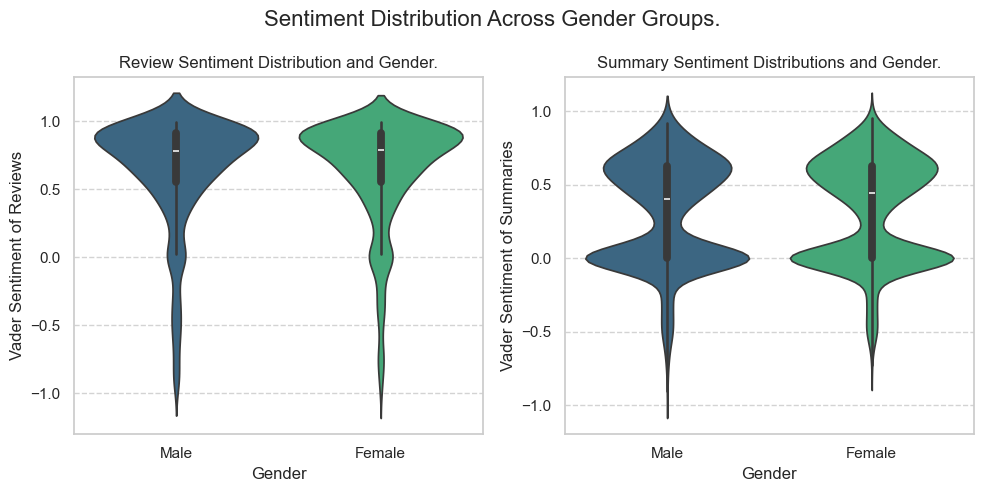

In [212]:
# Plot sentiments and Gender.

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# [0] Review Compound Sentiment using Vader vs Gender.
sns.violinplot(x="gender", y="compound_rev", data=reviews_sentiment, hue="gender", palette="viridis", ax=axes[0])
axes[0].set_xlabel("Gender")
axes[0].set_ylabel("Vader Sentiment of Reviews")
axes[0].set_title("Review Sentiment Distribution and Gender.")

# [1] Summary Compound Sentiment using Vader vs Gender.
sns.violinplot(x="gender", y="compound_sum", data=reviews_sentiment, hue="gender", palette="viridis", ax=axes[1])
axes[1].set_xlabel("Gender")
axes[1].set_ylabel("Vader Sentiment of Summaries")
axes[1].set_title("Summary Sentiment Distributions and Gender.")

fig.suptitle("Sentiment Distribution Across Gender Groups.", fontsize=16)
plt.tight_layout()
plt.show()

Sentiment to Turtle Games does not differ by gender.

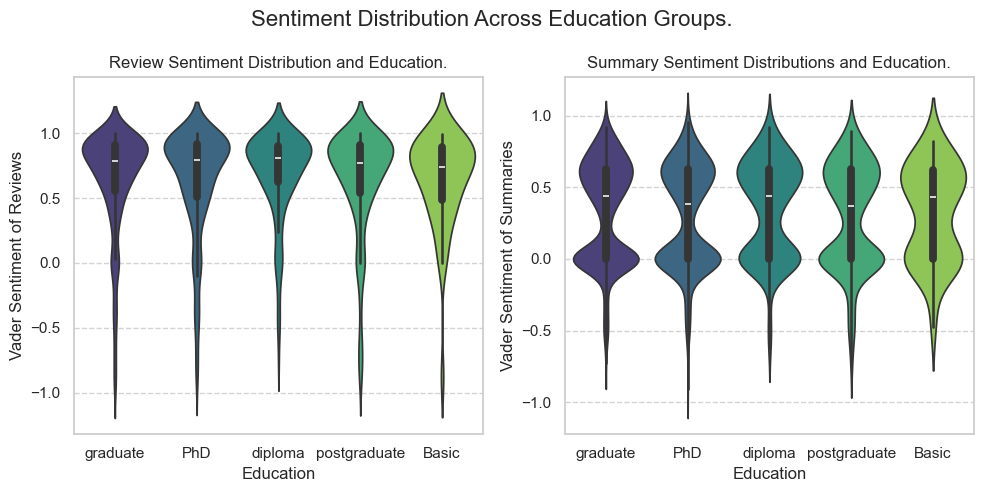

In [213]:
# Plot sentiments and Education.

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# [0] Review Compound Sentiment using Vader vs Education.
sns.violinplot(x="education", y="compound_rev", data=reviews_sentiment, hue="education", palette="viridis", ax=axes[0])
axes[0].set_xlabel("Education")
axes[0].set_ylabel("Vader Sentiment of Reviews")
axes[0].set_title("Review Sentiment Distribution and Education.")

# [1] Summary Compound Sentiment using Vader vs Gender.
sns.violinplot(x="education", y="compound_sum", data=reviews_sentiment, hue="education", palette="viridis", ax=axes[1])
axes[1].set_xlabel("Education")
axes[1].set_ylabel("Vader Sentiment of Summaries")
axes[1].set_title("Summary Sentiment Distributions and Education.")

fig.suptitle("Sentiment Distribution Across Education Groups.", fontsize=16)
plt.tight_layout()
plt.show()

Sentiment cannnot be classified by education levels.

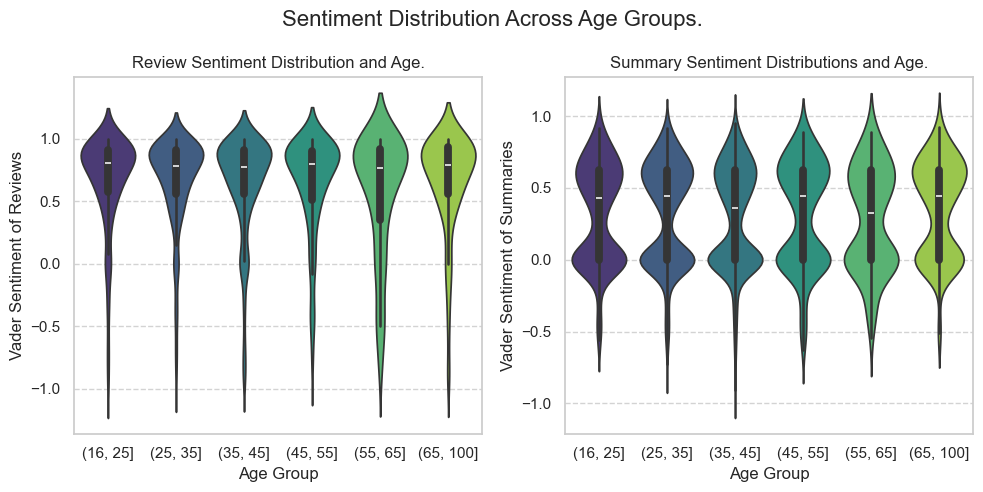

In [214]:
# Plot sentiments and age.
reviews_sentiment["age_group"] = pd.cut(
    reviews_sentiment["age"],
    bins=[16, 25, 35, 45, 55, 65, 100]
)


fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# [0] Review Compound Sentiment using Vader vs Age.
sns.violinplot(x="age_group", y="compound_rev", data=reviews_sentiment,  hue="age_group", palette="viridis", legend=False, ax=axes[0])
axes[0].set_xlabel("Age Group")
axes[0].set_ylabel("Vader Sentiment of Reviews")
axes[0].set_title("Review Sentiment Distribution and Age.")

# [1] Summary Compound Sentiment using Vader vs Age.
sns.violinplot(x="age_group", y="compound_sum", data=reviews_sentiment, hue="age_group", palette="viridis", legend=False, ax=axes[1])
axes[1].set_xlabel("Age Group")
axes[1].set_ylabel("Vader Sentiment of Summaries")
axes[1].set_title("Summary Sentiment Distributions and Age.")

fig.suptitle("Sentiment Distribution Across Age Groups.", fontsize=16)
plt.tight_layout()
plt.show()

There is no relation between Sentiment and Age.

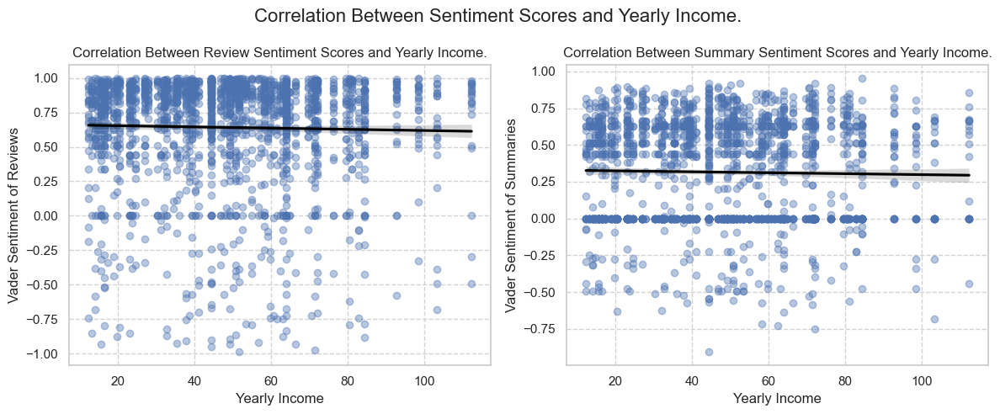

In [215]:
# Plot sentiments and Yearly Income.
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# [0] Review Compound Sentiment using Vader vs Yearly Income.
sns.regplot(x="yearly_income", y="compound_rev", data=reviews_sentiment, scatter_kws={"alpha": 0.4}, line_kws={"color": "black"},
            ax=axes[0])
axes[0].set_xlabel("Yearly Income")
axes[0].set_ylabel("Vader Sentiment of Reviews")
axes[0].set_title("Correlation Between Review Sentiment Scores and Yearly Income.")

# [1] Summary Compound Sentiment using Vader vs Yearly Income.
sns.regplot(x="yearly_income", y="compound_sum", data=reviews_sentiment, scatter_kws={"alpha": 0.4}, line_kws={"color": "black"},
            ax=axes[1])
axes[1].set_xlabel("Yearly Income")
axes[1].set_ylabel("Vader Sentiment of Summaries")
axes[1].set_title("Correlation Between Summary Sentiment Scores and Yearly Income.")

fig.suptitle("Correlation Between Sentiment Scores and Yearly Income.", fontsize=16)
plt.tight_layout()
plt.show()

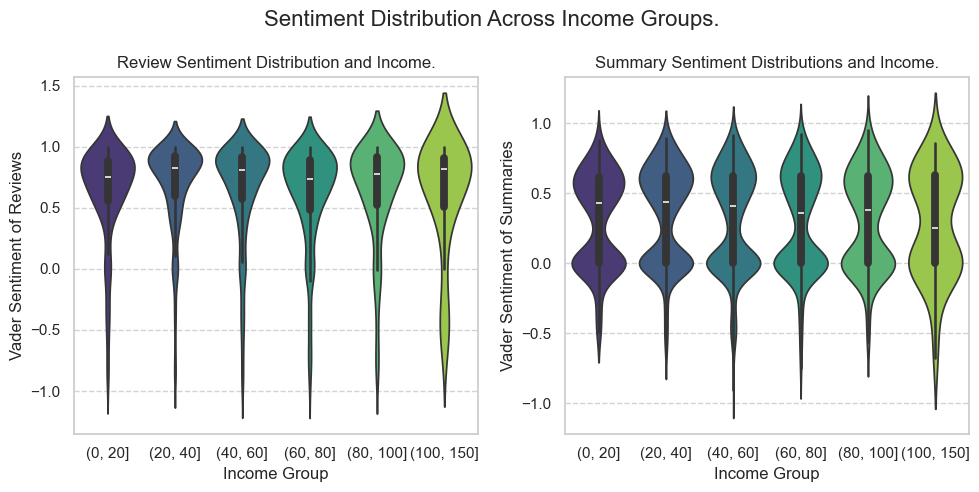

In [216]:
# Plot sentiments and Yearly Income.
reviews_sentiment["income_group"] = pd.cut(
    reviews_sentiment["yearly_income"],
    bins=[0, 20, 40, 60, 80, 100, 150]
)


fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# [0] Review Compound Sentiment using Vader vs Age.
sns.violinplot(x="income_group", y="compound_rev", data=reviews_sentiment, hue="income_group", palette="viridis", legend=False, ax=axes[0])
axes[0].set_xlabel("Income Group")
axes[0].set_ylabel("Vader Sentiment of Reviews")
axes[0].set_title("Review Sentiment Distribution and Income.")

# [1] Summary Compound Sentiment using Vader vs Age.
sns.violinplot(x="income_group", y="compound_sum", data=reviews_sentiment, hue="income_group", palette="viridis", legend=False, ax=axes[1])
axes[1].set_xlabel("Income Group")
axes[1].set_ylabel("Vader Sentiment of Summaries")
axes[1].set_title("Summary Sentiment Distributions and Income.")

fig.suptitle("Sentiment Distribution Across Income Groups.", fontsize=16)
plt.tight_layout()
plt.show()

There is no relation between Sentiment and Income.

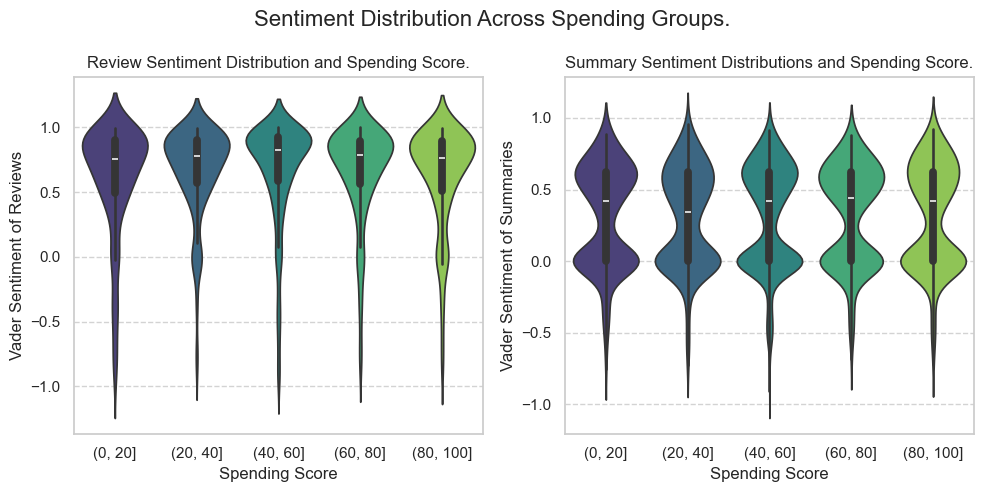

In [217]:
# Plot sentiments and Spending Score.
reviews_sentiment["spending_group"] = pd.cut(
    reviews_sentiment["spend_score"],
    bins=[0, 20, 40, 60, 80, 100]
)


fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# [0] Review Compound Sentiment using Vader vs Spending Score.
sns.violinplot(x="spending_group", y="compound_rev", data=reviews_sentiment, hue="spending_group", palette="viridis", legend=False, ax=axes[0])
axes[0].set_xlabel("Spending Score")
axes[0].set_ylabel("Vader Sentiment of Reviews")
axes[0].set_title("Review Sentiment Distribution and Spending Score.")

# [1] Summary Compound Sentiment using Vader vs Spending Score.
sns.violinplot(x="spending_group", y="compound_sum", data=reviews_sentiment, hue="spending_group", palette="viridis", legend=False, ax=axes[1])
axes[1].set_xlabel("Spending Score")
axes[1].set_ylabel("Vader Sentiment of Summaries")
axes[1].set_title("Summary Sentiment Distributions and Spending Score.")

fig.suptitle("Sentiment Distribution Across Spending Groups.", fontsize=16)
plt.tight_layout()
plt.show()

No difference in sentiment by spending groups.

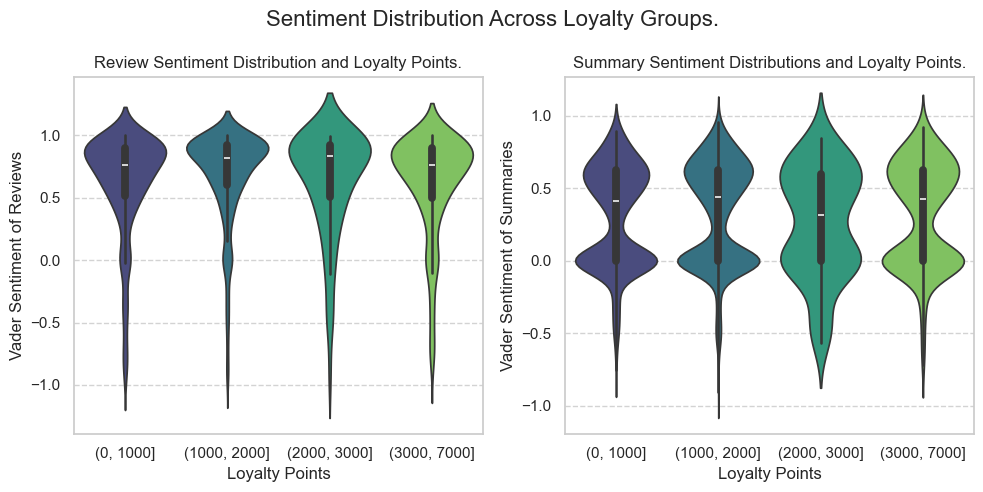

In [218]:
# Plot sentiments and Loyalty Points.
reviews_sentiment["loyalty_group"] = pd.cut(
    reviews_sentiment["loyalty_points"],
    bins=[0, 1000, 2000, 3000, 7000]
)


fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# [0] Review Compound Sentiment using Vader vs Spending Score.
sns.violinplot(x="loyalty_group", y="compound_rev", data=reviews_sentiment, hue="loyalty_group", palette="viridis", legend=False, ax=axes[0])
axes[0].set_xlabel("Loyalty Points")
axes[0].set_ylabel("Vader Sentiment of Reviews")
axes[0].set_title("Review Sentiment Distribution and Loyalty Points.")

# [1] Summary Compound Sentiment using Vader vs Spending Score.
sns.violinplot(x="loyalty_group", y="compound_sum", data=reviews_sentiment, hue="loyalty_group", palette="viridis", legend=False, ax=axes[1])
axes[1].set_xlabel("Loyalty Points")
axes[1].set_ylabel("Vader Sentiment of Summaries")
axes[1].set_title("Summary Sentiment Distributions and Loyalty Points.")

fig.suptitle("Sentiment Distribution Across Loyalty Groups.", fontsize=16)
plt.tight_layout()
plt.show()

There does not seem to be a correlation between sentiments and loyalty point accumulation.

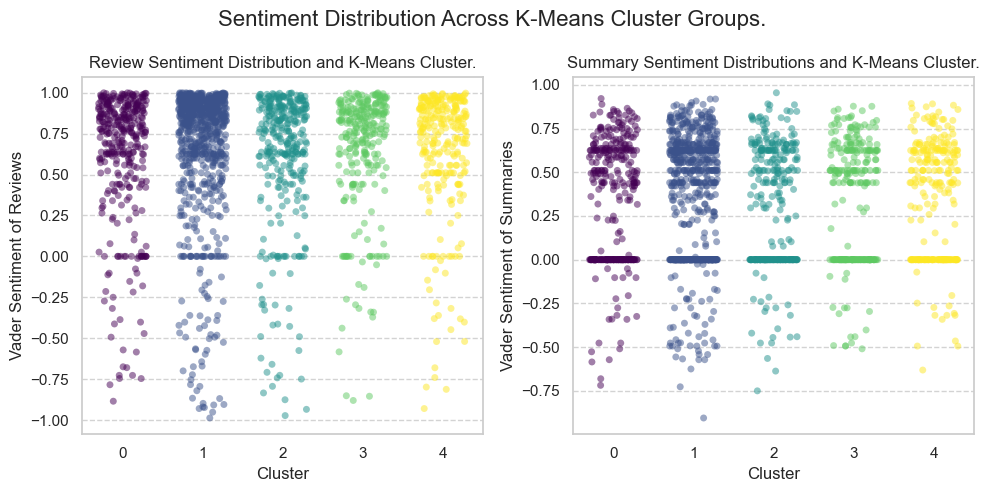

In [219]:
# Plot sentiments and Clusters.

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# [0] Review Compound Sentiment using Vader vs K-Means Cluster.
sns.stripplot(x="cluster", y="compound_rev", data=reviews_sentiment, jitter=0.3, alpha=0.5, hue="cluster", palette="viridis", legend=False, ax=axes[0])
axes[0].set_xlabel("Cluster")
axes[0].set_ylabel("Vader Sentiment of Reviews")
axes[0].set_title("Review Sentiment Distribution and K-Means Cluster.")

# [1] Summary Compound Sentiment using Vader vs K-Means Cluster.
sns.stripplot(x="cluster", y="compound_sum", data=reviews_sentiment, jitter=0.3, alpha=0.5, hue="cluster", palette="viridis", legend=False,  ax=axes[1])
axes[1].set_xlabel("Cluster")
axes[1].set_ylabel("Vader Sentiment of Summaries")
axes[1].set_title("Summary Sentiment Distributions and K-Means Cluster.")

fig.suptitle("Sentiment Distribution Across K-Means Cluster Groups.", fontsize=16)
plt.tight_layout()
plt.show()

There is also no association between customer clusters and sentiment.

In [220]:
print("There are", len(reviews_sentiment["product"].unique()), "products.")
print("There are", len(reviews_sentiment), "reviews.")


There are 200 products.
There are 1982 reviews.


In [221]:
# Find products with highest sentiments.
rev_products = reviews_sentiment.groupby("product")["compound_rev"].mean()

In [231]:
print("Products with top 20 average Sentiment")
rev_products.sort_values(ascending=False).head(20)

Products with top 20 average Sentiment


product
5493     0.87834
4452     0.87677
2874     0.85549
830      0.84292
6233     0.83250
8933     0.82932
1592     0.82816
876      0.82620
504      0.82266
2371     0.82066
9635     0.81944
3498     0.81737
3267     0.81511
11084    0.80395
2457     0.80162
3878     0.80065
615      0.80051
930      0.80026
3967     0.79649
979      0.79545
Name: compound_rev, dtype: float64

In [232]:
print("Products with Bottom 20 average Sentiment")
rev_products.sort_values().head(20)

Products with Bottom 20 average Sentiment


product
10241    0.192050
2079     0.201750
9597     0.211690
7600     0.213370
3711     0.260100
535      0.342990
5430     0.345140
6287     0.345970
11004    0.352960
5510     0.371900
1012     0.386482
6215     0.386940
7381     0.389860
3158     0.401680
2795     0.411780
1241     0.417710
518      0.427830
1940     0.439890
5512     0.443010
6678     0.451290
Name: compound_rev, dtype: float64

These are important products for Turtle Games to focus on:
- Positive sentiment products: Important for Sales Team
- Negative sentiment products: Important for Customer Service/ Product Development / Research Development Teams.

## Analyse whether review length (number of words) is related to sentiment

In [224]:
# Count words in reviews.
sentiment_df["review_word_count"] = sentiment_df["review"].str.split().str.len()

In [225]:
# Check correlation.
sentiment_df[["review_word_count", "compound_rev"]].corr()

,review_word_count,compound_rev
review_word_count,1.000000,0.150277
compound_rev,0.150277,1.000000


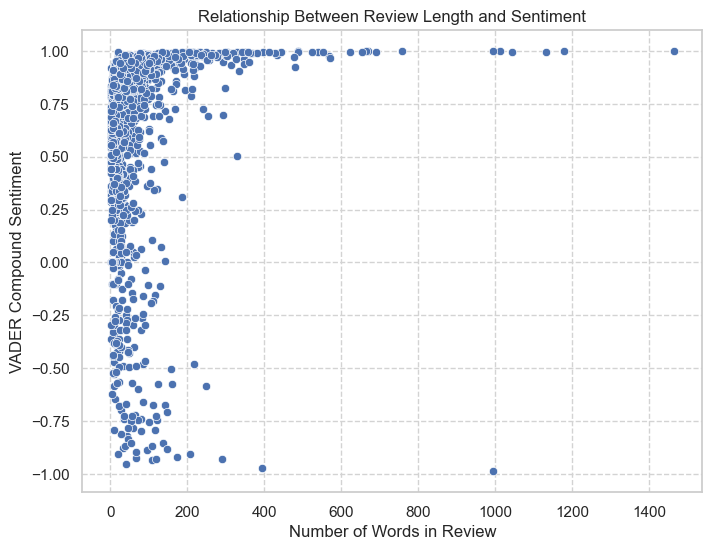

In [226]:
# Plot relationship.
sns.scatterplot(
    data=sentiment_df,
    x="review_word_count",
    y="compound_rev"
)
plt.xlabel("Number of Words in Review")
plt.ylabel("VADER Compound Sentiment")
plt.title("Relationship Between Review Length and Sentiment")
plt.show()

In [227]:
# Use spearman's rho (robust to outliers compared to Pearson's r)
rho, pval = spearmanr(
    sentiment_df["review_word_count"],
    sentiment_df["compound_rev"]
)

print("rho:", rho)
print("p value:", pval)

rho: 0.4917075572783584
p value: 3.6352180942590825e-121


#### There is a significant correlation between number of words and sentiment.
#### Although most reviews are between 0-200 words, longer reviews are more likely to be positive than negative.

In [228]:
# Split data into 3 groups: short, medium, and long reviews.
sentiment_df["length_group"] = pd.qcut(
    sentiment_df["review_word_count"],
    q=3,
    labels=["Short", "Medium", "Long"]
)

# check mean
sentiment_df.groupby("length_group")["compound_rev"].mean()

length_group
Short     0.537357
Medium    0.664047
Long      0.726590
Name: compound_rev, dtype: float64

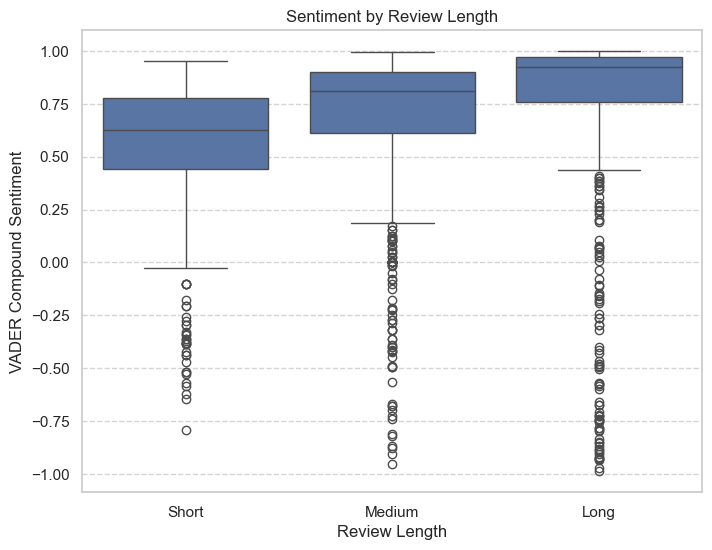

In [229]:
# Plot
sns.boxplot(
    data=sentiment_df,
    x="length_group",
    y="compound_rev"
)
plt.xlabel("Review Length")
plt.ylabel("VADER Compound Sentiment")
plt.title("Sentiment by Review Length")
plt.show()


There is a trend with higher sentiment scores with longer reviews.

In [230]:
# Kruskal–Wallis test (non-parametric ANOVA)
short = sentiment_df.loc[sentiment_df["length_group"] == "Short", "compound_rev"]
medium = sentiment_df.loc[sentiment_df["length_group"] == "Medium", "compound_rev"]
long = sentiment_df.loc[sentiment_df["length_group"] == "Long", "compound_rev"]

stat, pval = kruskal(short, medium, long)

print("Stat:", stat)
print("p value:", pval)

Stat: 399.5309840029661
p value: 1.7496418135226065e-87


This trend is significant.